# Introduction
This notebook is a detailed record of the methodology of this project. We will be relying on the PCA method to extract statistical factors and see if we can 1) find any meaning for the extracted factors, 2) determine whether the behavior of residuals is appropriate for trading, and 3) trade the residuals to earn non-trivial profits (possibly compare with benchmark methods). The overall process will rely on the paper by Avellaneda(2010). 

The overall project will be divided into 8 sections. The first notebook will cover 1 ~ 4. The second notebook will cover 5 ~ 8.

1. PCA and Eigenportfolios
2. Construct Mean Reverting Series
3. Analysis of Mean Reversion Property
4. Generate Signal Lines
5. Backtesting
6. Optimization
7. Results
8. Bonus Strategy

# 1. PCA and Eigenportfolios

## 1-1. Static PCA Analysis

In [ ]:
# Import necessary libraries for PCA analysis
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
import numpy as np
import pandas as pd
import os
from pathlib import Path
import json
import pickle

# Get the current working directory (Jupyter Notebook location)
notebook_dir = Path.cwd()
print("Notebook Directory:", notebook_dir)

# Define the data path relative to the notebooks folder
data_dir = notebook_dir.parent / "data" 
print("Data Directory:", data_dir)


with open(data_dir / "target_dict.json", "r", encoding = "utf-8") as f:
  target_dict = json.load(f)

with open(data_dir / "parent_df.pkl", "rb") as g:
  parent_df = pickle.load(g)

# Check data is imported without a problem
print(target_dict["2022-07-01"])
parent_df.head()

Notebook Directory: c:\Users\idkup\Jay-coding-local\Python\PCA-in-Finance\notebooks
Data Directory: c:\Users\idkup\Jay-coding-local\Python\PCA-in-Finance\data
['algorand', 'avalanche', 'bitcoin', 'bitcoin-cash', 'bnb', 'cardano', 'chainlink', 'cosmos', 'cronos', 'dogecoin', 'ethereum', 'ftx-token', 'hex', 'litecoin', 'monero', 'near-protocol', 'polkadot-new', 'polygon', 'shiba-inu', 'solana', 'stellar', 'tron', 'uniswap', 'unus-sed-leo', 'xrp']


C:\Users\idkup\AppData\Local\Temp\ipykernel_48904\4290059109.py:28: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  parent_df = pickle.load(g)


,algorand,avalanche,bitcoin,bitcoin-cash,bnb,cardano,chainlink,cosmos,cronos,dogecoin,...,shiba-inu,solana,stacks,stellar,terra-luna,toncoin,tron,uniswap,unus-sed-leo,xrp
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-01-01,1.740108,114.158010,47686.811509,444.456189,527.352722,1.376975,20.665088,36.170463,0.585303,0.173035,...,0.000034,178.517941,2.283105,0.276335,91.360588,3.797868,0.076610,17.444497,3.803560,0.849472
2022-01-02,1.674041,113.186336,47345.220564,447.832642,531.396645,1.377584,21.831890,35.603454,0.587698,0.174403,...,0.000034,176.382841,2.391267,0.291703,89.371671,3.488948,0.077782,18.369281,3.779418,0.859118
2022-01-03,1.788210,108.145212,46458.116959,434.943840,512.135964,1.321637,23.573905,39.300069,0.567292,0.170088,...,0.000033,170.297747,2.297845,0.290181,88.748696,3.388726,0.077081,18.440538,3.795962,0.832885
2022-01-04,1.674683,103.239241,45897.575827,427.524334,507.506111,1.311658,23.525865,41.987126,0.551803,0.168803,...,0.000032,167.938906,2.348068,0.279667,84.581089,3.459638,0.076200,18.260072,3.783945,0.824673
2022-01-05,1.559897,97.852579,43569.003348,401.572519,475.056933,1.236002,25.447802,38.793359,0.504330,0.159420,...,0.000030,155.099733,2.244129,0.267280,78.593797,3.342235,0.071382,17.203540,3.801806,0.774358


In [5]:
# Define the desired date
desired_date = '2022-07-01'
desired_coins = target_dict[desired_date]
# Load the desired dataframe
df_desired = parent_df[desired_coins]
print(df_desired)  # This will print the dataframe if run as a script

            algorand   avalanche       bitcoin  bitcoin-cash         bnb  \
timestamp                                                                  
2022-01-01  1.740108  114.158010  47686.811509    444.456189  527.352722   
2022-01-02  1.674041  113.186336  47345.220564    447.832642  531.396645   
2022-01-03  1.788210  108.145212  46458.116959    434.943840  512.135964   
2022-01-04  1.674683  103.239241  45897.575827    427.524334  507.506111   
2022-01-05  1.559897   97.852579  43569.003348    401.572519  475.056933   
...              ...         ...           ...           ...         ...   
2024-08-01  0.134730   25.723108  65357.501563    413.147226  575.146705   
2024-08-02  0.124071   23.594503  61415.064573    381.553088  542.915190   
2024-08-03  0.120628   22.683568  60680.094699    364.384602  529.481326   
2024-08-04  0.114632   21.227669  58116.976961    331.857666  497.039094   
2024-08-05  0.110250   19.549341  53991.457797    309.955755  464.626909   

           

In [13]:
# sim_ret
target_price = df_desired.copy()
sim_ret = (target_price / target_price.shift(1) - 1).dropna()

# filter for coins that didn't recover from 50% of initial equity
sim_port = np.cumprod(1+sim_ret)
bad_coins = sim_port.columns[sim_port.iloc[-1].values < 0.1]

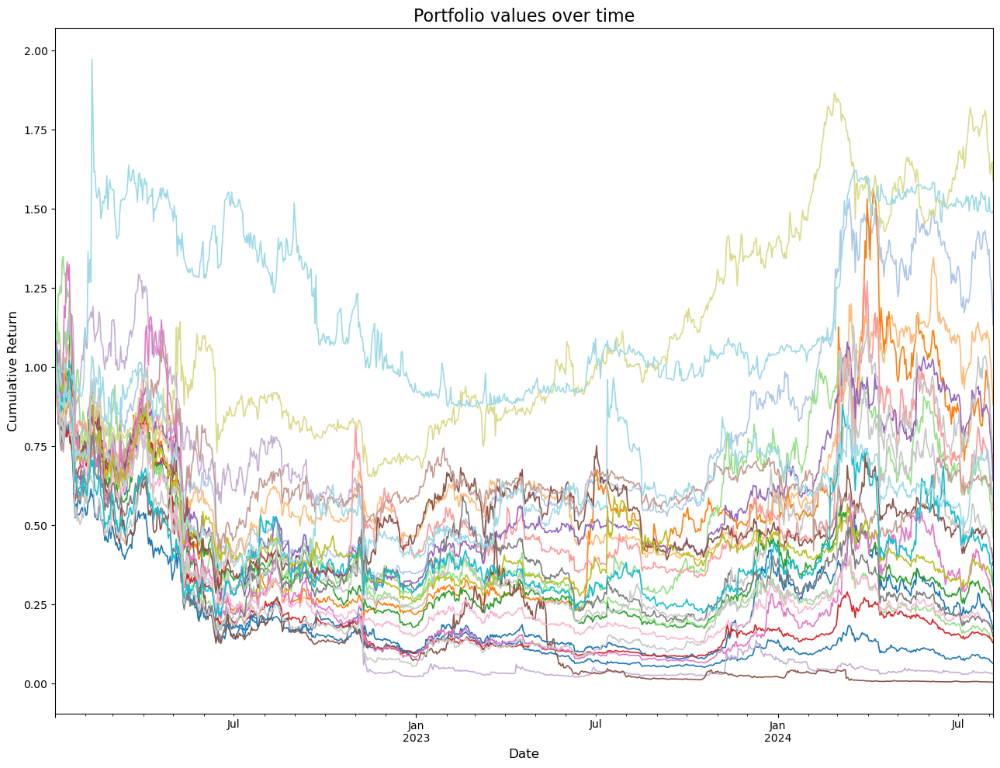

In [17]:
# Visualization
np.cumprod(1+ sim_ret).plot(figsize=(13, 10), linewidth=1.2, colormap='tab20', legend = False)
plt.title("Portfolio values over time", fontsize = 16)
plt.xlabel("Date", fontsize = 12)
plt.ylabel("Cumulative Return", fontsize = 12)
plt.tight_layout()

Text(0, 0.5, 'Cumulative Return')

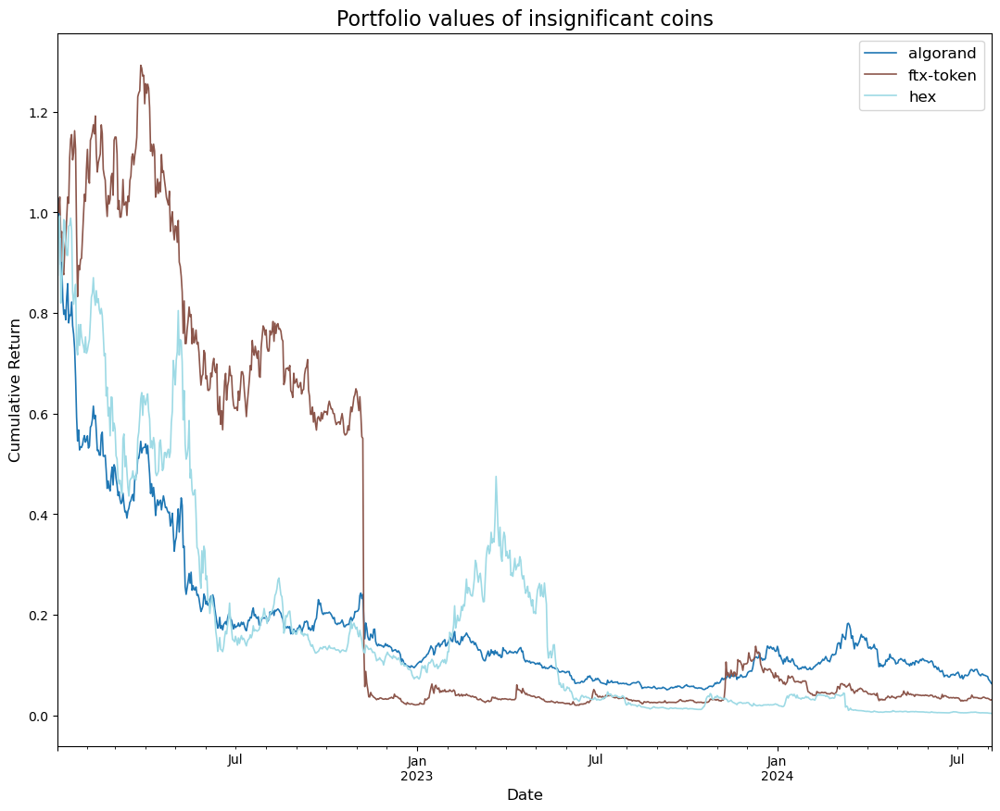

In [18]:
# Plot bad coins
sim_port.loc[:,bad_coins].plot(figsize=(13, 10), linewidth=1.2, colormap='tab20')
plt.title("Portfolio values of insignificant coins", fontsize = 16)
plt.legend(loc = "upper right", fontsize = 12, ncol = 1)
plt.xlabel("Date", fontsize = 12)
plt.ylabel("Cumulative Return", fontsize = 12)


##### Remarks
- From 2022 January 1st to 2024 August 5th, overall market for cryptocurrencies wasn't that bright. Bitcoin only was able to reclaim its initial high after January 2024.
- We see many coins going obsolete, indicating the need to dynamically update our target list at least every few months.


#### Deviation - sci-kit learn PCA vs numpy eigh

PCA can be understood as doing an eigenvector decomposition on the covariance matrix and at the same time finding the right singular vector of the data matrix (given your matrix is nxp, n observations and p features).

Extracting the principal components via SVD is actually more numerically stable and the class itself offers more attributes that we can comfortably use.

So for the rolling window analysis, we will be relying on sci-kit learn's PCA().

However, it is always important to check that we know what we are doing. Hence, we will compare numpy's eigh with sci-kit learn's PCA to understand the various methods and attributes that trail sci-kit learn's method.

We will use the first 180 days worth of data to conduct PCA.

A note to make while doing standardization. One can use StandardScaler() from sklearn and this will result in a different dataframe compared to the manual standardization. This is because scikit learn uses np.std() which is the population standard deviation, while the pd attribute df.std is the sample standard deviation (Bessel's correction). If we use `df.std(ddof=0)` then there will be no difference between the two methods.

We will be using the sample standard deviation.

**np.linalg.eigh**
- This is a method used for Hermitian matrices (symmetric). It is faster than eig() which is used for general matrices.
- The eigenvalues are sorted in increasing order.
- The eigenvectors is an multidimensional array where each column is the noramlized eigenvector of the correlation matrix. Thus, it returns matrix $V$.

**sklean's PCA**
- Assumes nxp matrix, n for number of observations, p for number of features
- Input should be the data matrix not the covariance matrix
- One of the attributes, singular_values_, is unscaled version of the square root of the eigenvalue (of covariance matrix)

In [19]:
# PCA via eigenvalue decomposition in numpy
end_date = datetime.strptime("2022-07-01", "%Y-%m-%d")
end_index = sim_ret.index.get_loc(end_date)

# Slice data
test_data = sim_ret.iloc[0: end_index]

# standardize data manually
test_data_std = (test_data - test_data.mean()) / test_data.std()

corr_mat = test_data_std.cov() # Set rowvar to False to deem column as feature

eig_values, eig_vectors = np.linalg.eigh(corr_mat)

sorted_idx = np.argsort(eig_values)[::-1] # By default, eigenvalues are ordered in increasing order
eig_values = eig_values[sorted_idx]
eig_vectors = eig_vectors[:, sorted_idx]

In [20]:
n_samples = test_data_std.shape[0]
singular_val = np.sqrt(eig_values * (n_samples - 1)) # scaled eig-value, representing "strength" of that principal axis
explained_var_ratio = eig_values / np.sum(eig_values) 

print(explained_var_ratio)

[0.7084042  0.04073398 0.03351253 0.02364397 0.0229558  0.02147834
 0.01756204 0.01529623 0.01303467 0.01227156 0.01065147 0.00951057
 0.00913519 0.00877724 0.0079766  0.00740992 0.00681218 0.00569281
 0.00530029 0.00456847 0.00422057 0.00349104 0.00274407 0.0025724
 0.00224386]


In [21]:
# PCA via sklearn
pca_test = PCA()
pca_test.fit(test_data_std)

pca_test.components_.T # Note that the transpose is equal to eig_vectors from eigendecomposition
pca_test.explained_variance_ # Same as eigenvalues of correlation matrix
pca_test.singular_values_ # Same as square root of eig_values scaled by (number of samples - 1)
pca_test.explained_variance_ratio_ # eig_value divided by sum of eig_value
cumulative_explained_var_ratio = np.cumsum((pca_test.explained_variance_ratio_))

In [22]:
# Numpy: Project standardized data to first five principal components
npeigh_df = pd.DataFrame(test_data_std @ eig_vectors[:, 0:5])
npeigh_df.columns

npeigh_df.columns = [f"PC {i+1}" for i in range(5)]

print(npeigh_df)

                PC 1      PC 2      PC 3      PC 4      PC 5
timestamp                                                   
2022-01-02  0.789931  0.190301  0.809751 -1.723658  0.484782
2022-01-03  0.184916  0.212610 -2.616917  0.939485  0.381406
2022-01-04 -0.786072  0.021072 -0.614913  0.506320 -0.114148
2022-01-05 -5.088089 -0.130314 -0.321325 -1.320617  1.679747
2022-01-06  0.606787  0.359413 -0.696599 -0.069888 -0.306068
...              ...       ...       ...       ...       ...
2022-06-26 -3.017398  0.111923  1.985606 -0.513690  0.023239
2022-06-27 -0.901088  0.504714  0.730638 -0.379510 -0.182096
2022-06-28 -4.334160 -0.199868  0.745873 -0.043831  0.726458
2022-06-29 -0.797621 -0.225008  0.159656  0.024244 -0.305050
2022-06-30 -0.324131  0.520038 -0.507997 -1.004952 -0.117095

[180 rows x 5 columns]


In [23]:
# Sklearn: Project standardized data to first five principal components
sklearn_df = pd.DataFrame(pca_test.transform(test_data_std), columns = [f"PC {i+1}" for i in range(0, pca_test.n_components_)], index = test_data_std.index).iloc[:,:5]

print(sklearn_df)

                PC 1      PC 2      PC 3      PC 4      PC 5
timestamp                                                   
2022-01-02  0.789931 -0.190301 -0.809751 -1.723658 -0.484782
2022-01-03  0.184916 -0.212610  2.616917  0.939485 -0.381406
2022-01-04 -0.786072 -0.021072  0.614913  0.506320  0.114148
2022-01-05 -5.088089  0.130314  0.321325 -1.320617 -1.679747
2022-01-06  0.606787 -0.359413  0.696599 -0.069888  0.306068
...              ...       ...       ...       ...       ...
2022-06-26 -3.017398 -0.111923 -1.985606 -0.513690 -0.023239
2022-06-27 -0.901088 -0.504714 -0.730638 -0.379510  0.182096
2022-06-28 -4.334160  0.199868 -0.745873 -0.043831 -0.726458
2022-06-29 -0.797621  0.225008 -0.159656  0.024244  0.305050
2022-06-30 -0.324131 -0.520038  0.507997 -1.004952  0.117095

[180 rows x 5 columns]


Okay both methods are same, so we know that for sklearn, `pca.transform()` is right-multiplying the transpose of the `components_` attribute to the data matrix.

Actually, one caveat is that for some principal components (columns), the signs are different. This is completely expected, since eigenvectors are not unique and the direction of the sign is dependent on the internal algorithm.

However, for consistency, we can force one of the dataframe to have same signs as the other dataframe.

Hence, we add one more step to match signs.

In [24]:
# Enforce sign consistency across PCs
for i in range(5):
  if np.sign(npeigh_df.iloc[0,i]) != np.sign(sklearn_df.iloc[0,i]):
    sklearn_df.iloc[:,i] *= -1


In [25]:
print(sklearn_df.iloc[0,:5])
print(npeigh_df.iloc[0,:5])

PC 1    0.789931
PC 2    0.190301
PC 3    0.809751
PC 4   -1.723658
PC 5    0.484782
Name: 2022-01-02 00:00:00, dtype: float64
PC 1    0.789931
PC 2    0.190301
PC 3    0.809751
PC 4   -1.723658
PC 5    0.484782
Name: 2022-01-02 00:00:00, dtype: float64


Great. now, let's take a look at `inverse_transform()` method offered by Sklearn.

In [26]:
pd.DataFrame(pca_test.inverse_transform(pca_test.fit_transform(test_data_std)))

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,-0.552938,-0.002866,-0.080449,0.321060,0.277721,0.087385,1.072104,-0.141590,0.231191,0.220650,...,-0.586926,0.829229,-0.041315,0.027370,-0.075341,1.343371,0.329320,0.986958,-0.182172,0.330956
1,1.401661,-0.552922,-0.393280,-0.476485,-0.770340,-0.639703,1.479363,1.730683,-0.531192,-0.390335,...,1.917560,0.335587,-0.620080,-0.356521,-0.435603,-0.027124,-0.198307,0.153803,0.015515,-0.564820
2,-1.022758,-0.565539,-0.212956,-0.219491,-0.121053,-0.054177,0.050886,1.175212,-0.385454,-0.068755,...,-0.261176,-0.679020,-0.315434,-0.208264,-0.105569,-0.726010,-0.250711,-0.077921,-0.123531,-0.122699
3,-1.115847,-0.669543,-1.258145,-1.176355,-1.431272,-0.941975,1.512573,-1.087717,-1.539013,-0.967557,...,-0.449516,-1.122461,-1.054430,-0.878416,-1.106156,-0.907505,-1.375561,-0.893104,0.021833,-1.216551
4,0.226574,-0.287023,-0.139994,0.103552,0.005214,0.706876,0.038038,0.660190,0.135627,0.165807,...,0.585672,0.086803,0.527098,0.217326,-0.365272,0.158108,-0.084638,-0.019766,-0.229323,0.281120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,-0.841269,-1.069068,-0.483983,-0.262398,-0.485986,-0.250291,-1.176391,-1.002221,-0.565230,1.349763,...,-1.168976,-0.545937,-0.951516,-0.966374,-0.988474,-1.096291,0.014153,-0.019180,-0.014842,-0.417561
176,-0.002166,-0.163554,-0.261947,-0.165974,0.073813,-0.060149,-0.398065,-0.319094,0.151125,-0.167040,...,-0.099328,-0.098575,-0.688130,0.165427,-0.272262,-0.140092,0.701879,-0.697469,-0.533768,-0.247291
177,-0.818106,-0.818654,-0.479735,-1.469653,-0.592385,-0.508107,-0.541189,-0.885598,-0.536910,-1.555014,...,-1.053734,-0.893134,-0.537175,-1.420688,-1.183124,-0.770501,-0.337555,-1.281747,-0.104397,-0.874743
178,-0.645405,-0.313540,-0.122216,0.416431,-0.709108,-0.077384,-0.223144,0.179018,-0.345801,1.069077,...,0.066209,-0.626672,-0.382978,0.384386,-0.541387,-0.821184,-0.399853,0.721226,0.463668,-0.441287


We see that `inverse_transform()` is simply just right multiplying the transpose of the eigenvector matrix again.

Since we are now comfortable what each attribute and method signifies, we can go back to our main analysis.


***

First, we look at some visualizations that would enhance our understanding regarding the PCs.

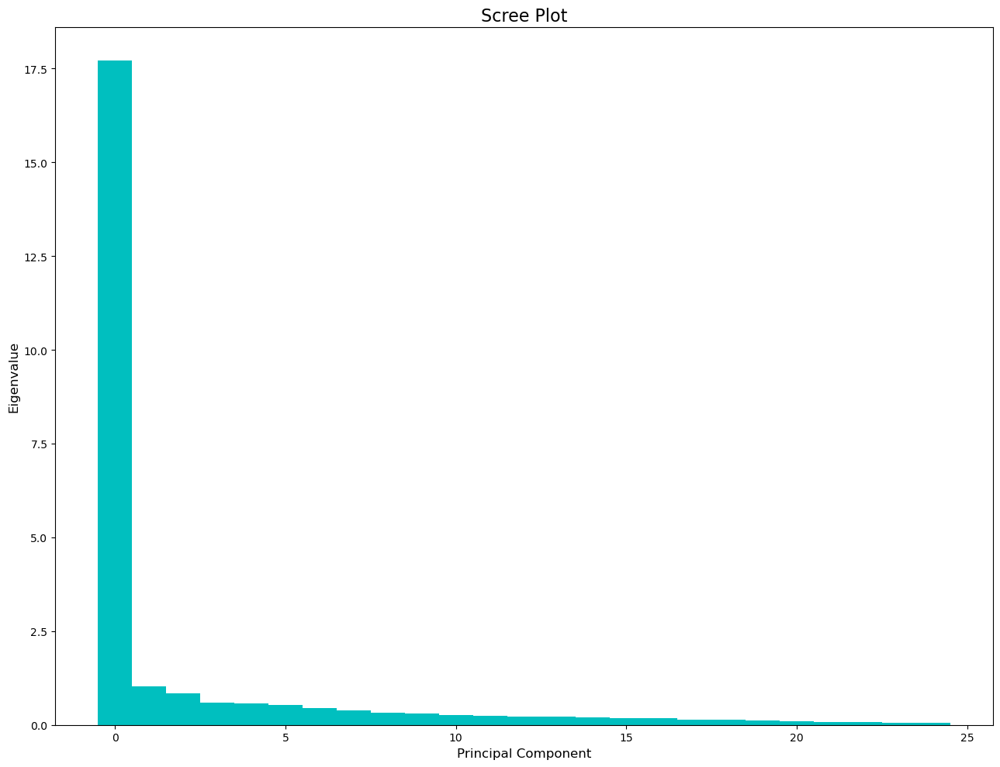

In [29]:
# Scree plot

plt.figure(figsize = (13,10))
plt.bar(range(len(eig_values)), eig_values, width = 1, color = "c")
plt.title("Scree Plot", fontsize = 16)
plt.xlabel("Principal Component", fontsize = 12)
plt.ylabel("Eigenvalue",fontsize = 12)
plt.tight_layout()


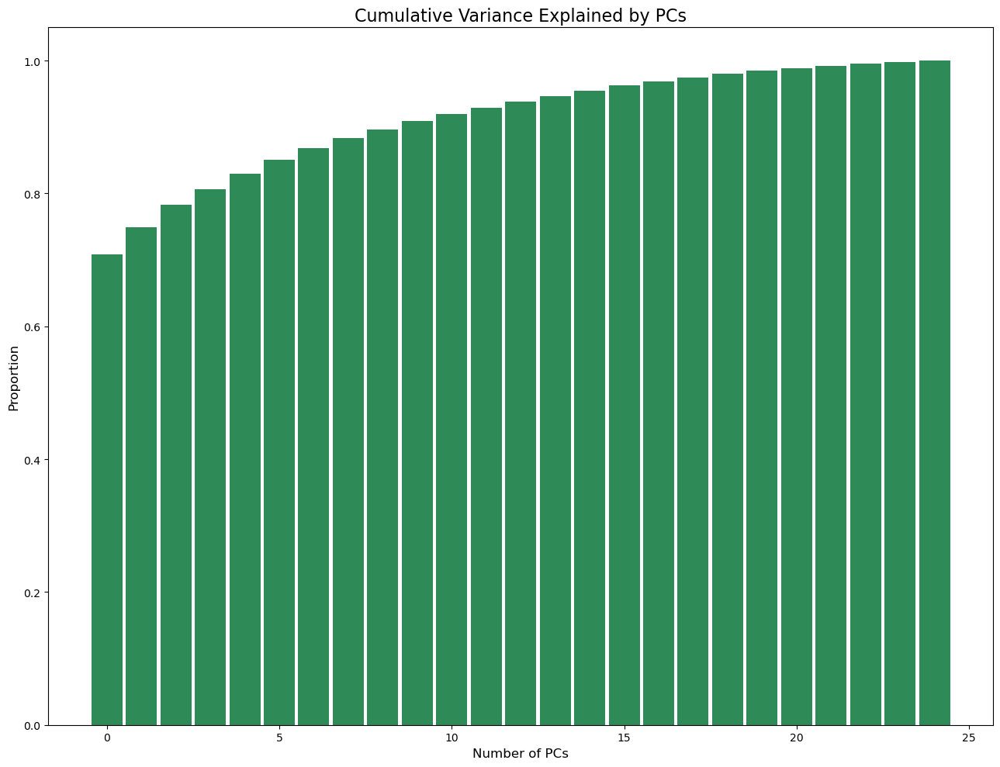

In [30]:
# Cumulative Variance Explained

plt.figure(figsize = (13,10))
plt.bar(range(len(cumulative_explained_var_ratio)), cumulative_explained_var_ratio, width = 0.9, color = "seagreen")
plt.title("Cumulative Variance Explained by PCs",fontsize = 16)
plt.xlabel("Number of PCs",fontsize = 12)
plt.ylabel("Proportion",fontsize = 12)
plt.tight_layout()

We see that the first five components explain already 80% of our standardized return variance.

Thus, this provides a hint that we might not need more than 5 principal components to construct our eigenportfolios. 

Next, we take a look at our eigenportfolios.

In [31]:
# Construct Eigenportfolios from first five eigenvectors
print(test_data.std().values.shape)
print(eig_vectors.shape)

(25,)
(25, 25)


In [32]:
test_data.std().values

array([0.05431625, 0.06549629, 0.03699673, 0.04561153, 0.04190002,
       0.05646314, 0.05728486, 0.063828  , 0.05091184, 0.05342923,
       0.04552959, 0.04379694, 0.08045976, 0.04818448, 0.05836623,
       0.0759286 , 0.05585253, 0.06180911, 0.06601402, 0.06256341,
       0.04438268, 0.04605787, 0.05897316, 0.05425056, 0.04676404])

In [33]:
# Volatility Weighting
Q = eig_vectors / test_data.std().values[:, np.newaxis]

# Normalize by 1 (axis = 0 to collapse the rows so we sum column-wise)
Q /= abs(Q).sum(axis = 0, keepdims = True)

# Naive weighting
norm_eigvec = eig_vectors.copy()
norm_eigvec /= abs(eig_vectors).sum(axis = 0 , keepdims = True)

##### Remark
- Becareful when we do division for different sized arrays. `test_data.std().values`, a 1D array, is treated as a row vector, so performing the division divides each column by the same number, meaning that we are normalizing the weights by the same volatility for each eigenportfolio. Hence, to do it properly, we convert `test_data.std().values` to a column vector first and then perform the division.

In [34]:
norm_eigvec[0:2]

array([[ 0.04279343,  0.03071379, -0.02032353, -0.01845863,  0.01446782,
        -0.06866806,  0.02387268, -0.01358045,  0.00050946,  0.05155412,
         0.01536576,  0.02354711,  0.03280633, -0.01034976,  0.06876825,
         0.21578859,  0.09733073, -0.01110413,  0.00819708,  0.0345278 ,
         0.01853154,  0.023925  ,  0.01614259,  0.02759302,  0.02853357],
       [ 0.0440014 , -0.02128058, -0.04758853, -0.01085446,  0.03870529,
        -0.01071342, -0.00683584,  0.01809059, -0.0005828 ,  0.08104055,
         0.05424164,  0.04511705, -0.06118639,  0.02139218,  0.03565721,
        -0.05657868,  0.02154609, -0.04858983,  0.01682666, -0.11483544,
         0.05911387, -0.14560867,  0.0489979 ,  0.04094935, -0.05182554]])

In [35]:
Q[0:2]

array([[ 0.04154726,  0.02991415, -0.02165838, -0.01835493,  0.01570344,
        -0.06456043,  0.02381604, -0.01333733,  0.00051671,  0.05283548,
         0.01543921,  0.02295101,  0.03436137, -0.00996905,  0.0708307 ,
         0.20711029,  0.0931722 , -0.01075495,  0.00753746,  0.03259619,
         0.01753663,  0.02421582,  0.01493317,  0.02406693,  0.02584513],
       [ 0.03542786, -0.01718857, -0.04205738, -0.00895106,  0.03483976,
        -0.0083532 , -0.00565553,  0.01473399, -0.00049019,  0.06887755,
         0.04519774,  0.03646851, -0.05314724,  0.017088  ,  0.03045748,
        -0.04503385,  0.0171048 , -0.03902854,  0.01283149, -0.08990562,
         0.04639135, -0.12222151,  0.03758973,  0.02961976, -0.03892956]])

##### Remarks
- Q denotes our eigenportfolio weights (each column corresponds to principal eigenfactor).
- The 1st eigenportfolio has only positive weights. This is consistent with theory that the first eigenportfolio closely tracks the "market" portfolio.
- This is **not a dollar neutral portfolio**. That is, the net weight of each eigenportfolio can be either positive or negative. In practice, after the overall exposure can be neutralized by taking an opposite position in the market index (bitcoin or ethereum).



In [36]:
# daily sample standard deviation over 180-day period
test_data.std()

algorand         0.054316
avalanche        0.065496
bitcoin          0.036997
bitcoin-cash     0.045612
bnb              0.041900
cardano          0.056463
chainlink        0.057285
cosmos           0.063828
cronos           0.050912
dogecoin         0.053429
ethereum         0.045530
ftx-token        0.043797
hex              0.080460
litecoin         0.048184
monero           0.058366
near-protocol    0.075929
polkadot-new     0.055853
polygon          0.061809
shiba-inu        0.066014
solana           0.062563
stellar          0.044383
tron             0.046058
uniswap          0.058973
unus-sed-leo     0.054251
xrp              0.046764
dtype: float64

In [41]:
# Compute eigenportfolio returns using volatility weighting
vw_eigenport_df = pd.DataFrame(test_data @ Q).iloc[:, 0 : 5]
vw_eigenport_df.columns = [f"PC {i+1}" for i in range(5)]

np.cumprod(1 + vw_eigenport_df).head()

,PC 1,PC 2,PC 3,PC 4,PC 5
timestamp,,,,,
2022-01-02,1.003431,1.002716,1.015697,0.976436,1.008127
2022-01-03,1.000365,1.005981,0.969816,0.989074,1.014494
2022-01-04,0.986892,1.004587,0.960496,0.996002,1.012085
2022-01-05,0.928075,0.999508,0.956275,0.978035,1.041517
2022-01-06,0.929437,1.006320,0.945698,0.977160,1.035539


In [40]:
# Compute eigenportfolio returns using naive weighting
nw_eigenport_df = pd.DataFrame(test_data @ norm_eigvec).iloc[:, 0:5]
nw_eigenport_df.columns = [f"PC {i+1}" for i in range(5)]

np.cumprod(1+ nw_eigenport_df).head()

,PC 1,PC 2,PC 3,PC 4,PC 5
timestamp,,,,,
2022-01-02,1.000860,1.003507,1.022287,0.971709,1.013213
2022-01-03,1.001854,1.007173,0.968580,0.991294,1.017084
2022-01-04,0.988064,1.005453,0.959769,0.997731,1.013125
2022-01-05,0.928499,0.998728,0.970252,0.975786,1.047556
2022-01-06,0.931122,1.005661,0.956656,0.977632,1.040325


In [39]:
vw_eigenport_df.head()

,PC 1,PC 2,PC 3,PC 4,PC 5
timestamp,,,,,
2022-01-02,0.003431,0.002716,0.015697,-0.023564,0.008127
2022-01-03,-0.003056,0.003257,-0.045173,0.012942,0.006315
2022-01-04,-0.013468,-0.001386,-0.009610,0.007004,-0.002374
2022-01-05,-0.059598,-0.005055,-0.004395,-0.018039,0.029080
2022-01-06,0.001467,0.006815,-0.011061,-0.000894,-0.005740


Text(0, 0.5, 'Cumulative Return')

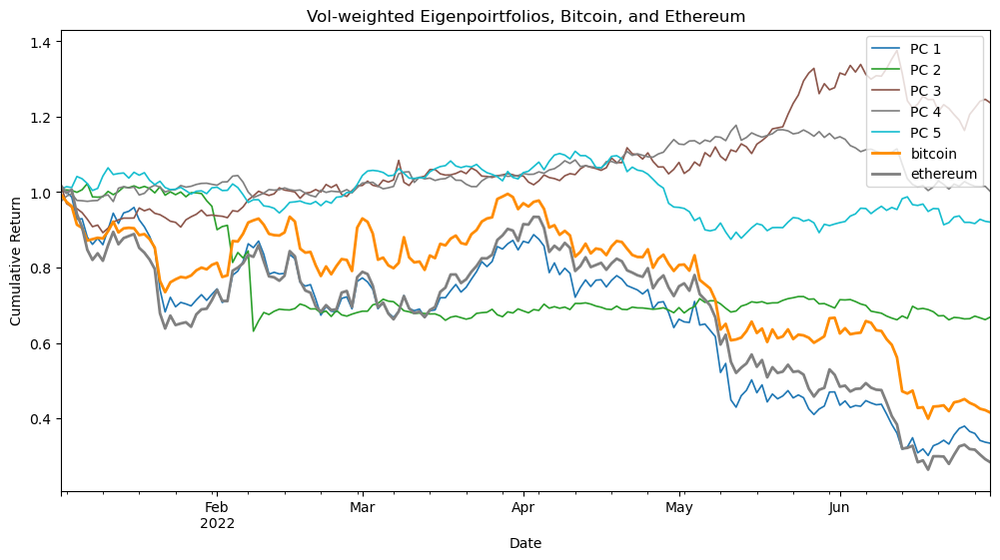

In [42]:
# Plot 5 vol-weighted eigenportfolios, Bitcoin and Ethereum
base_coins = ["bitcoin", "ethereum"]
ax = np.cumprod(1+vw_eigenport_df).plot(figsize = (12,6), legend = True, colormap = "tab10", linewidth = 1.2)

custom_colors = {"bitcoin": "darkorange", "ethereum": "grey"}
for coin in base_coins:
  np.cumprod(1+ sim_ret.loc[:, coin].iloc[0:len(vw_eigenport_df)]).plot(
      ax=ax, linewidth=2, label = coin, color = custom_colors[coin])
  
  
plt.title("Vol-weighted Eigenpoirtfolios, Bitcoin, and Ethereum")
plt.legend(loc = "upper right")
plt.xlabel("Date")
plt.ylabel("Cumulative Return")

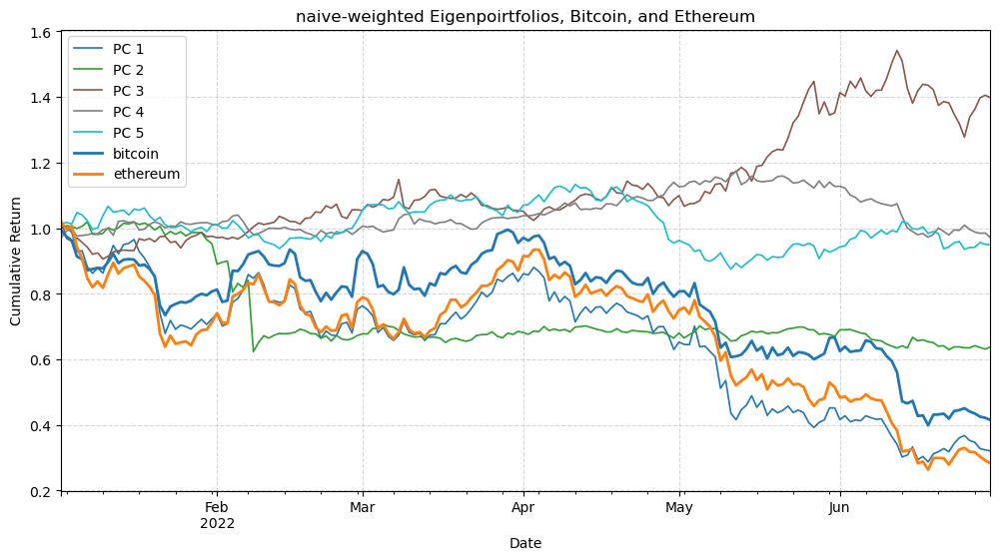

In [43]:
# Compute eigenportfolio returns using naive weightings and plot 5 vol-weighted eigenportfolios, Bitcoin and Ethereum
base_coins = ["bitcoin", "ethereum"]
PC_label = [f"PC {i}" for i in range(1,6)]
ax = np.cumprod(1  + nw_eigenport_df).plot(figsize = (12,6), legend = True, label = PC_label, colormap = "tab10", linewidth = 1.2)

for coin in base_coins:
  np.cumprod(1  + sim_ret.loc[:, coin].iloc[0:len(nw_eigenport_df)]).plot(
      ax=ax, linewidth=2, label = coin)
  
  
plt.title("naive-weighted Eigenpoirtfolios, Bitcoin, and Ethereum")
plt.legend()
plt.xlabel("Date")
plt.ylabel("Cumulative Return")
plt.grid(True, linestyle='--', alpha=0.5)


Text(0, 0.5, 'Cumulatove Return')

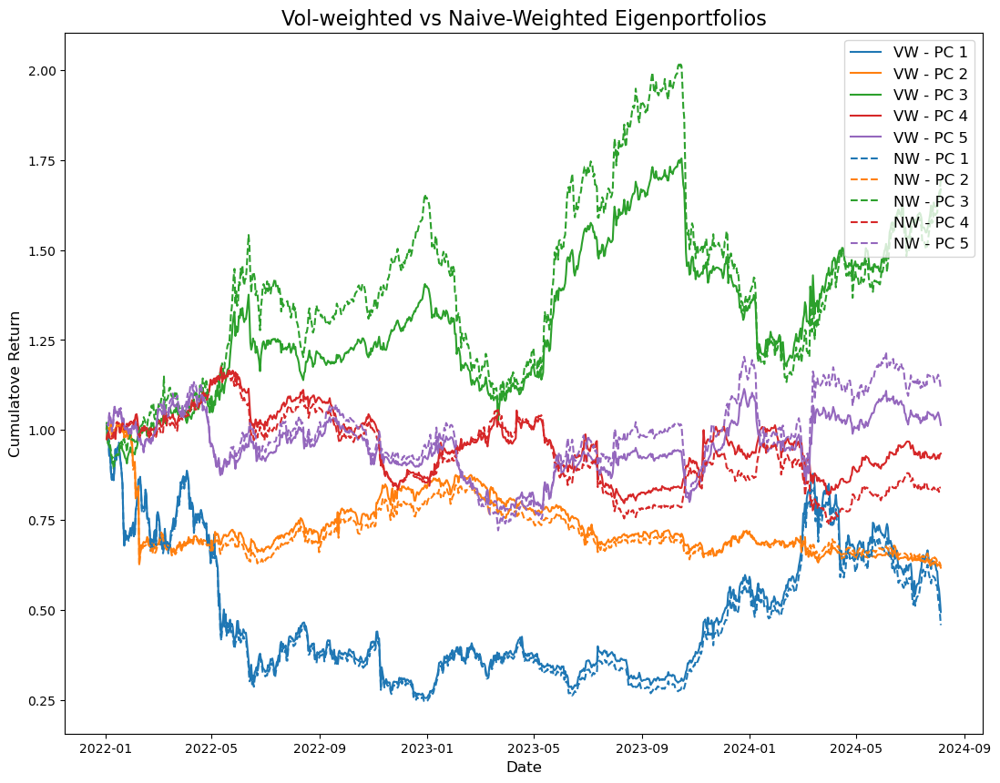

In [44]:
# Compare naive and vol weighted eigportfolios
PC_label = [f"PC {i}" for i in range(1,6)]
full_nw_eig = (sim_ret @ norm_eigvec).iloc[:, 0:5]
full_nw_eig.columns = PC_label

full_vw_eig = (sim_ret @ Q).iloc[:, 0:5]
full_vw_eig.columns = PC_label

color_palette = plt.cm.tab10.colors

plt.figure(figsize = (13,10))

for i, col in enumerate(full_vw_eig):
  plt.plot(full_vw_eig.index, np.cumprod(1  + full_vw_eig)[col], label = f"VW - {col}", color = color_palette[i])

for i, col in enumerate(nw_eigenport_df):
  plt.plot(full_nw_eig.index, np.cumprod(1  + full_nw_eig)[col], linestyle = "--", label = f"NW - {col}", color = color_palette[i])

plt.legend(loc = "upper right", fontsize = 12)
plt.title("Vol-weighted vs Naive-Weighted Eigenportfolios", fontsize = 16)
plt.xlabel("Date",fontsize = 12)
plt.ylabel("Cumulatove Return",fontsize = 12)


#### Remark
- Interestingly, our first principal eigenportfolio, or the "market portfolio," seems to track Ethereum more closely than it tracks bitcoin. This could make sense because there are many altcoins that are more correlated to Ethereum than they are to Bitcoin. Checking the correlation over the six months verifies that our PC1 portfolio tracks ethereum more closely than it tracks bitcoin.


In [45]:
print(np.corrcoef(vw_eigenport_df.iloc[:, 0], np.squeeze(test_data[["bitcoin"]])))
print(np.corrcoef(vw_eigenport_df.iloc[:, 0], np.squeeze(test_data[["ethereum"]])))

[[1.        0.8945898]
 [0.8945898 1.       ]]
[[1.         0.93412671]
 [0.93412671 1.        ]]


In [46]:
PC1_corr = pd.concat([vw_eigenport_df["PC 1"], sim_ret.loc[vw_eigenport_df.index,:]], axis =1).corr().loc["PC 1", sim_ret.columns]

print(PC1_corr.sort_values(ascending = False))

ethereum         0.934127
bnb              0.931060
litecoin         0.930892
stellar          0.927903
polkadot-new     0.920033
polygon          0.918428
avalanche        0.910671
solana           0.904444
bitcoin          0.894590
cronos           0.890686
uniswap          0.890149
algorand         0.885670
bitcoin-cash     0.881732
xrp              0.878982
cardano          0.872765
chainlink        0.854654
ftx-token        0.854302
cosmos           0.826915
dogecoin         0.813539
shiba-inu        0.807723
near-protocol    0.772607
monero           0.713434
tron             0.675417
hex              0.601104
unus-sed-leo     0.204587
Name: PC 1, dtype: float64


#### How frequent should we update our target coin list
As we have seen above, coins that we have selected based on an earlier date can go obsolete when we don't update our target list periodically. A question we ask in this section is: *how serious can the problem grow if we don't update at all*?

That is, we project the original returns onto the principal component space using the target coin list updated on 2022-07-01. 

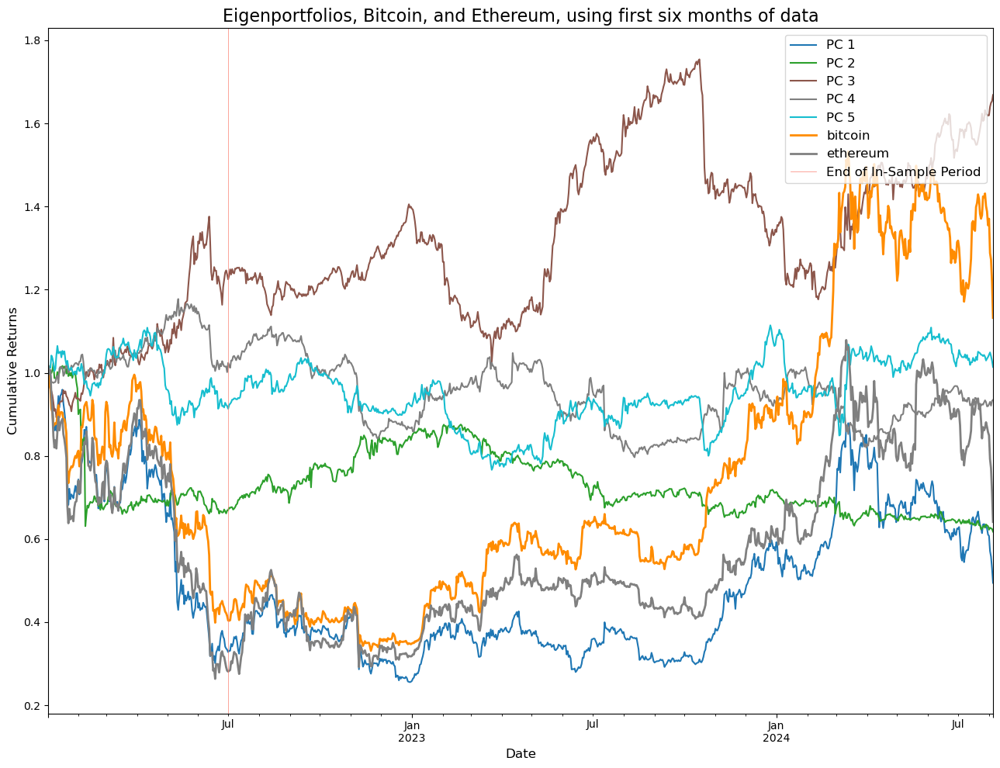

In [47]:
base_coins = ["bitcoin", "ethereum"]
ax = np.cumprod(1 + full_vw_eig).plot(figsize=(12,6), label = PC_label, legend= True, colormap = "tab10")
custom_colors = {"bitcoin": "darkorange", "ethereum": "gray"} 

for coin in base_coins:
  np.cumprod(1 + sim_ret.loc[:, coin].iloc[:]).plot(figsize = (13,10),ax = ax, label = coin, linewidth = 2, color = custom_colors[coin]) # Change iloc to subset data by smaller observations


plt.axvline(pd.to_datetime("2022-07-01"), linewidth = 0.5, color = "salmon", label = "End of In-Sample Period")

plt.legend(loc = "upper right", fontsize = 12)
plt.title("Eigenportfolios, Bitcoin, and Ethereum, using first six months of data", fontsize = 16)
plt.xlabel("Date",fontsize = 12)
plt.ylabel("Cumulative Returns",fontsize = 12)
plt.tight_layout()



The black series is the price series for bitcoin, while the blue series is the 1st eigenportfolio. As you can see, although we are using the weights extracted using the data from 2022-01-01 to 2022-06-30, the first eigenportfolio 1, which is supposed to resemble the "market portfolio" tracks bitcoin and ethereum quite closely for around 4 ~ 6 months after the training period ends. We see a non-trivial divergence starting from the end of 2022, and the gap persists through the rest of the period, and in 2024 we see our "market portfolio" is far from resembling bitcoin and ethereum.

This reflects the fact that the crypto market has been concentrated in a few names, so the past coins still explain the majority of the market dynamics in the present.

This is to some extent reassuring since we don't have to care too much about the issue of updating our target list too frequently. 

##### Remark
- Our third eigenportfolio, surprisingly shows a robust performance across these periods. Of course the result could be largely due to selection bias; however, if the results persist even after incorporating the dynamic update process, then further study on the components of the third eigenportfolio should be conducted.

## 1.2 Dynamic PCA Analysis

From previous section  `Static PCA Analysis`, we have looked at how PCA can be conducted using both `numpy` and `scikit learn`, and how the features extracted compare for both methods.

In this section, we will basically be iterating what we have done for the previous section, but by rolling our estimation window forward for six months, maintaining the window length of 180 days.

At each iteration, we will be going over the below steps.

0. Extract the price data of target list. Convert to log return
1. Truncate log return matrix and standardize it
2. Intialize PCA class using sci-kit learn and fit PCA on covariance matrix of the standardized returns (correlation matrix)
3. Save eigenvectors, eigenvalues, factor loadings (scaled eigenvectors), explained variance ratio of each eigenvector, cumulative explained variation ratio, and the number of principal components needed to explain 90% of variance

After going through the iteration for each day for 180 days, we make two visualizations:
- Plot the number of eigenvectors needed to explain 90% of variance over time
- Plot the explained variance of top 5 principal components over time

In [59]:
# Define analysis period
start_date = datetime.strptime('2022-07-01', '%Y-%m-%d')
analysis_end_date = parent_df.index[-1].to_pydatetime()   # End date

# Extract available dates from the intersection of target list and dataframes
date_str_list = [datetime.strftime(d, "%Y-%m-%d") for d in parent_df.index]
available_dates = sorted(list(set(target_dict.keys()).intersection(set(date_str_list))))
available_dates = [datetime.strptime(date_str, '%Y-%m-%d') for date_str in available_dates]

# Filter dates within the analysis period
analysis_dates = [date for date in available_dates if start_date <= date <= analysis_end_date]
analysis_dates.sort()


In [ ]:
# Load Dynamic PCA results
import pickle

try:
    # Attempt to load precomputed results
    with open(data_dir / "pca_results.pkl", "rb") as f:
        results = pickle.load(f)
    
    # Unpack results into variables
    eigenvectors_list = results["eigenvectors_list"]
    eigenvalues_list = results["eigenvalues_list"]
    explained_variance_ratio_list = results["explained_variance_ratio_list"]
    cumulative_explained_variance_ratio_list = results["cumulative_explained_variance_ratio_list"]
    n_components_90_list = results["n_components_90_list"]
    dates_list = results["dates_list"]
    top5_explained_variance_ratio_list = results["top5_explained_variance_ratio_list"]
    
    print("Loaded precomputed PCA results!")
    
except FileNotFoundError:
    print("No precomputed results found. Run the PCA cell to generate data.")

Loaded precomputed PCA results!


In [62]:
if not eigenvectors_list:

    # Initialize lists to store outputs
    eigenvectors_list = []
    eigenvalues_list = []
    explained_variance_ratio_list = []
    cumulative_explained_variance_ratio_list = []
    n_components_90_list = []
    dates_list = []
    top5_explained_variance_ratio_list = []
    
    # Set window size for rolling estimation
    window_size = 180  # Days
    
    # Loop over each date in the analysis period
    for current_date in tqdm(analysis_dates, desc='Performing Dynamic PCA'):
        date_str = current_date.strftime('%Y-%m-%d')
        start_date_str = (current_date - timedelta(days = window_size)).strftime('%Y-%m-%d')
    
        # Get the target list for the current date
        target_coins = target_dict[date_str]
    
        # Get the price data up to the current date
        df_current = parent_df[target_coins]
        if df_current is None:
            print(f"No data for date {date_str}, skipping.")
            continue
    
        # Select only the target coins
        target_price = target_price[target_coins]
    
        # Check if we have enough data (window_size + 1 due to differencing)
        if len(target_price) < window_size + 1:
            print(f"Not enough data for date {date_str}, skipping.")
            continue
        
        # Calculate daily log returns
        ret_dy = (target_price / target_price.shift(1) - 1).dropna()
    
        # Truncate log returns to the last 'window_size' days
        ret_window = ret_dy.loc[start_date_str:current_date]
    
        # Standardize the log returns
        mean_ret = ret_window.mean()
        std_ret = ret_window.std()
        standardized_ret_dy = (ret_window - mean_ret) / std_ret
    
        # Drop any columns with NaNs (in case of missing data)
        standardized_ret_dy.dropna(axis=1, inplace=True)
    
        # Adjust std_log_ret to include only the assets in standardized_log_ret
        std_ret = std_ret[standardized_ret_dy.columns]
    
        # Check if we have at least two assets
        if standardized_ret_dy.shape[1] < 2:
            print(f"Not enough assets for date {date_str}, skipping.")
            continue
        
        # Initialize and fit PCA on standardized data
        pca = PCA()
        pca.fit(standardized_ret_dy)
    
        # Extract PCA outputs
        eigenvectors = pca.components_.T  # Each column is an eigenvector
        eigenvalues = pca.explained_variance_  # Eigenvalues of correlation matrix
        explained_variance_ratio = pca.explained_variance_ratio_
        cumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio)
    
        # Determine the number of components needed to explain 80% of variance
        n_components_90 = np.argmax(cumulative_explained_variance_ratio >= 0.90) + 1 # argmax of boolean returns index of first true value
    
    
        # Save outputs to lists
        eigenvectors_list.append(eigenvectors)
        eigenvalues_list.append(eigenvalues)
        explained_variance_ratio_list.append(explained_variance_ratio)
        cumulative_explained_variance_ratio_list.append(cumulative_explained_variance_ratio)
        n_components_90_list.append(n_components_90)
        dates_list.append(current_date)
        top5_explained_variance_ratio_list.append(explained_variance_ratio[:5])
        ## Save dynamic PCA results
    
    
    # After your PCA loop, add this code to save the results
    results = {
        "eigenvectors_list": eigenvectors_list,
        "eigenvalues_list": eigenvalues_list,
        "explained_variance_ratio_list": explained_variance_ratio_list,
        "cumulative_explained_variance_ratio_list": cumulative_explained_variance_ratio_list,
        "n_components_90_list": n_components_90_list,
        "dates_list": dates_list,
        "top5_explained_variance_ratio_list": top5_explained_variance_ratio_list
    }
    
    # Save to a file
    with open("pca_results.pkl", "wb") as f:
        pickle.dump(results, f)
else:
    print("Skip Dynamic PCA Analysis: Already loaded results")

Skip Dynamic PCA Analysis: Already loaded results


Text(0, 0.5, 'Number of PCs')

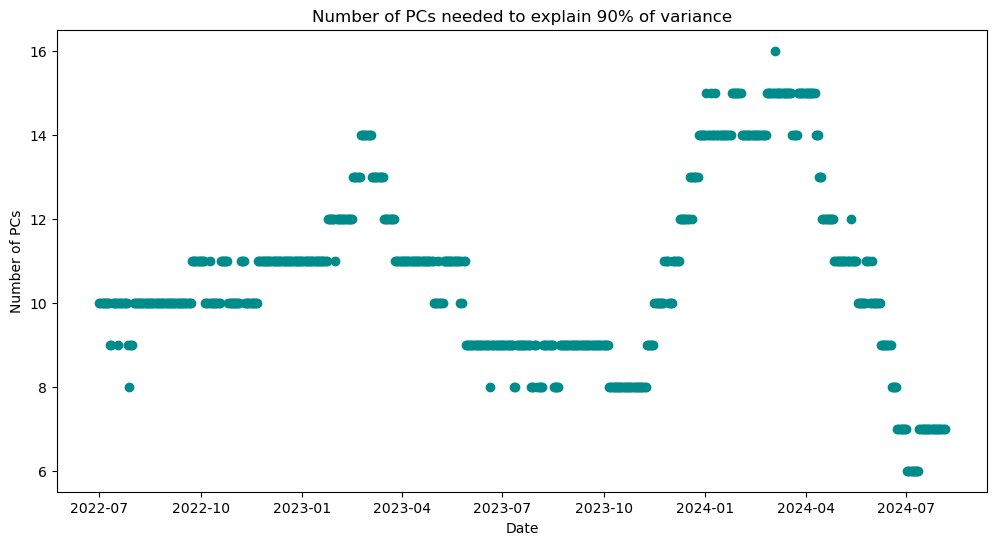

In [63]:
# Convert dates_list to pandas datetime index
dates_index = pd.to_datetime(dates_list)

# Plot the number of principal components needed over time
plt.figure(figsize=(12, 6))
plt.scatter(dates_index, n_components_90_list, color = "darkcyan")
plt.title("Number of PCs needed to explain 90% of variance")
plt.xlabel("Date")
plt.ylabel("Number of PCs")



##### Remarks
- On average, 10 components are needed to explain 90% of variance over the study period. 
- The number of components needed sharply drop from April of 2024. 

Text(0, 0.5, 'Proprtion')

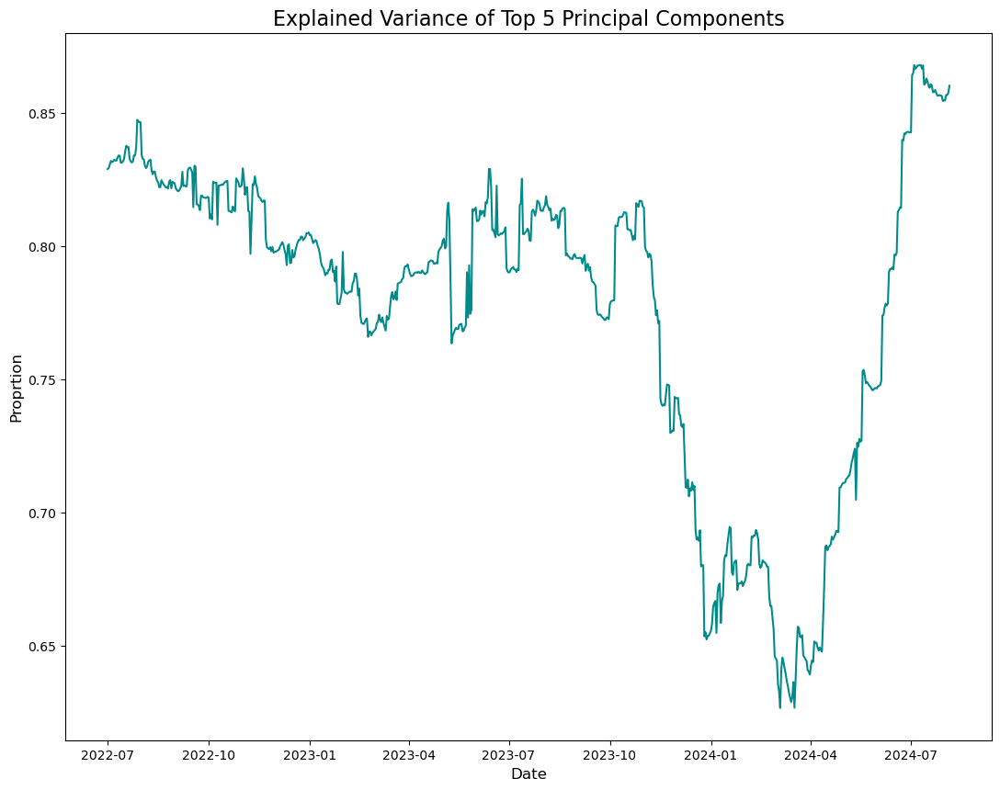

In [65]:
# Create DataFrame for top 5 explained variance ratios
top5_cumulexp_variance_ratio_list = [cumulative_explained_variance_ratio_list[i][4] for i in range(len(cumulative_explained_variance_ratio_list))]

# Plot explained variance ratios over time

plt.figure(figsize = (13,10))
plt.plot(dates_index, top5_cumulexp_variance_ratio_list, label = "Cumulative Explained Variance of top 5 PCs", color = "darkcyan")
plt.title('Explained Variance of Top 5 Principal Components', fontsize = 16)
plt.xlabel("Date", fontsize = 12)
plt.ylabel("Proprtion",fontsize = 12)


##### Remarks
- We see that the top 5 principal components explained amlomst 85% of the variance at the start of the period and at the end of the period. In another words, the market was concentrated in both of these periods, but we know that the former period was bearish while the latter period was bullish.
- Using a fixed number of 5 principal components is equivalent to stating that we used principal components explaining on average 75% of the variance.
- Because of the concentrated nature of the crypto market, we see that the top few eigenvectors explain much more variance than the top few eigenvectors of the public equity market. This could be an indicator that conducting pairs trading strategy in crypto is easier than it is in the equity space.
- Because the cumulative explained variance ratio changes non-trivially across time, it might be prudent to dynamically update the number of principal components used to explain a fixed percentage of variance. By eye-balling, six months could be a rationale choice, given the trade off of higher trading costs versus loss of representativeness.

# 2. Constructing Mean Reverting Series
In this section, we will construct synthetic portfolios using our eigenportfolios to create a mean reverting series.

While one could adopt one of various approaches from here, we will follow Avellaneda's convention.

1. Conduct linear regression of individual asset return series on the top five eigenportfolio returns. Use 90 days rolling estimation window to find hedge ratios and residual series.
2. Take the cumulative sum of the residual series to find the "auxilliary process" defined by Avellaneda. While the previous residual series was more of a "return" series, the auxilliary process can be regarded as "price" series.
3. While from here there are many approaches, we again follow convention by estimating the mean-reverting series as the Ornstein-Uhlenbeck process. We use the AR(1) to estimate parameters.
4. Use estimation to compute important statistics, such as equilibrium moments, mean-reversion period, and s-scores.
5. Repeat steps 1. ~ 4. for all our coins included in the target coin list.


#### Difference from the paper
Now, unlike Avellaneda, we use different rolling window lengths for the factor regression and AR(1) regression. The reason is more of a fundamental one than a statistical one; we want to test the hypothesis that crypto market has a much faster changing market dynamic compared to the public equity space, so using a shorter window length of 60 days (at the cost of loss of informaiton and lower efficiency) reflects reality to a closer degree than using a window length of 90 days.

For comparison, we also conduct the study as stipulated in the paper.

## 2.1 Factor Regression
First, we will use data from 2022-01-01 to 2022-06-30 to construct our eigenportfolios and regress each coin from our test coin list (selected on 2022-07-01) on the returns of our top 5 eigenportfolios. We will use 90 days worth of data to estimate the beta coefficients. Then, using the estimated beta coefficients, we construct the residual series and take the cumulative sum to engineer the auxiliary series. The resulting series will be then estimated via the OU process (for estimation method, we conduct AR(1) regression). 

The first code block is the preparation step. The next code block will be the factor regression step.

In [ ]:
# Import LinReg module
from sklearn.linear_model import LinearRegression

In [67]:
# Extract target coin based on date
test_date_str = "2022-07-01"
window_size = 180
test_start_date = (datetime.strptime(test_date_str, '%Y-%m-%d') - timedelta(days = window_size)).strftime("%Y-%m-%d")
test_coins = target_dict.get(test_date_str)

# Extract price data frame based on date
test_df = parent_df[test_coins]

# Construct log ret dataframe
if test_df is None:
  print(f"No data for date {test_date_str}")

test_price = test_df.copy()
test_ret = (test_price/test_price.shift(1) - 1).dropna()

# Calculate volatility after truncating
test_ret_mean = test_ret.loc[test_start_date:test_date_str].mean()
test_ret_sdv = test_ret.loc[test_start_date:test_date_str].std()

# Construct eigenvectors dictionary indexed by date
eigenvectors_dic = {}
i = 0
for date in available_dates:
  eigenvectors_dic[date.strftime('%Y-%m-%d')] = eigenvectors_list[i] # eigenvectors_list is constructed from the loop above
  i += 1

# Extract eigenvector matrix using date filter
test_eigenvec = eigenvectors_dic[test_date_str]

# Construct vol-weighted portfolio
test_Q = test_eigenvec / test_ret_sdv.values[:, np.newaxis]

# Normalize by 1
test_Q /= abs(test_Q).sum(axis = 0, keepdims = True)

# Compute eigenportfolio returns using vol-weighting
test_eigportret_df = pd.DataFrame(test_ret @ test_Q).iloc[:, 0:5]
test_eigportret_df.columns = [f"PC {i+1}" for i in range(5)] 


##### Remarks
- Note that if we use data from 2022-01-01 to 2022-07-01, this implies that we should generate trading signal for 2022-07-02, or else we would including look-forward bias. Since we are trading cryptocurrencies, we can trade within the next hour after aggregating data, engineering features, computing forecasts, and generating trading signals. If we were trading equity, it is safer to use data up until T-2, where T is the time we intend to execute our trade.
- It is wrong to standardize the data before truncating, since when we do this we standardize using the first two moments of the *entire period*, which is an instance of look-forward bias. In the case above, we don't truncate but instead find the mean and sdv of the truncated df and use the entire df to find the eigenportfolio of the entire period.
- When we perform `logret matrix` @ `Q_matrix (vol-weighted eigenvector matrix)` and take the first five column vectors, we are left with top 5 eigenportfolio return matrix, starting from 2022-01-02 and ending at 2024-08-05. In essence, the eigenportfolio returns from 2022-01-02 to 2022-07-01 are *in-sample* returns, since we are reconstructing the return matrix using the principal components computed from data in the same range. Thus, the return matrix ranging from 2022-07-02 to 2024-08-05 are so called *forecasted* or *out-of-sample* returns.
- We use the last 90 observations from the *in-sample* eigenportfolio returns to construct our mean-reverting auxiliary series and model them with the OU process. Then, after computing the parameters of the OU process, we select mean-reverting pairs and set rules for generating trading signals (s-score defined in Avellaneda paper is used, but we can also use Bollinger Bands). Then, **based on T-1 value of the auxiliary series, we generate trading signal for start of time T**. After the end of time T, we again calculate the logret matrix, use the *same Q_weights* to get the updated eigenportfolio returns, and then use the *same hedge ratios* to calculate the updated auxiliary series. Then, we take the *new last 90 observations of the auxiliary series* to estimate the OU parameters, generate trading signals for day T + 1, and then decide:
  1. close out already open positions (hitting target mean level, hitting stop loss level (if one exists), or becoming labeled as *non-reverting auxiliary series*)
  2. open new positions from trading signals
- We update our hedging ratios at least on a *weekly basis* to generate new auxiliary series, and thus estimate OU parameters and generate trading signals for the next trading time.
- At least every month, we update our eigenportfolio returns, meaning that we use a new trading universe. In this case, we can close all existing positions or instead essentially "run a separate account" where we use new eigenportfolio returns, new hedging ratios, and new OU parameters to generate trading signals for time T using data range T-90 : T-1. Then, we manage the "new account" while maintaining the "old account", perhaps adding a *time-based stop* to prevent from maintaining positions that no longer possess mean-reverting properties.
- Recall that we estimate OU process for all cryptocurrencies in our trading universe, and the final position is *a combination of the cryptocurrencies in our target list*. 

In [69]:
# Convert datetime list object to list of string date values
dates_str_list = [i.strftime("%Y-%m-%d") for i in dates_list]
dates_str_list[0:5]

['2022-07-01', '2022-07-02', '2022-07-03', '2022-07-04', '2022-07-05']

In [70]:
test_eigportret_df.columns.to_list()

['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5']

In [71]:
def rolling_factor_regression(coin_returns, eigport_returns, dates, window = 90, include_intercept = 1):
  """
  Conduct rolling regression where we regress individual asset return on returns of top 5 eigenportfolio returns. 
  
  Parameters:
    coin_returns (pd.DataFrame): full log return data of target coins (extracted based on date parameter)
    eigport_returns (pd.DataFrame): eigenportfolio log return data matrix (starting from left, we have PC 1 portfolio)
    dates (list) : list of date string values in the format of %Y-%m-%d, used as end date index for factor regression
    window (int) : default value of 90. date - window = start date index for factor regression
    include_intercept: default value of 1 (True). If 1, we conduct regression with intercept included; if 0, conduct regression with intercept excluded.
      Generally, conduct regression with intercepts to check whether intercept values can be ignored. If we judge that intercepts are trivial, then run rolling regression again with include_intercept = 0


  Required dependencies:
    numpy, pandas, sklearn.linear_model (LinearRegression), datetime (timedelta, strptime, strftime)

  Returns:
    Two dfs

    coef_df : df storing values of regression coefficients (six including constant coefficient). 
      columns = ["constant", "PC 1"  : "PC 5"], indexed by dates
    R_sq_df : df storing R-squared values, indexed by dates
  """
  # Initialization
  coins = list(coin_returns.columns)
  beta_coeff = {coin: [] for coin in coins}
  R_sq = {coin: [] for coin in coins}
  date_idx = []

  if include_intercept == 1:
    col_name = eigport_returns.columns.to_list()
    col_name.insert(0, "constant")

    for date in dates:
      # Preparation
      end_date = pd.to_datetime(date)
      start_date = end_date - timedelta(days = window - 1)

      # truncate return df to prepare for regression
      coin_returns_window = coin_returns.loc[start_date:end_date]
      eigport_returns_window = eigport_returns.loc[start_date:end_date]

      date_idx.append(end_date)

      for coin in coins:
        linreg = LinearRegression(fit_intercept = True).fit(eigport_returns_window, coin_returns_window[coin])
        coeff_array = np.insert(linreg.coef_, 0, linreg.intercept_, axis = None)
        beta_coeff[coin].append(coeff_array)
        R_sq[coin].append(linreg.score(eigport_returns_window, coin_returns_window[coin]))
    
  elif include_intercept == 0:
    col_name = eigport_returns.columns.to_list()

    for date in dates:
      # Preparation
      end_date = pd.to_datetime(date)
      start_date = end_date - timedelta(days = window)

      # truncate return df to prepare for regression
      coin_returns_window = coin_returns.loc[start_date:end_date]
      eigport_returns_window = eigport_returns.loc[start_date:end_date]

      date_idx.append(end_date)

      for coin in coins:
        linreg = LinearRegression(fit_intercept = False).fit(eigport_returns_window, coin_returns_window[coin])
        beta_coeff[coin].append(linreg.coef_)
        R_sq[coin].append(linreg.score(eigport_returns_window, coin_returns_window[coin]))
        
      
  coef_df = {key: pd.DataFrame(vals, index = date_idx, columns = col_name) for key, vals in beta_coeff.items()}
  R_sq_df = pd.DataFrame(R_sq, index = date_idx)

  return coef_df, R_sq_df
   



In [74]:
# Test rolling factor regression using eigenportfolios extracted on 2022-07-01
coef_df, R_sq_df = rolling_factor_regression(test_ret, test_eigportret_df, dates_str_list, window = 90, include_intercept = 0)


<Axes: xlabel='timestamp'>

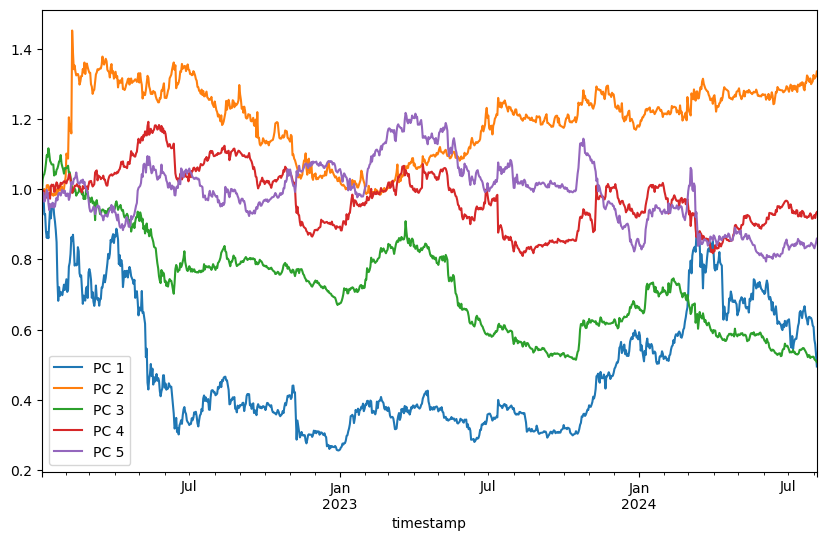

In [411]:
np.cumprod(1 + test_eigportret_df).plot(figsize = (10,6))

<Axes: >

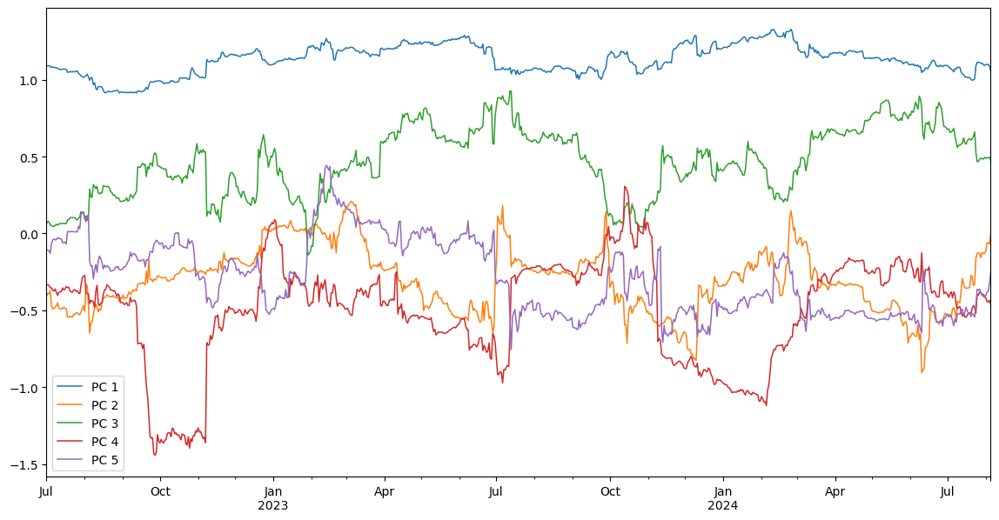

In [75]:
coef_df["algorand"].plot(figsize = (14,7), linewidth = 1.1)

c:\Users\idkup\anaconda3\envs\quant\Lib\site-packages\pandas\plotting\_matplotlib\core.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


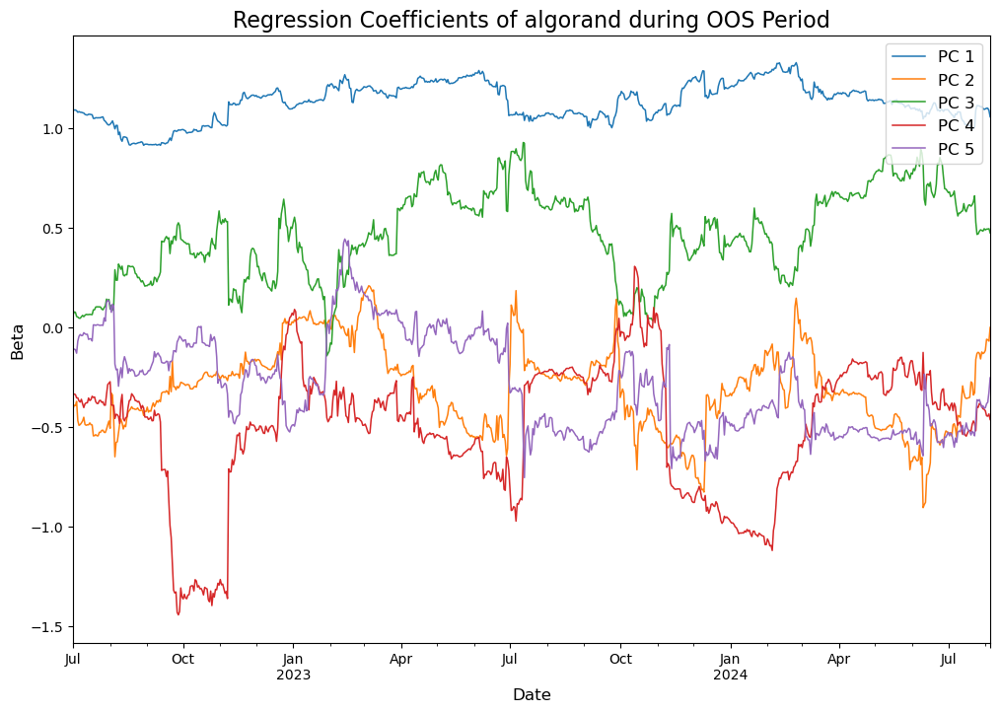

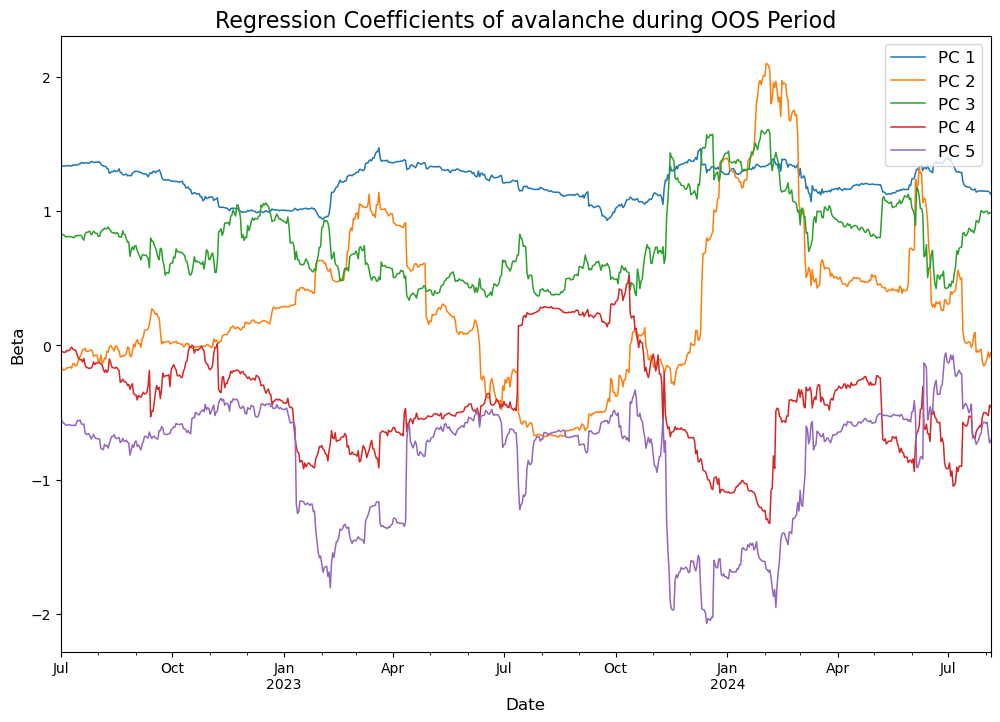

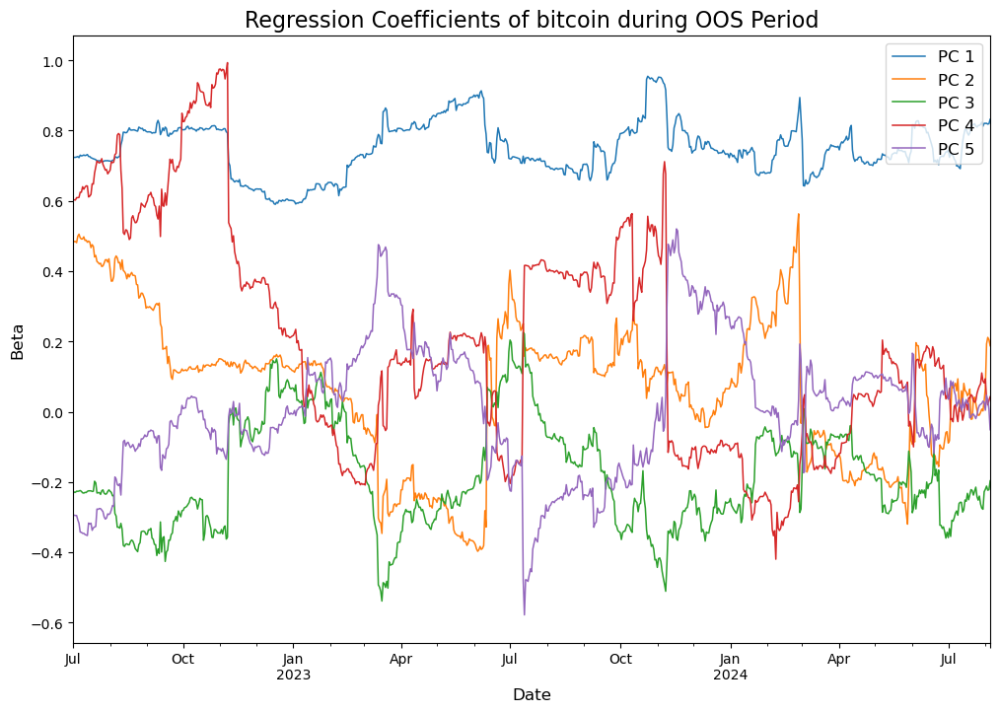

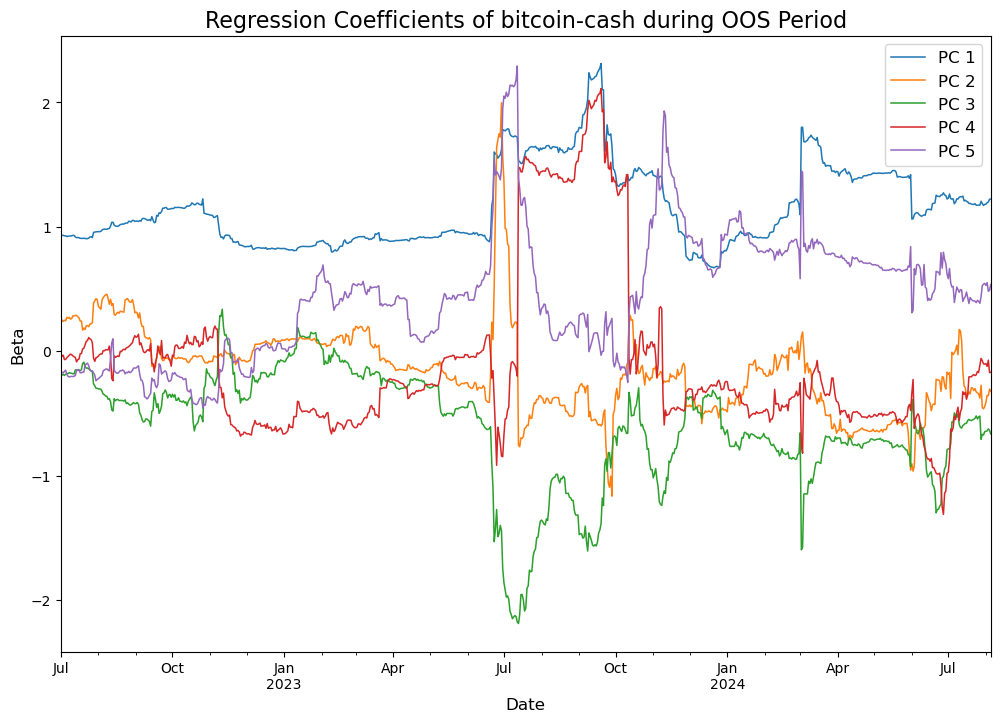

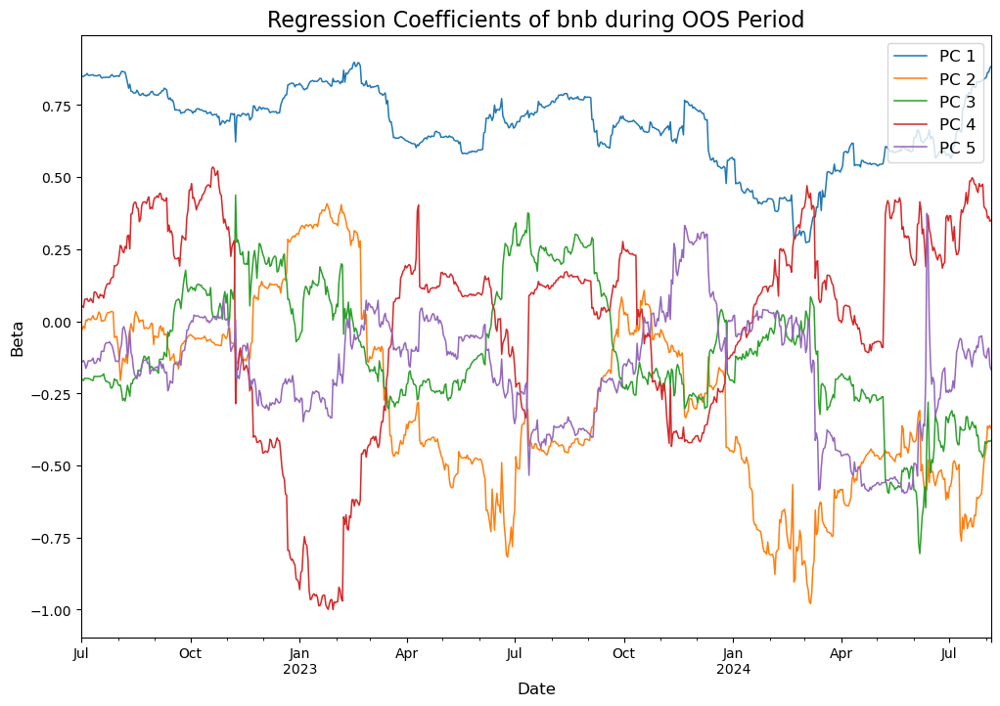

...

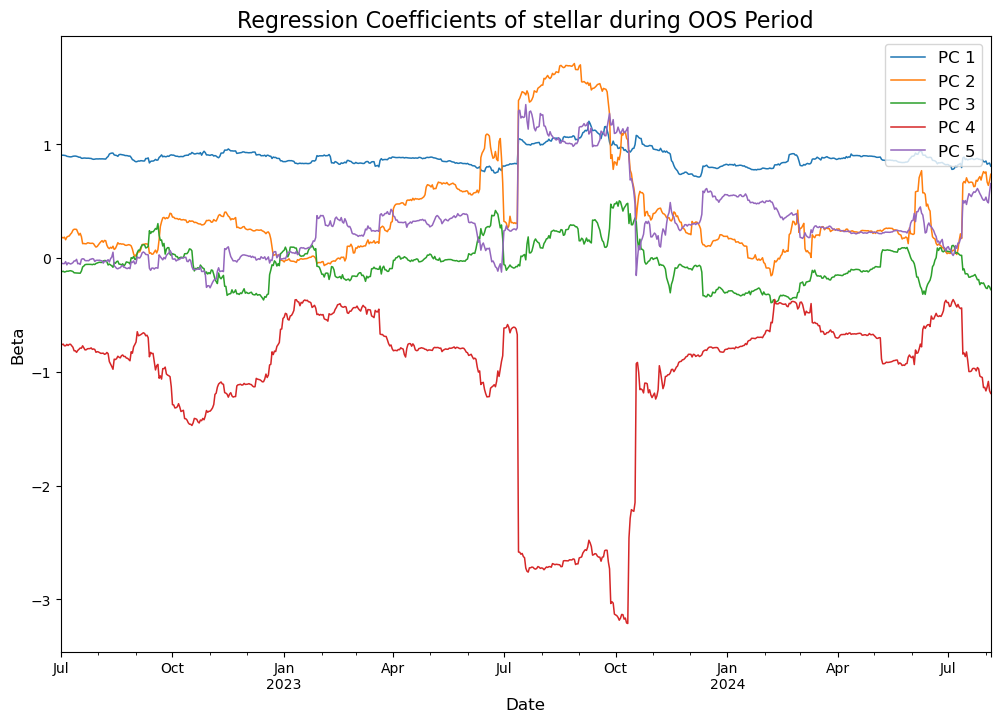

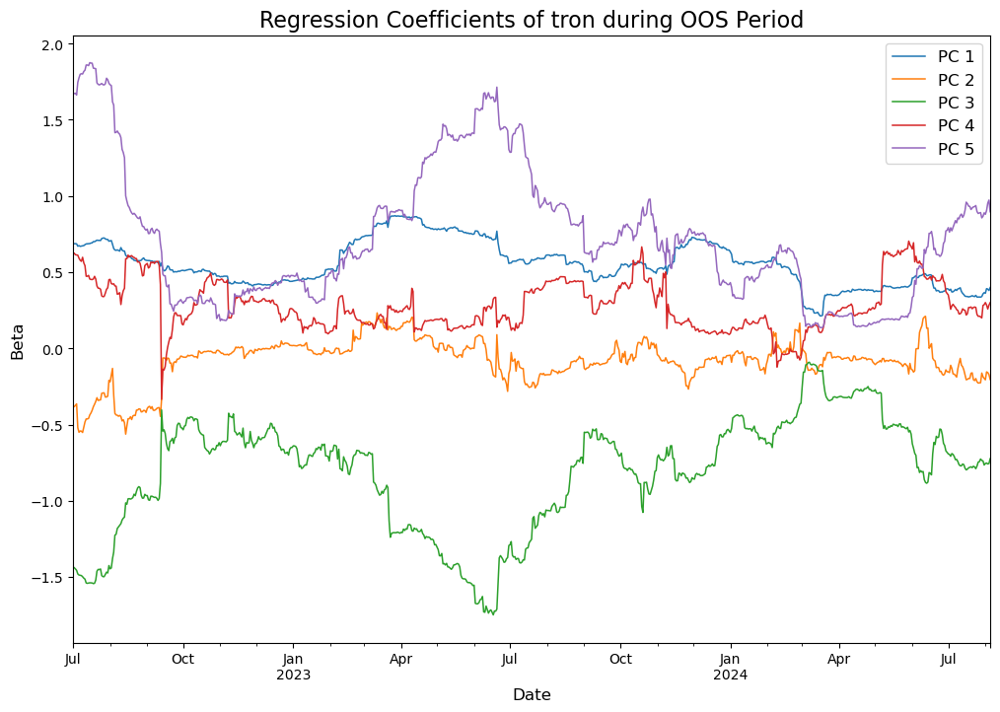

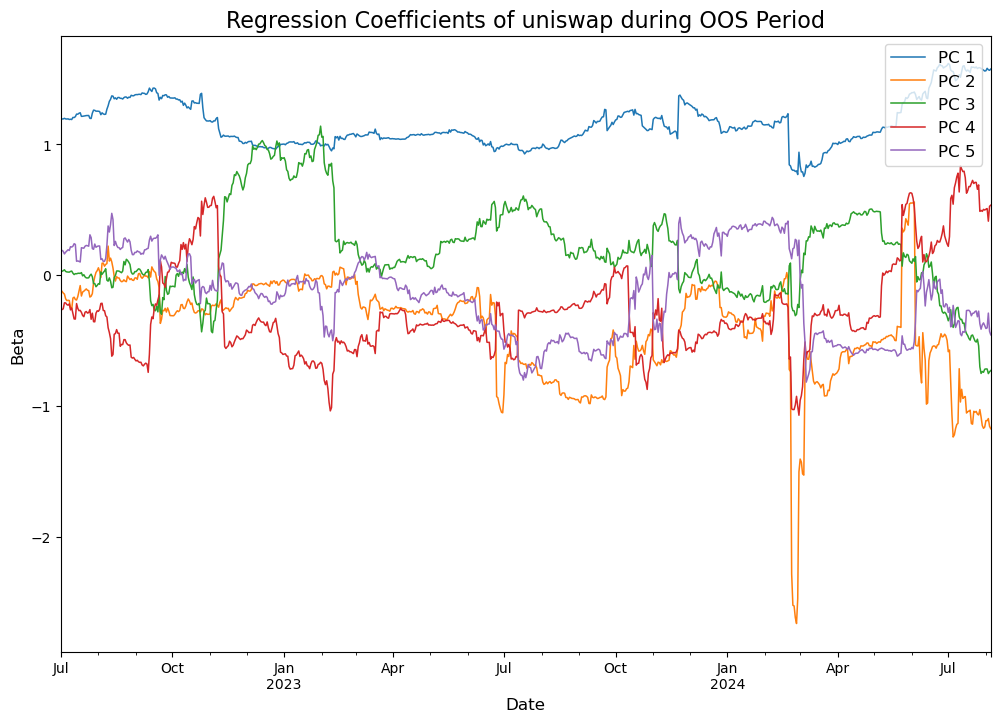

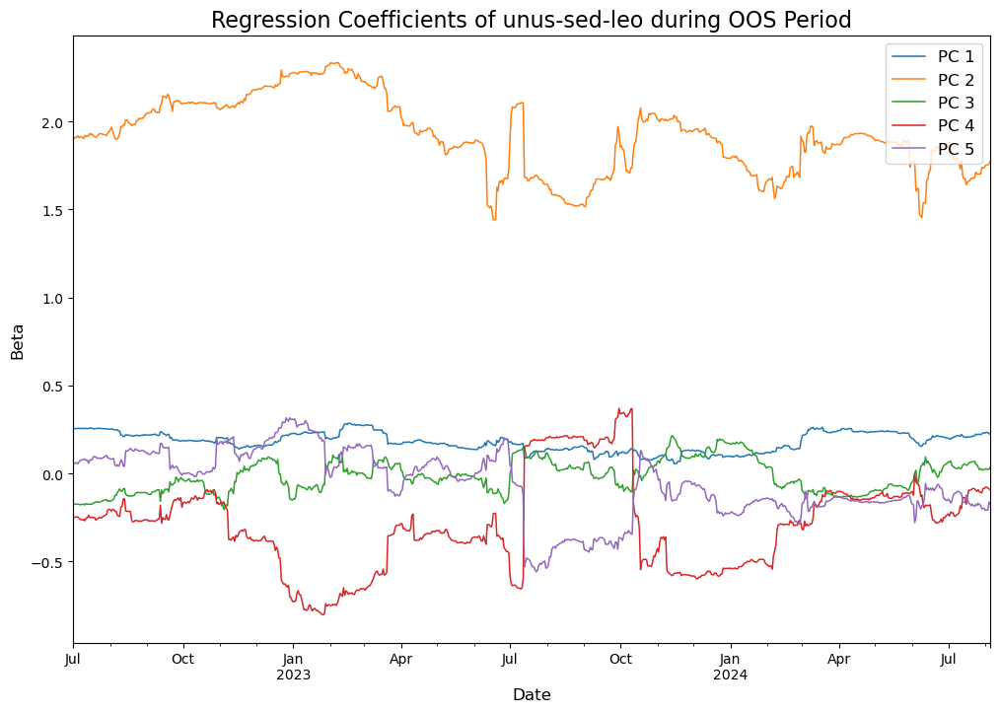

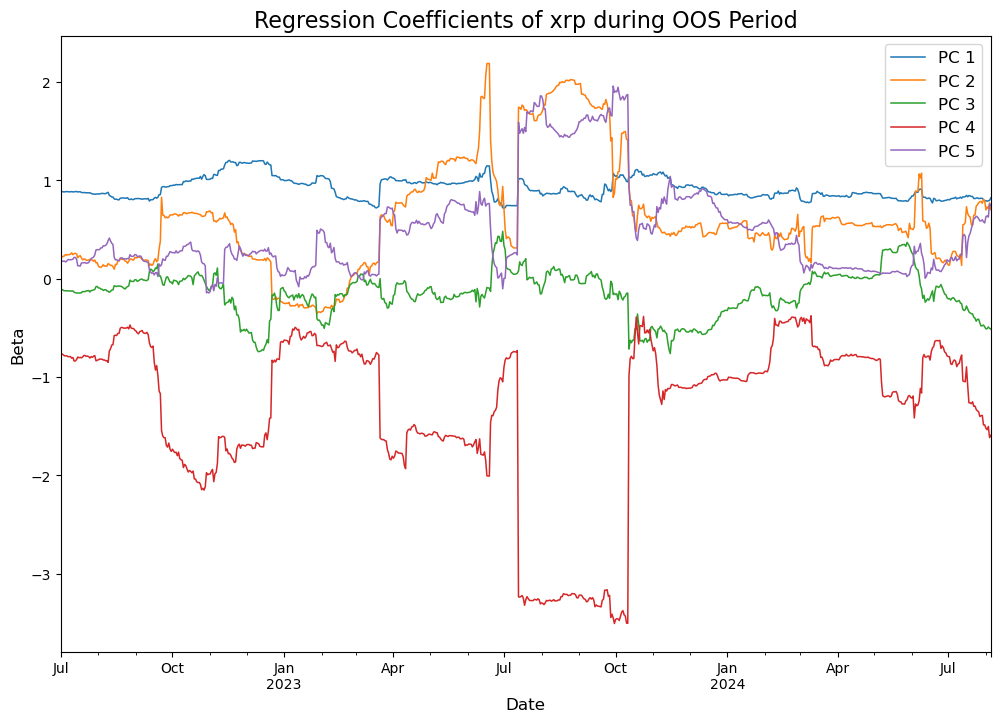

In [76]:
# Plot rolling beta coefficients
for key in coef_df.keys():
  coef_df[key].plot(figsize = (12,8), linewidth = 1.1)
  plt.title(f'Regression Coefficients of {key} during OOS Period', fontsize = 16)
  plt.xlabel('Date',fontsize = 12)
  plt.ylabel('Beta',fontsize = 12)
  plt.legend(loc = "upper right", fontsize=12)  # Adjust legend position

#### Remarks
- Note that we use the *same trading universe*, and hence, the same eigenportfolio returns to conduct factor regression over the entire testing period. In reality, we would update our trading universe to get new principal components and update hedging ratios more often (e.g., weekly basis) and reconstruct the auxiliary series to get new trading signals for next trading time.
- The constant is small enough to be ignored for all coins, indicating drift is trivial.
- In general, the beta coefficient of principal eigenportfolio (PC1) is most stable and close to 1.
- (PC 2, PC 4) and (PC 3, PC  5) seem to be "pairs", in the sense that the regression coefficients covary (sign could be positive or negative)
- As time passes, stability of regression coefficients deteriorates, indicating the need for rebalancing every 1 ~ 2 months. From the plot, 1 month seems to be a good candidate for the rebalancing frequency.

Text(0, 0.5, 'R^2')

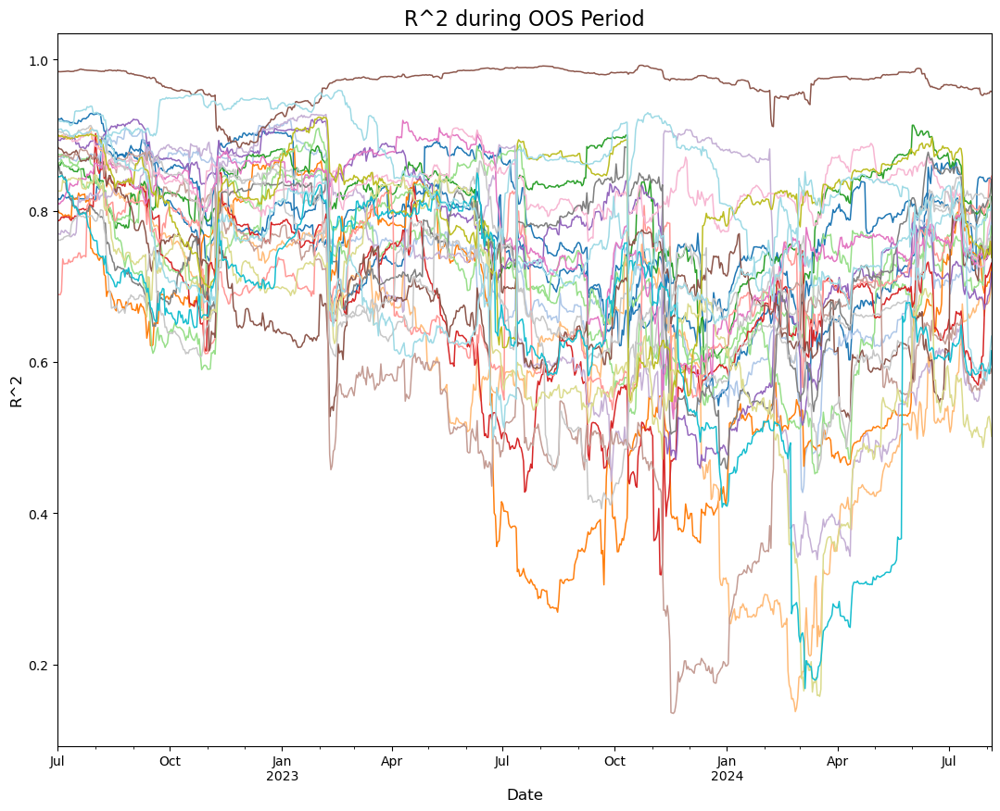

In [77]:
# Plot rolling R2 values 
R_sq_df.plot(figsize = (13,10), linewidth = 1.1, colormap = "tab20", legend = False)

plt.title('R^2 during OOS Period',fontsize = 16)
plt.xlabel('Date',fontsize = 12)
plt.ylabel('R^2',fontsize = 12)



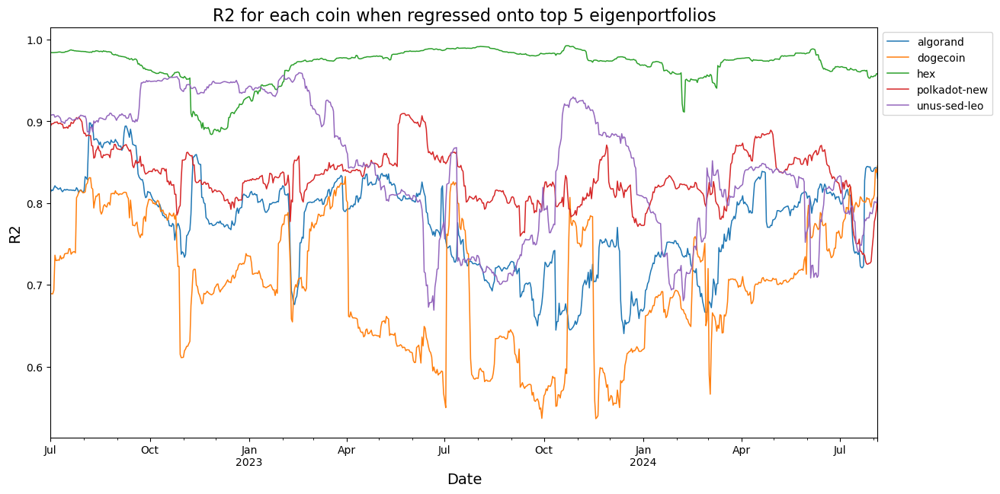

In [117]:
# Plot R2 values that meet threshold
tolerance = 0.3 # Set tolerance as 30%
starting_val = R_sq_df.iloc[0]
upper_band = starting_val * (1 + tolerance)
lower_band = starting_val * (1 - tolerance)

filtered_col = [col for col in R_sq_df.columns
                if ((R_sq_df[col] >= lower_band[col]) & (R_sq_df[col] <= upper_band[col])).all()]

filtered_Rsq_df = R_sq_df[filtered_col]

filtered_Rsq_df.plot(figsize = (14,7), linewidth = 1.1)

plt.title('R2 for each coin when regressed onto top 5 eigenportfolios', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('R2', fontsize=14)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=10)  # Adjust legend position


#### Remarks

- Notice $R^2$ generally decayed from start of period until end of 2023. Starting from early 2024, we saw $R^2$ rose again, indicating that our eigenportfolios become better at explaining the coin returns. Intuitively, the increase in cross-asset correlation due to the bitcoin-led rally is also reflected as an increase in regression fit $R^2$.
- $R^2$ starts around 0.9, indicating that at the start, our eigenportfolios explains the asset returns quite well.

### Constructing Auxiliary Series
Verifying that constant is small enough to be ignored, we conduct the rolling regression again, but with `include_intercept` set to zero. This will give us hedging ratios of each coin with respect to the top five eigenportfolios in dollar terms. For example, in our regression model where bitcoin is the dependent variable, if the beta coefficient of `PC 2` is equal to 1.1, for every 1 usd of long position in bitcoin, we also need to take a long position in 1.1 usd worth of eigenportfolio 2.

We generate predicted values using the regression model and subtract from the asset returns to get asset "residual return series". Then, we take the cumulative sum series to generate the "auxiliary series" as defined by Avellaneda(2008). If this auxiliary series is mean-reverting enough, then we can consider a potential opportunity for pairs trading.

##### Remarks
- Some comment is warranted for the methodology used in the paper. Notice how the auxiliary series is defined as a cumulative sum series of residual returns instead of taking the cumulative product series of (1+residual returns). While the paper does not explicitly mention the reason for this methodology of feature construction, I speculate that the author wanted to be mathematically consistent. If we assume returns are normally distributed, the linear combination of independent returns are also independent, implying residuals form our factor regression are normally distributed. Then, the sum of normally distributed iid random variables are also normally distributed, forcing our auxliary series to be more of a "mean-reverting" series. However, it is unclear what distribution the cumulative product of (1+residual return) will follow. 
- When conducting factor regression including intercepts, the constant coefficient turns out to be an order 0.1 bps, which indicates drift is negligible. Hence, we follow conventions of the original paper and ignore drift.


In [78]:
# Conduct rolling factor regression usign eigenportfolios extracted on 2022-07-01 with intercept
coef_df, R_sq_df = rolling_factor_regression(test_ret, test_eigportret_df, dates_str_list, window = 90, include_intercept = 1)


In [79]:

hedge_ratio = {coin: coef_df[coin].loc[test_date_str].values for coin in coef_df.keys()}

hedge_ratio_df = pd.DataFrame(hedge_ratio, index = coef_df["bitcoin"].loc[test_date_str].index).T

print(hedge_ratio_df)

               constant      PC 1      PC 2      PC 3      PC 4      PC 5
algorand       0.000691  1.093889 -0.391092  0.080260 -0.335066 -0.117201
avalanche     -0.001795  1.326875 -0.168126  0.820245 -0.048586 -0.542192
bitcoin       -0.002316  0.715476  0.478961 -0.241315  0.595086 -0.274940
bitcoin-cash  -0.004808  0.910676  0.258443 -0.205051 -0.033634 -0.110809
bnb            0.001081  0.853289 -0.025341 -0.196859  0.054784 -0.151354
cardano        0.002827  1.167856  0.265955 -0.003071 -0.646353 -0.179304
chainlink      0.002921  1.154826  0.515396  0.511067 -0.751365 -0.342099
cosmos        -0.000698  1.172311 -0.408194  0.375625  0.502075 -0.172214
cronos        -0.005738  0.969488  0.319693 -0.238535  0.323520 -0.110432
dogecoin       0.001534  0.991831 -0.651396 -0.412657 -0.423929  0.656351
ethereum      -0.002607  0.921918  0.261915  0.014931  0.659988 -0.388996
ftx-token      0.000247  0.757959  0.402394 -0.046320  0.702394 -0.112968
hex            0.001785  1.111618  0.2

In [80]:
# Construct predicted values based on coefficients extracted on 2022-07-01
include_intercept = False # Change this to consider drift or not
drift_for_all_period = False # Whether to add drift to all period returns or just a select period (only for regression estimation period)

first_date_available = test_ret.index[0]
test_date_str = "2022-07-01"
window = 90
test_start_date = pd.to_datetime(datetime.strptime(test_date_str, "%Y-%m-%d") - timedelta(days = window -1))

if include_intercept == False:
  test_pred = {coin: (test_eigportret_df.dot(hedge_ratio_df.loc[coin][test_eigportret_df.columns])) for coin in hedge_ratio_df.index}
  test_pred_df = pd.DataFrame(test_pred)

if include_intercept == True:
  test_pred = {coin: [] for coin in hedge_ratio_df.index}
  for coin in hedge_ratio_df.index:
    if drift_for_all_period == False:
      drift_vec = [0 for _ in range(len(pd.date_range(first_date_available, test_start_date - timedelta(days =1))))] + [hedge_ratio_df.loc[coin]["constant"] for _ in range(len(pd.date_range(test_start_date, test_date_str)))] + [0 for _ in range(len(pd.date_range(datetime.strftime(datetime.strptime(test_date_str, "%Y-%m-%d")+ timedelta(days =1), "%Y-%m-%d"), test_ret.index[-1])))]
      drift_vec = np.array(drift_vec)

    elif drift_for_all_period == True:
      drift_vec = [hedge_ratio_df.loc[coin]["constant"] for _ in test_eigportret_df.index]
      drift_vec = np.array(drift_vec)

    test_pred[coin] =  (test_eigportret_df.dot(hedge_ratio_df.loc[coin][test_eigportret_df.columns]) + drift_vec)
  test_pred_df = pd.DataFrame(test_pred)
  
# Construct full residual series
test_res_df = (test_ret - test_pred_df)


test_res_df2 = test_res_df.loc[test_start_date:test_date_str]

print(test_res_df2)

            algorand  avalanche   bitcoin  bitcoin-cash       bnb   cardano  \
timestamp                                                                     
2022-04-03 -0.003121  -0.025644 -0.000545     -0.004907  0.008416 -0.002468   
2022-04-04 -0.036565  -0.005338  0.003297      0.000570  0.001431  0.038842   
2022-04-05 -0.038954  -0.000943  0.006337     -0.001958  0.011922 -0.001882   
2022-04-06  0.014046   0.006049 -0.008236     -0.025330  0.011997 -0.008637   
2022-04-07  0.004991   0.005033 -0.018847     -0.012156  0.009587 -0.000574   
...              ...        ...       ...           ...       ...       ...   
2022-06-27  0.004113   0.012592  0.001925     -0.001241  0.009434  0.009748   
2022-06-28  0.005954   0.013056  0.005672     -0.033317  0.010724  0.022058   
2022-06-29 -0.023756  -0.003215 -0.002826      0.022289 -0.021909  0.007042   
2022-06-30  0.053535  -0.032826  0.006144     -0.003927  0.009900 -0.009238   
2022-07-01 -0.009046  -0.032426 -0.023759      0.006

Text(0, 0.5, 'Return')

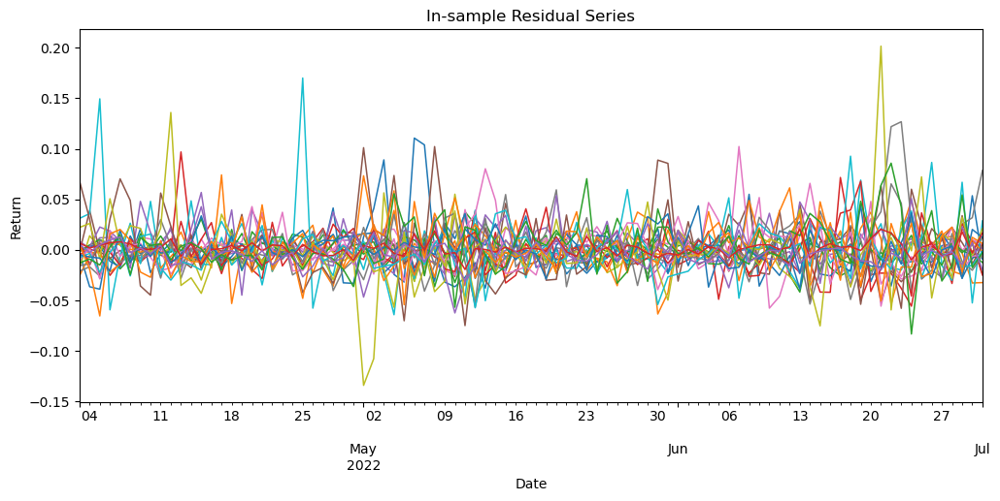

In [81]:
# Plot residual series
plt.figure(figsize = (14,8))
for column in test_res_df2.columns:
  test_res_df2[column].loc[:test_date_str].plot(figsize = (12,5), linewidth = 1.1, legend = False)

plt.title("In-sample Residual Series")
plt.xlabel("Date")
plt.ylabel("Return")

In [84]:
# Sanity check: verify mean of residual during in-sample period is approximately zero
for column in test_res_df2.columns:
  print(f"{column} mean: {np.round(np.mean(test_res_df2[column].loc[test_start_date:]),4)}")

algorand mean: 0.0007
avalanche mean: -0.0018
bitcoin mean: -0.0023
bitcoin-cash mean: -0.0048
bnb mean: 0.0011
cardano mean: 0.0028
chainlink mean: 0.0029
cosmos mean: -0.0007
cronos mean: -0.0057
dogecoin mean: 0.0015
ethereum mean: -0.0026
ftx-token mean: 0.0002
hex mean: 0.0018
litecoin mean: 0.001
monero mean: 0.0033
near-protocol mean: 0.0019
polkadot-new mean: -0.0003
polygon mean: 0.0015
shiba-inu mean: 0.0003
solana mean: -0.0001
stellar mean: 0.0013
tron mean: 0.0013
uniswap mean: 0.0038
unus-sed-leo mean: 0.0016
xrp mean: -0.0018


In [86]:
# Now verify cumulative sum at 2022-07-01 is "trivial"
for column in test_res_df2.columns:
  print(f"{column} cumulative sum: {np.cumsum(test_res_df2[column].loc[test_start_date:])[-1]}")

algorand cumulative sum: 0.06216454376880992
avalanche cumulative sum: -0.16152806127134142
bitcoin cumulative sum: -0.2084056749516927
bitcoin-cash cumulative sum: -0.4326952837857359
bnb cumulative sum: 0.09733282858388653
cardano cumulative sum: 0.25441315053257885
chainlink cumulative sum: 0.26292547372081465
cosmos cumulative sum: -0.06280212080660236
cronos cumulative sum: -0.516430180096689
dogecoin cumulative sum: 0.13809040894478763
ethereum cumulative sum: -0.23458519182807822
ftx-token cumulative sum: 0.022200900454521715
hex cumulative sum: 0.16066546102874862
litecoin cumulative sum: 0.09374887142584815
monero cumulative sum: 0.29561827512283356
near-protocol cumulative sum: 0.16690970991695264
polkadot-new cumulative sum: -0.02803945073544407
polygon cumulative sum: 0.13153451382592085
shiba-inu cumulative sum: 0.024099001067640815
solana cumulative sum: -0.005289577245313225
stellar cumulative sum: 0.11369730220219432
tron cumulative sum: 0.11392320451376808
uniswap cumu

C:\Users\idkup\AppData\Local\Temp\ipykernel_40564\310184080.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"{column} cumulative sum: {np.cumsum(test_res_df2[column].loc[test_start_date:])[-1]}")


Text(0.5, 1.0, 'Residual Series Over Entire Period')

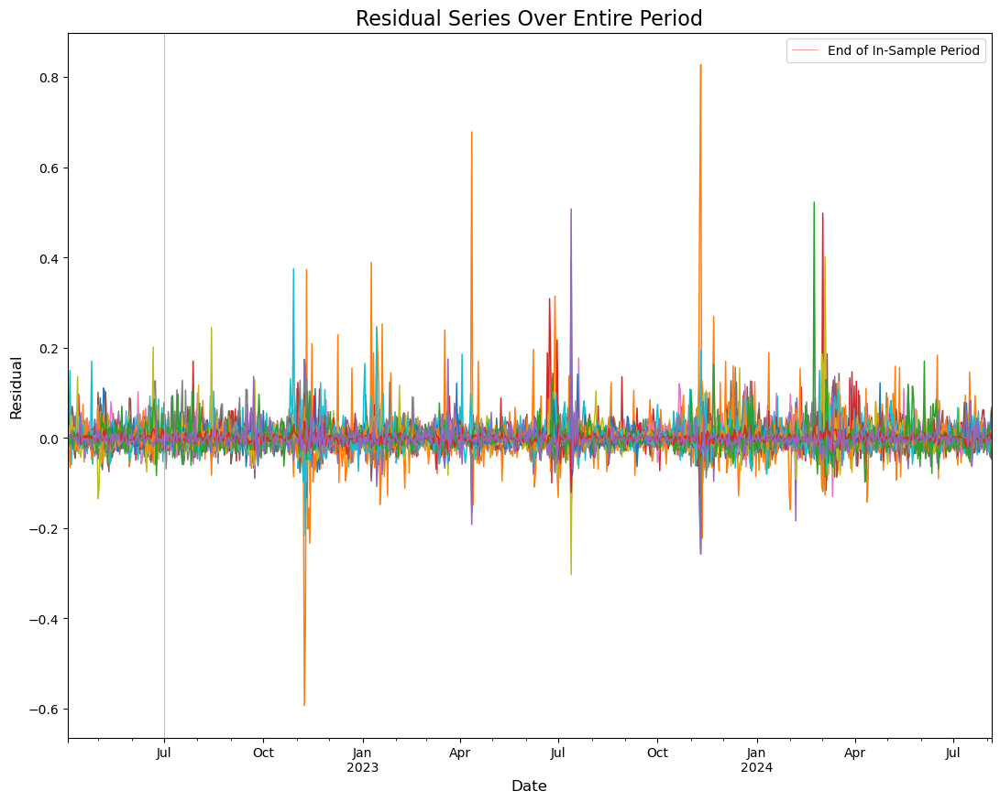

In [87]:
fig, ax = plt.subplots(figsize=(13, 10))

# Plot residuals without legend
for column in test_res_df.columns:
    test_res_df[column].loc[test_start_date:].plot(ax=ax, linewidth=1.1, label= '_nolegend_') 
    # The key fix: label='_nolegend_' hides it from the legend

# Add vertical line with legend label
ax.axvline(pd.to_datetime("2022-07-01"), label="End of In-Sample Period", color="salmon", linewidth=0.5)

# Display legend (only for axvline)
ax.legend()
plt.xlabel("Date",fontsize = 12)
plt.ylabel("Residual",fontsize = 12)

# Add title
ax.set_title("Residual Series Over Entire Period",fontsize = 16)


Text(0.5, 1.0, 'In-sample Auxiliary series for trading universe in 2022-07-01')

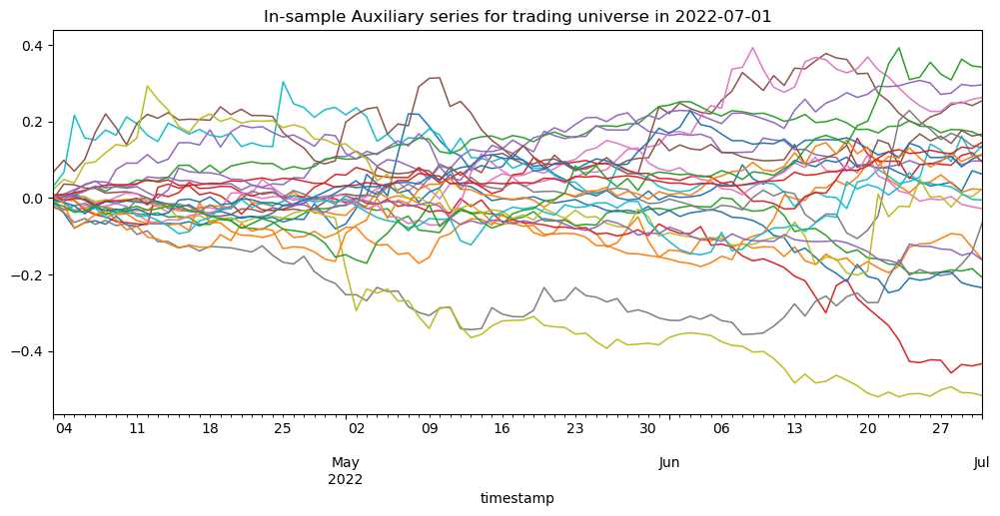

In [89]:
# Plot auxiliary series
for column in test_res_df.columns:
  np.cumsum(test_res_df2[column].loc[test_start_date:]).plot(figsize = (12,5), linewidth = 1.1)

plt.title("In-sample Auxiliary series for trading universe in 2022-07-01")


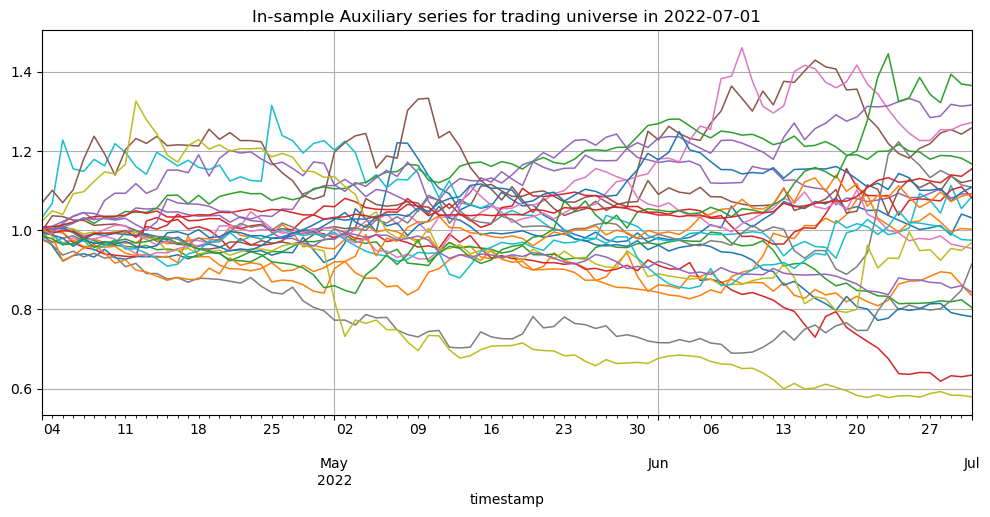

In [90]:
# Plot auxiliary series (cumprod)
for column in test_res_df2.columns:
  np.cumprod(1+test_res_df2[column].loc[test_start_date:]).plot(figsize = (12,5), linewidth = 1.1)

plt.title("In-sample Auxiliary series for trading universe in 2022-07-01")
plt.grid(True)

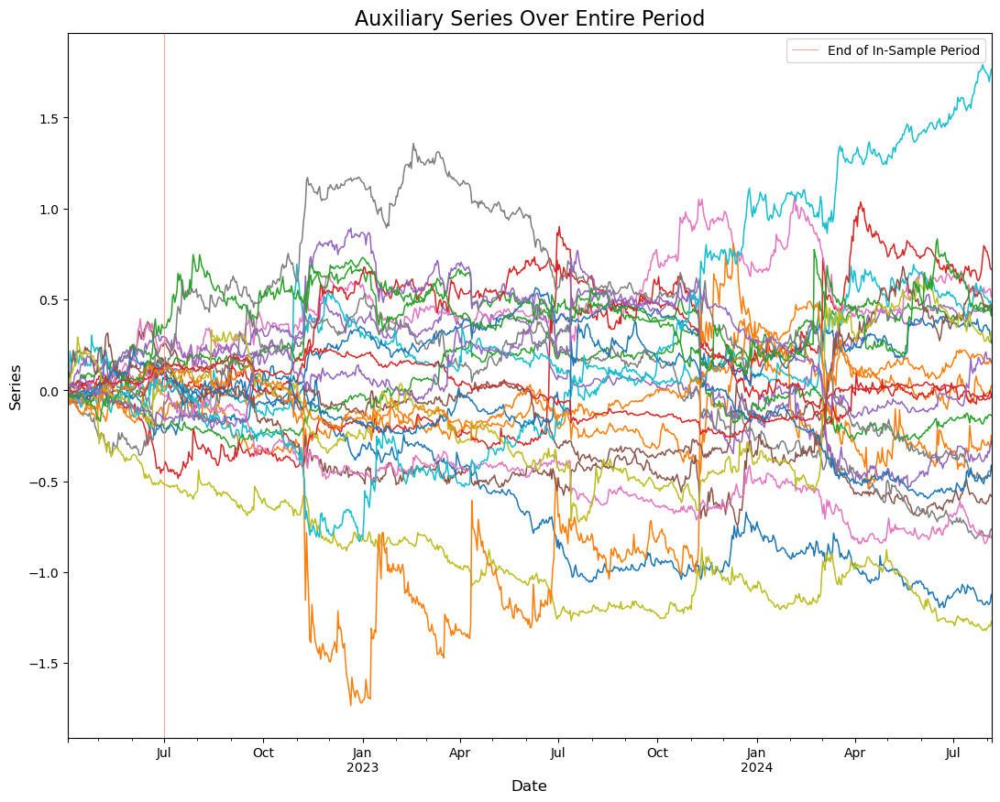

In [91]:
# Plot auxiliary series for entire period

for column in test_res_df.columns:
  np.cumsum(test_res_df[column].loc[test_start_date:]).plot(figsize = (13,10), linewidth = 1.1, label = "_nolegend_")


plt.axvline(pd.to_datetime("2022-07-01"), color = "salmon", linewidth = 0.5, label = "End of In-Sample Period")
plt.title("Auxiliary Series Over Entire Period",fontsize = 16)
plt.xlabel("Date",fontsize = 12)
plt.ylabel("Series",fontsize = 12)
plt.legend(loc = "upper right")

##### Remarks
- As we can see from the auxiliary series plot, the results don't seem too promising, as we can see variance of plots explanding as series is rolled into the future.
- This indicates that assuming static properties over a long period of time is *very unrealistic*; it is imperative that we should use modify our approach such that we incorporate for dynamic properties.


We will now distinguish in-sample and out-of-sample auxiliary series below.

In [93]:
# Color code for clear comparison based on threshold date
threshold_date_str = "2022-07-01"
threshold_date = pd.to_datetime(threshold_date_str)

C:\Users\idkup\AppData\Local\Temp\ipykernel_40564\858860923.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (12,6))


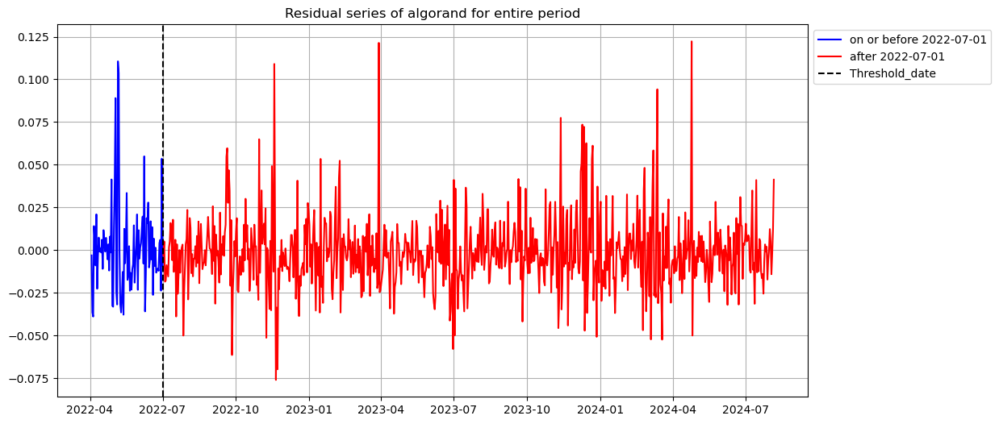

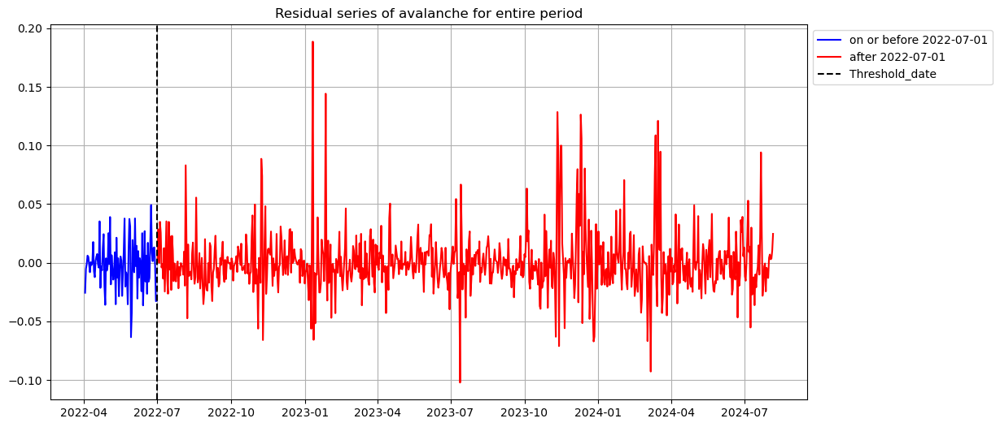

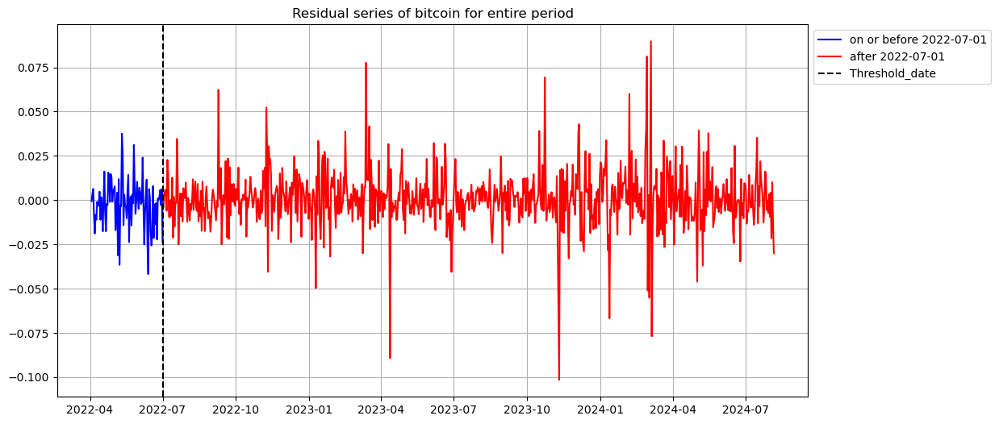

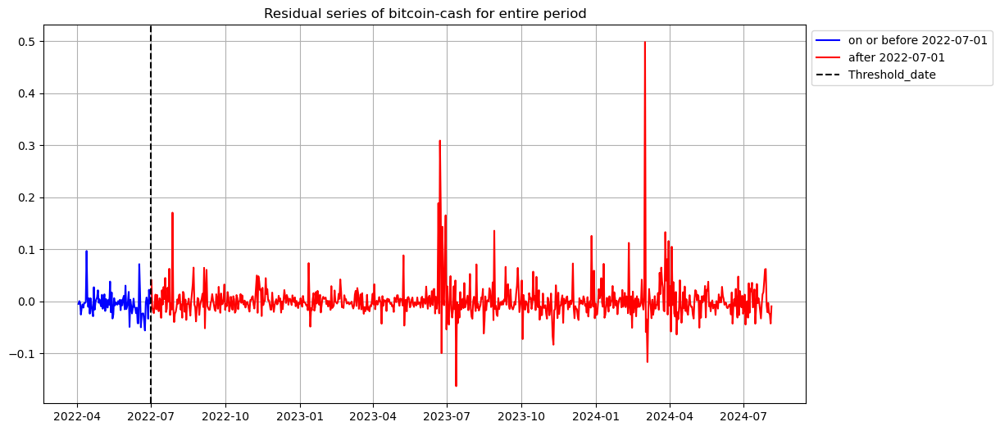

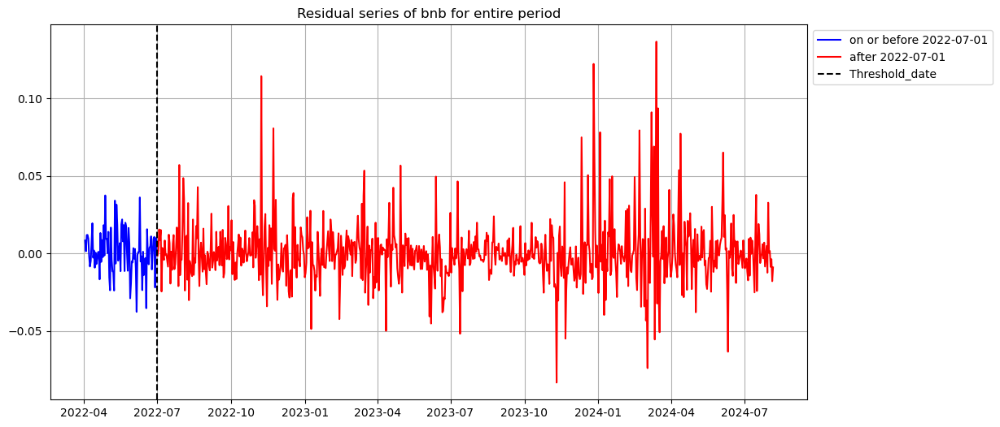

...

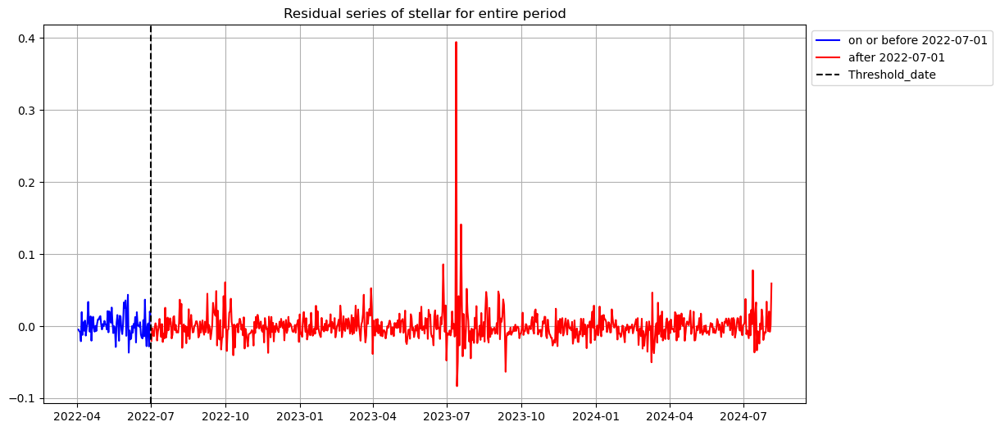

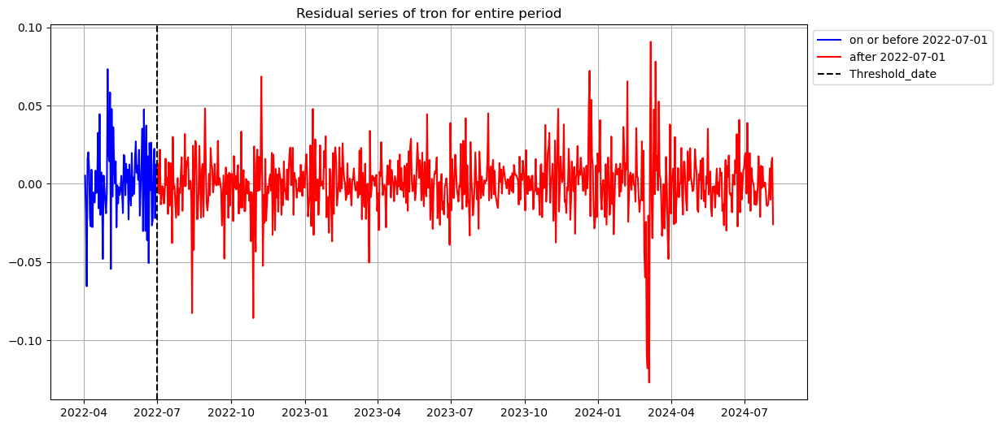

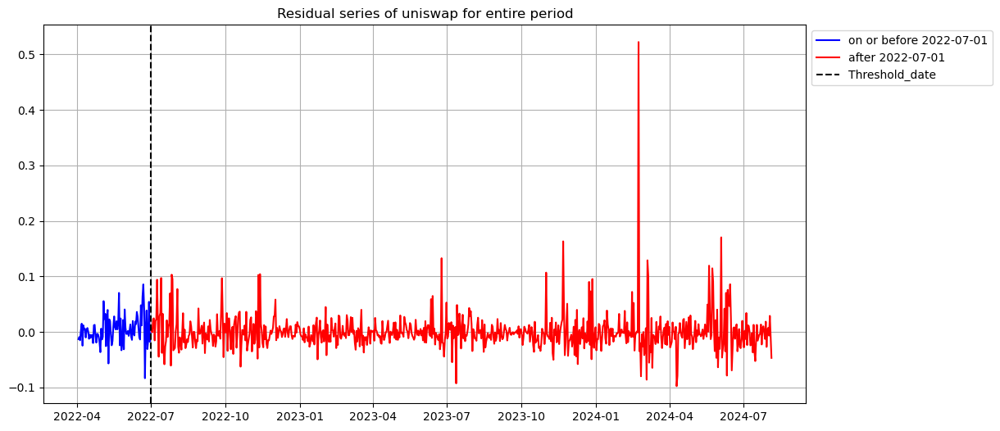

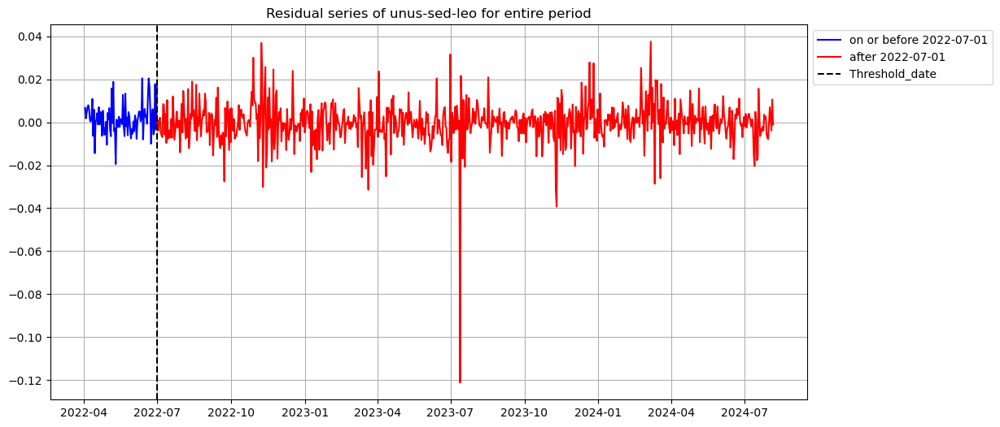

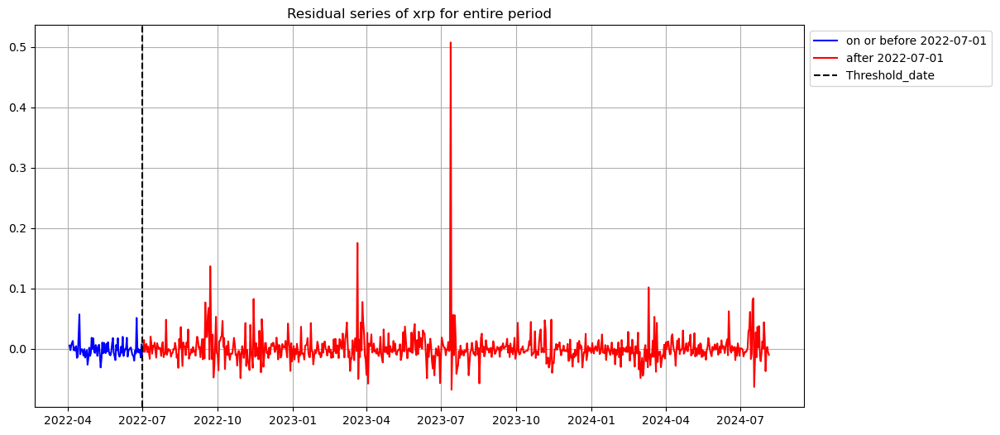

In [94]:
for column in test_res_df.columns:
  plt.figure(figsize = (12,6))
  plt.plot(test_res_df[column].loc[test_start_date: threshold_date].index,
           test_res_df[column].loc[test_start_date: threshold_date],
           color = "blue",
           label = f"on or before {threshold_date_str}"
  )
  plt.plot(test_res_df[column].loc[threshold_date + timedelta(days = 1):].index,
           test_res_df[column].loc[threshold_date + timedelta(days = 1):],
           color = "red",
           label = f"after {threshold_date_str}"
           )
  plt.axvline(threshold_date, color = "black", linestyle = "--", label = "Threshold_date")
  plt.title(f"Residual series of {column} for entire period")
  plt.legend(loc = "upper left", bbox_to_anchor = (1,1), fontsize = 10)
  plt.grid()



C:\Users\idkup\AppData\Local\Temp\ipykernel_40564\14091890.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  continuing_value = np.cumsum(test_res_df[column].loc[test_start_date: threshold_date])[-1]
C:\Users\idkup\AppData\Local\Temp\ipykernel_40564\14091890.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (13,10))


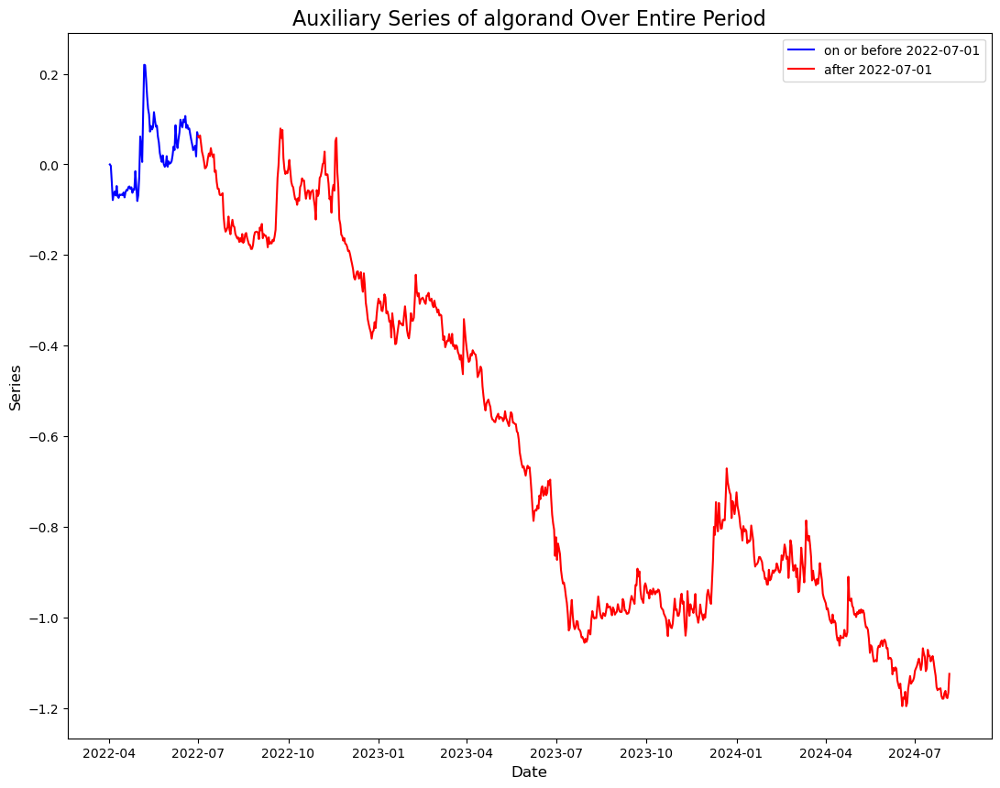

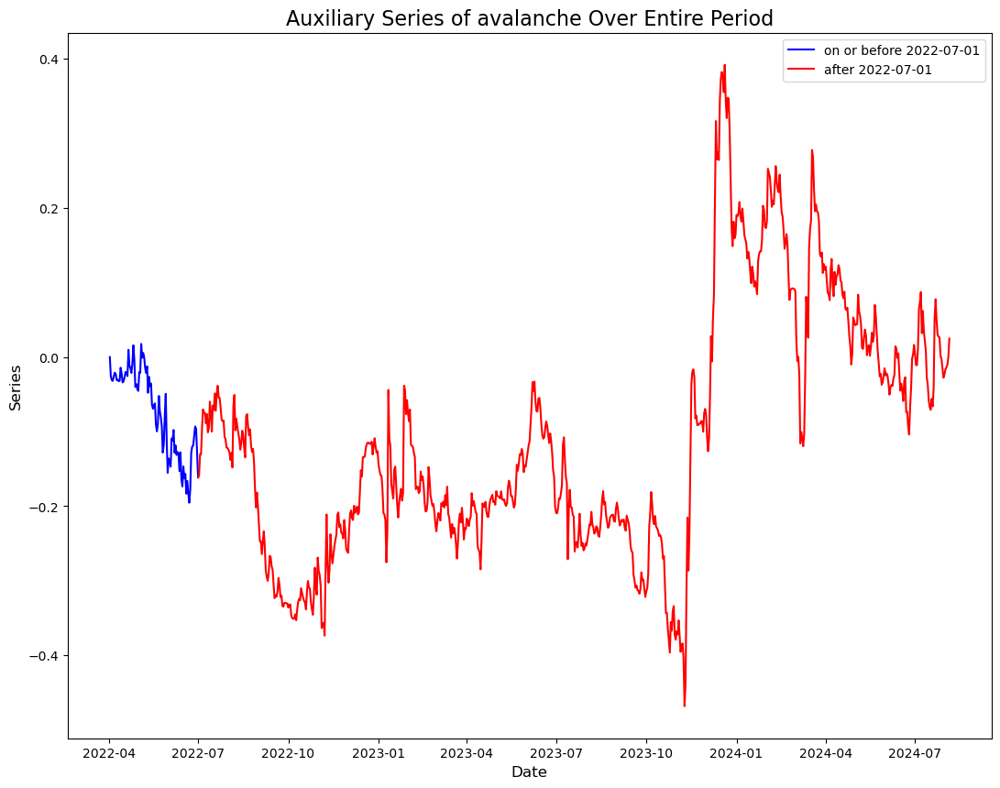

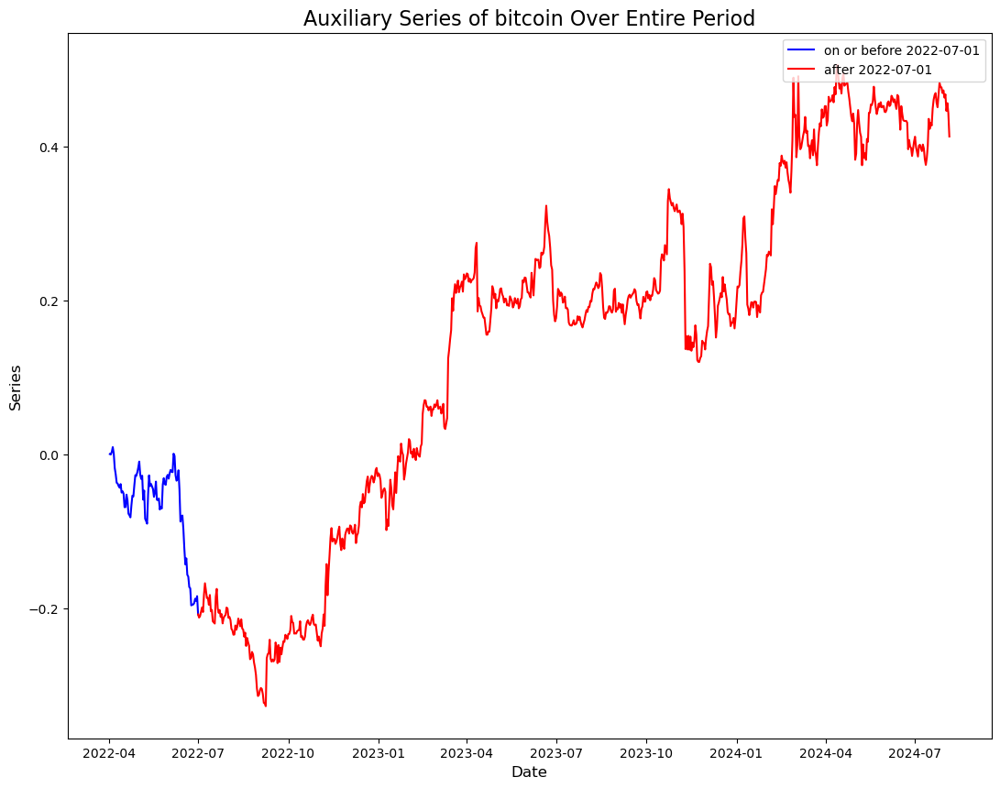

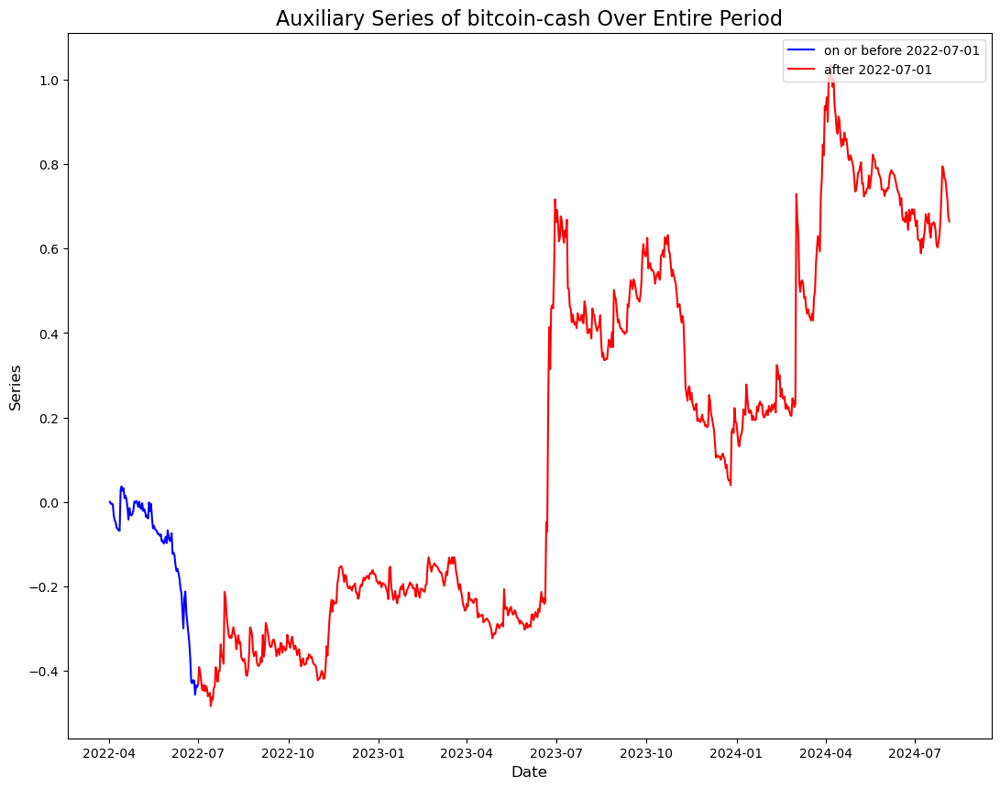

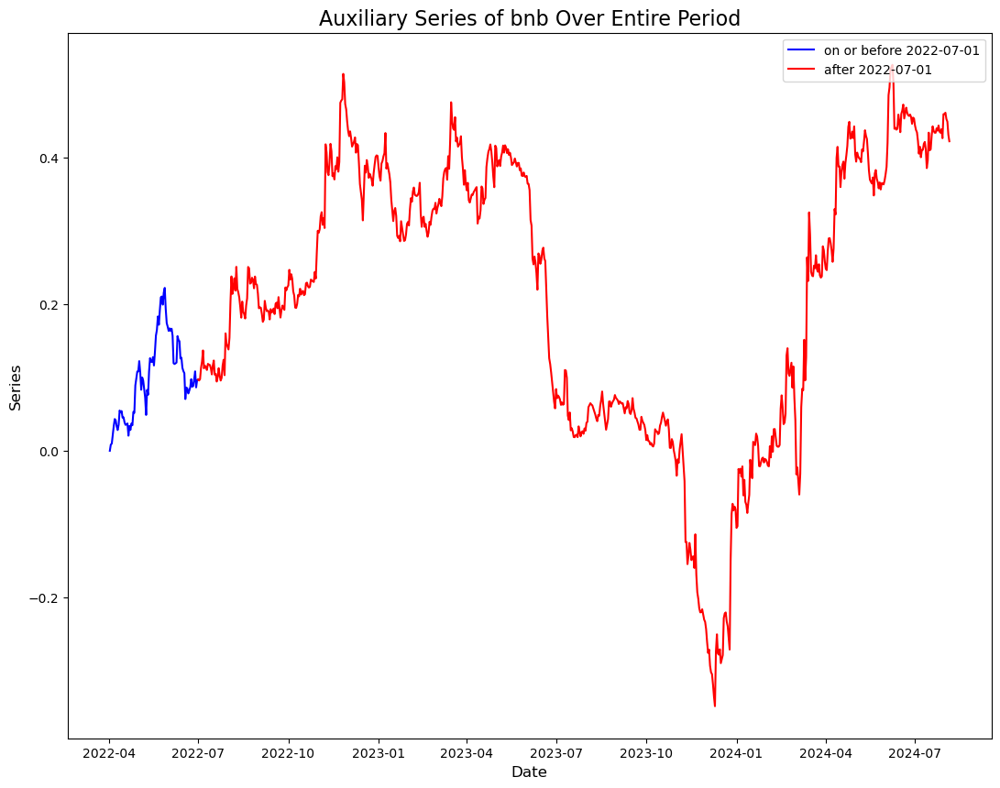

...

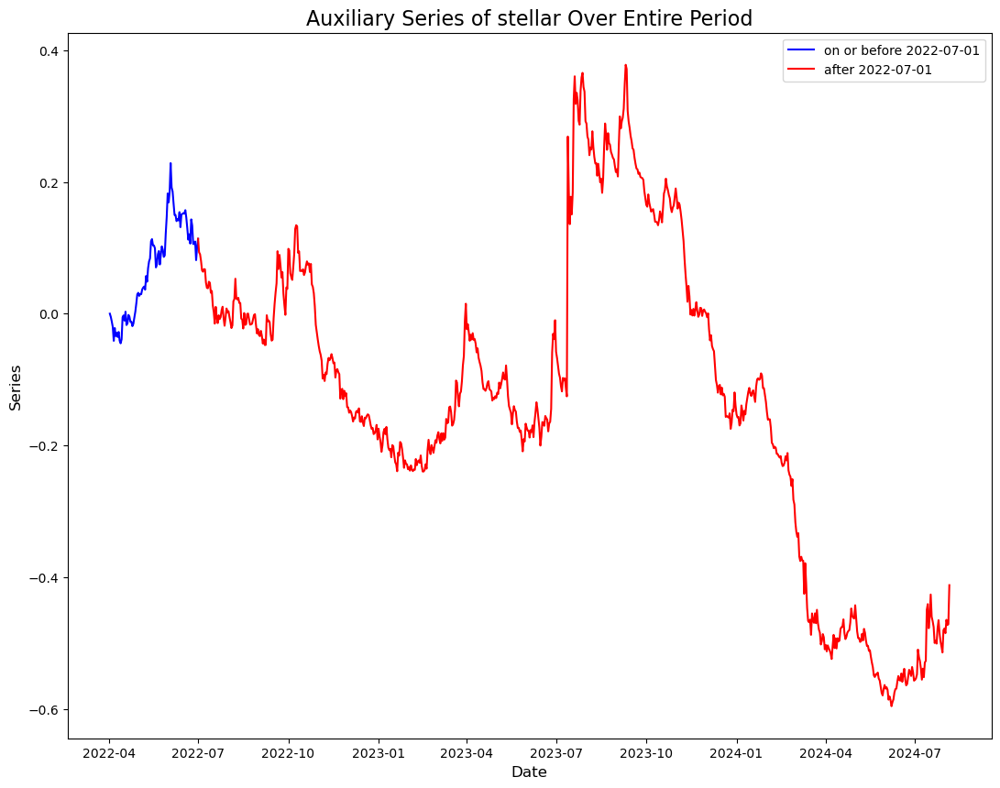

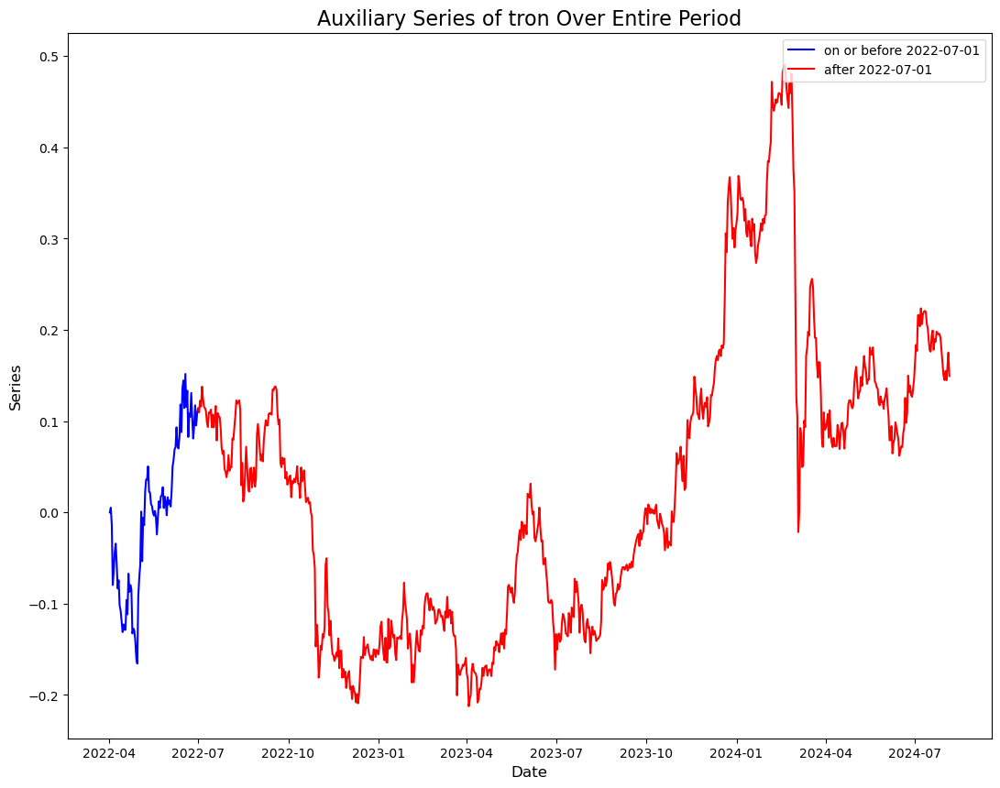

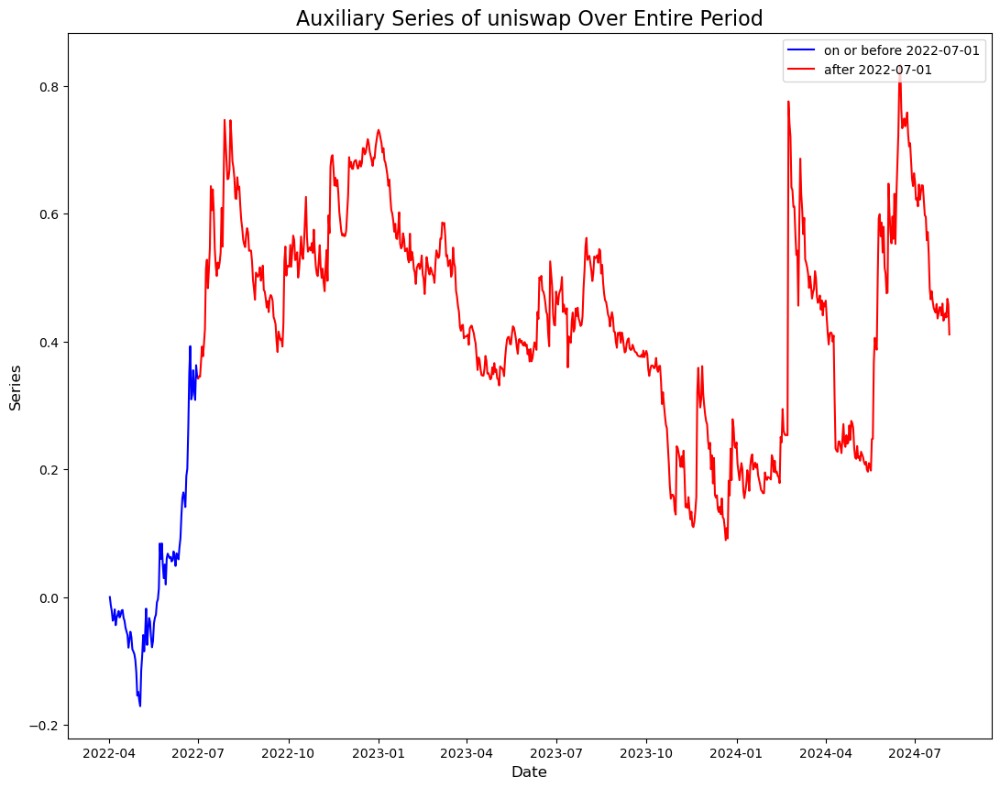

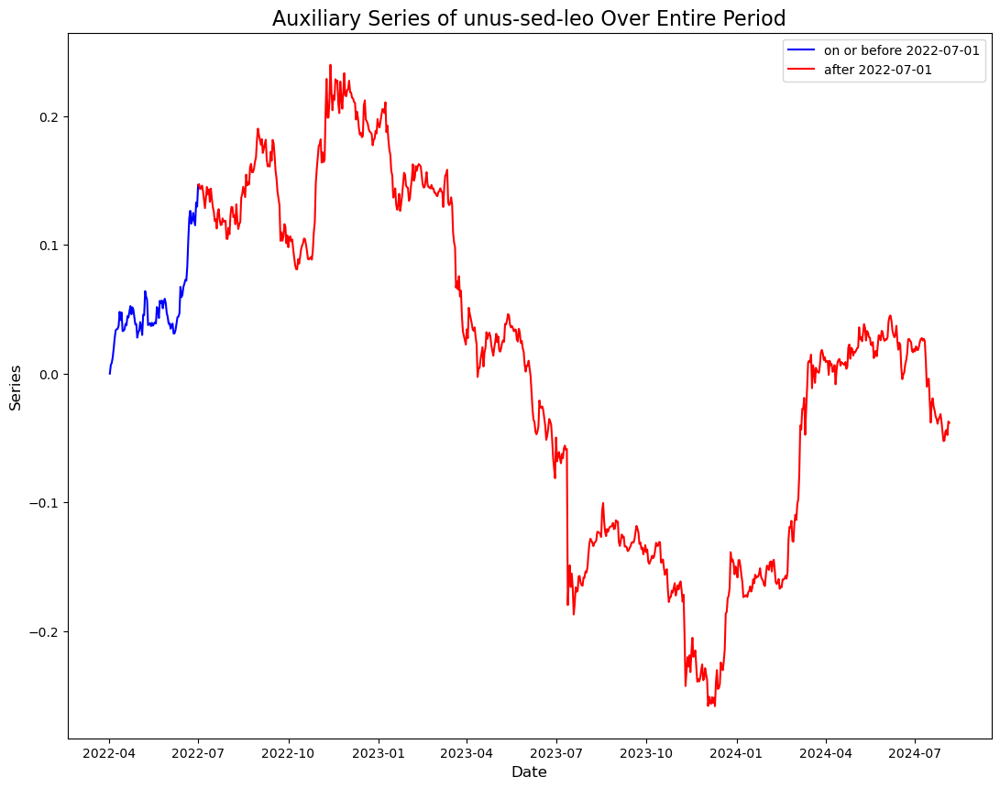

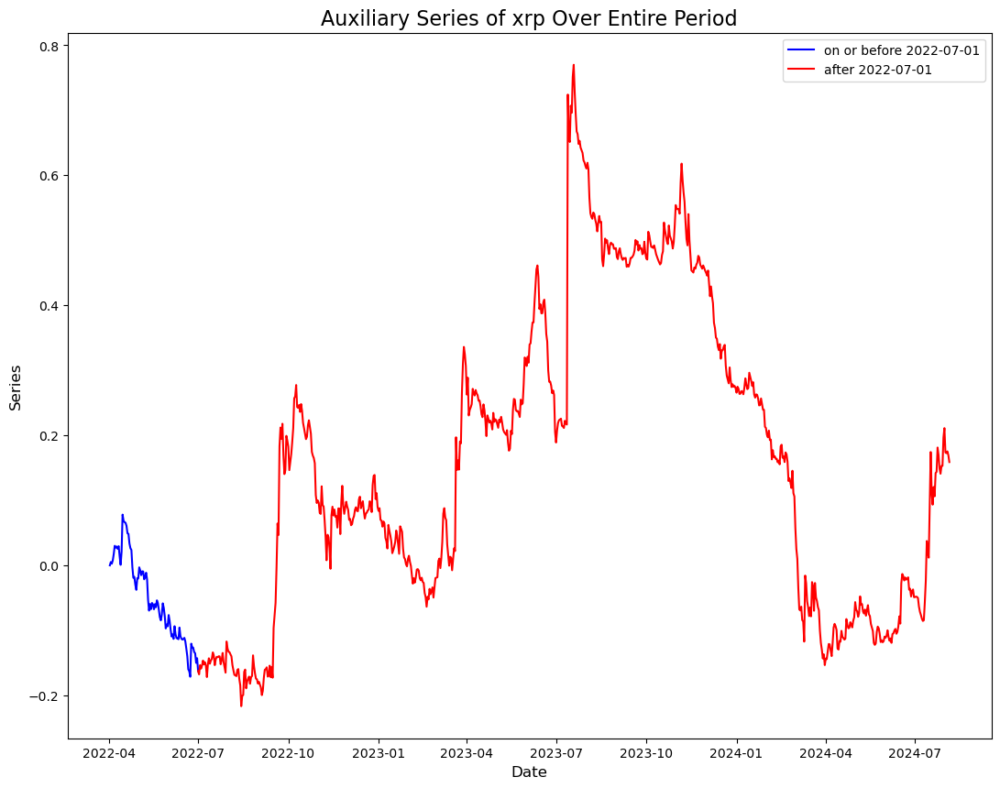

In [95]:
# plot auxiliary series over entire period (20220402 ~ 20240805)
aux_test_start_date = test_start_date - timedelta(days = 1) # We want to standardize all series to start from value 0

for column in test_res_df.columns:
  plt.figure(figsize = (13,10))
  plt.plot(test_res_df[column].loc[aux_test_start_date: threshold_date].index,
           np.insert(np.cumsum(test_res_df[column].loc[test_start_date: threshold_date]), 0, 0), # Insert 0 in front of value array
           color = "blue",
           label = f"on or before {threshold_date_str}"
  )

  continuing_value = np.cumsum(test_res_df[column].loc[test_start_date: threshold_date])[-1]
  

  plt.plot(test_res_df[column].loc[threshold_date:].index,
           # Insert last value from previous series and add it to new cumulative sum series to prevent discontinuity
           np.insert(continuing_value + np.cumsum(test_res_df[column].loc[threshold_date + timedelta(days = 1):]), 0 , continuing_value), 
           color = "red",
           label = f"after {threshold_date_str}"
           )
  
  plt.title(f"Auxiliary Series of {column} Over Entire Period",fontsize = 16)
  plt.xlabel("Date",fontsize = 12)
  plt.ylabel("Series",fontsize = 12)
  plt.legend(loc = "upper right")


## 2.2 Modelling auxiliary series via Ornstein Uhlenbeck Process
The standard Ornstein-Uhlenbeck process is a continuous stochastic process that can be used to model a *mean-reverting series*. It looks something like this:

$$
dX_i(t) = \kappa_i (m_i - X_i(t))dt + \sigma_i dW_i(t) , \quad \kappa_i \gt 0 
$$

where the parameters are given below.

$$\begin{align}
X_i(t) &= \text{mean reverting series with respect to asset i as a function of time t} \\
\kappa_i &= \text{mean reversion parameter or rate of mean reversion} \\
m_i &= \text{long run mean of mean-reverting series} \\
\sigma_i &= \text{volatility of stochastic component} \\
\end{align}$$

$W_i(t)$ is the Weiner process with respect to series $i$ as at time t.

Introducing integration constant $f(X_i(t), t) = X_i(t)e^{\kappa_i t}$ we can derive the analytical solution of $X_i(t)$ given below.

$$
X_i(t_0 + \Delta t) = e^{-\kappa_i \Delta t} X_i(t_0) + \left( 1 - e^{-\kappa_i \Delta t} \right) m_i + \sigma_i \int_{t_0}^{t_0 + \Delta t} e^{-\kappa_i (t_0 + \Delta t - s)} dW_i(s)
$$

Running the regression
$$
X_{n+1} = \hat{a} + \hat{b}\,X_n + \hat{\zeta}_{n+1},
\quad
n = 1,\dots,N-1.
$$

where $X_n = X(t_0 + n \Delta t)$ and samples are sampled at interval $\Delta t$ (note in our case $\Delta t = 1/365$)

Then, the OU parameters can be retrieved from equations below.

$$
a = m \bigl(1 - e^{-\kappa\Delta t}\bigr), 
\quad
b = e^{-\kappa \Delta t},
\quad
\mathrm{Var}(\zeta) = \sigma^2 \;\frac{1 - e^{-2\kappa\Delta t}}{2\kappa}.
$$

$$
\kappa = -\frac{1}{\Delta t}\ln(b), 
\quad
m = \frac{a}{1-b}, 
\quad
\sigma = \sqrt{
  \frac{\mathrm{Var}(\zeta)\,\bigl(2\,\kappa\bigr)}
       {1 - e^{-2\,\kappa\,\Delta t}}
},
\quad
\sigma_{\mathrm{eq}} = \sqrt{\frac{\mathrm{Var}(\zeta)}{1 - b^2}}.
$$

Then, defining $\tau_i = \frac{1}{\kappa_i}$, we choose auxiliary series of crypto $i$ such that $\tau_i \lt T_1$, where $T_1 = \frac{60}{365}$ (since we are considering estimation period of 60 days) for tradable pair.

For pairs that we deem as "mean-reverting enough", there are various ways to generate trading signals. An intuitive and straightforward way is to compute dimensionless variable $$s_i = \frac{X_i(t) - m_i}{\sigma_{eq,i}}$$, which is called the $s-score$ by the original authors. Then, we come up with upper and lower thresholds based on empirical analysis. These boundaries will be used to generate signals on time T, based on data from $T - n \Delta t \quad to \quad T - \Delta t$ , $n = 1 \dots 60$

In [96]:
# set window size to 60 for OU estimation, insert row of 0s to normalize first value of auxiliary series to zero
aux_window_size = 60
test_date_str = "2022-07-01"
test_aux_start_date = datetime.strptime("2022-07-01", "%Y-%m-%d") - timedelta(days = aux_window_size - 1)
test_aux_new_row = pd.DataFrame({coin: 0 for coin in test_res_df.columns}, [test_aux_start_date - timedelta(days = 1)])

test_aux_df = np.cumsum(pd.concat([test_aux_new_row, test_res_df.loc[test_aux_start_date : test_date_str]]), axis = 0)
print(test_aux_df)

            algorand  avalanche   bitcoin  bitcoin-cash       bnb   cardano  \
2022-05-02  0.000000   0.000000  0.000000      0.000000  0.000000  0.000000   
2022-05-03  0.089019  -0.001155 -0.016973     -0.014095 -0.015369  0.001580   
2022-05-04  0.064640   0.037819 -0.022558     -0.017437 -0.039081  0.075122   
2022-05-05  0.032750   0.019338 -0.018366     -0.003806 -0.022337  0.061234   
2022-05-06  0.143339   0.025711 -0.049490     -0.022105 -0.026305  0.057399   
...              ...        ...       ...           ...       ...       ...   
2022-06-27  0.062869  -0.085986 -0.183893     -0.424435 -0.024690  0.215700   
2022-06-28  0.068823  -0.072930 -0.178221     -0.457752 -0.013965  0.237758   
2022-06-29  0.045068  -0.076144 -0.181046     -0.435463 -0.035874  0.244800   
2022-06-30  0.098602  -0.108970 -0.174903     -0.439390 -0.025974  0.235562   
2022-07-01  0.089557  -0.141396 -0.198661     -0.433037 -0.025121  0.248499   

            chainlink    cosmos    cronos  dogecoin

C:\Users\idkup\AppData\Local\Temp\ipykernel_40564\2227779865.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (10,4))


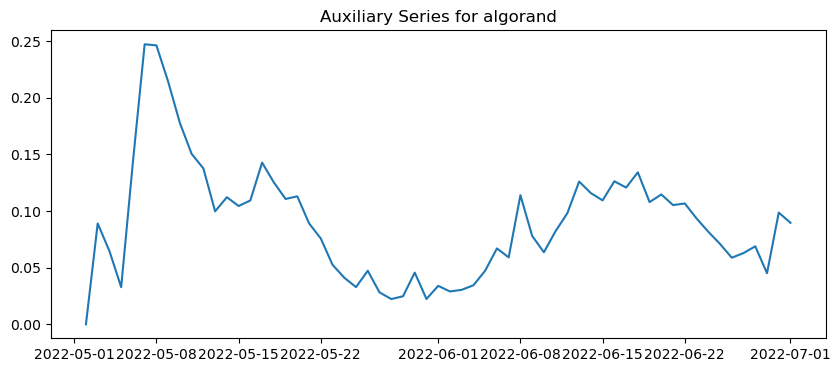

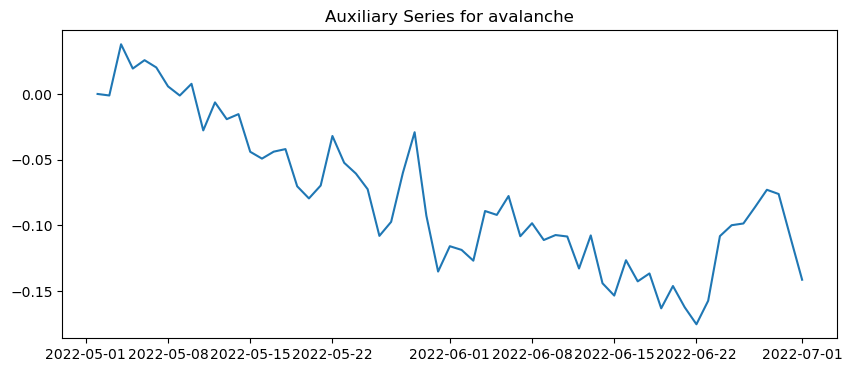

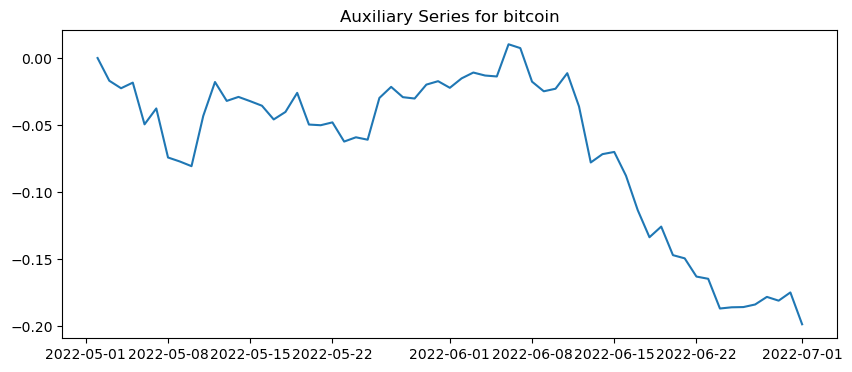

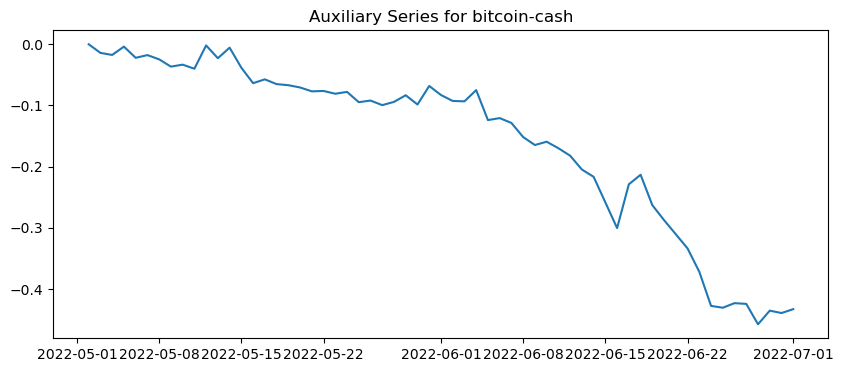

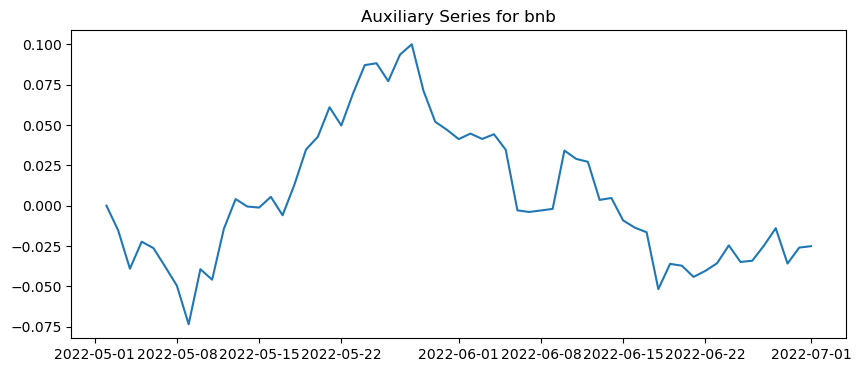

...

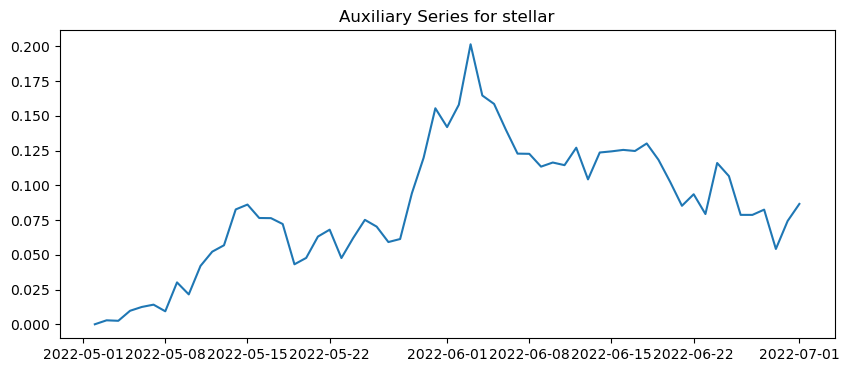

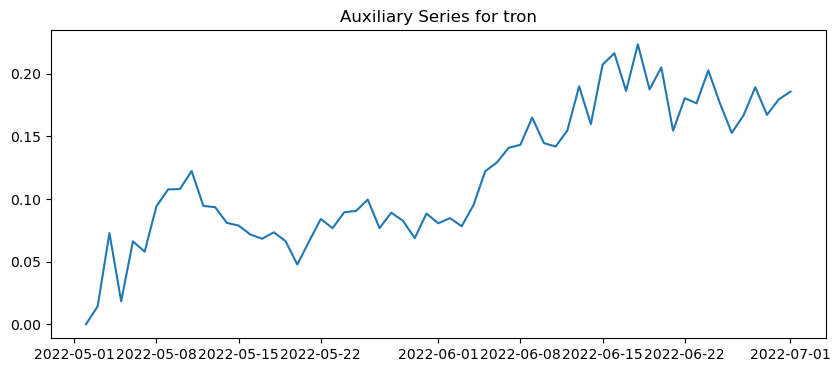

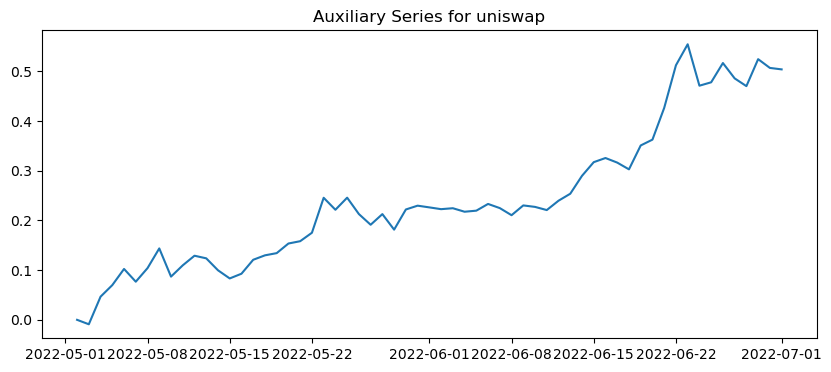

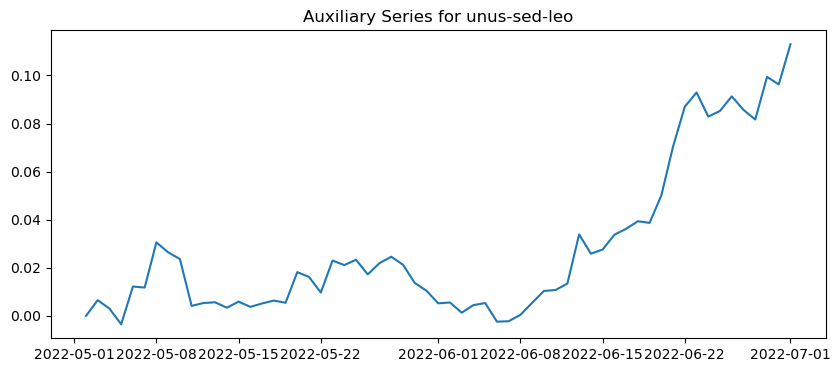

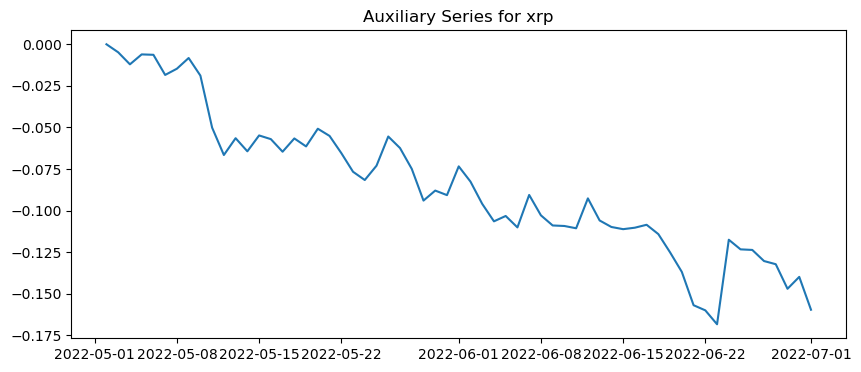

In [97]:
for column in test_aux_df.columns:
  plt.figure(figsize = (10,4))
  plt.plot(test_aux_df.index, test_aux_df[column], label = f"auxiliary series for {column}")
  plt.title(f"Auxiliary Series for {column}")

In [99]:
import math
import statsmodels.api as sm  # for OLS

def estimate_ou_params(aux_df, 
                                   dt=1/365, 
                                   T1=30/365):
    """
    Estimate OU parameters for each column (coin) in aux_df via an AR(1) regression:
        X_{n+1} = a + b * X_n + error_{n+1},
    using statsmodels OLS for coefficient estimation.
    
    Then invert to get OU parameters:
        kappa, m, sigma, sigma_eq, tau.

    Parameters
    ----------
    aux_df : pd.DataFrame
        DataFrame of auxiliary series, indexed by date (or time),
        with columns = coins, rows = time steps.
    dt : float
        Time step in years (e.g., 1/365 for daily data).
    T1 : float
        Threshold for tau (in years). If tau_i < T1 => coin is "tradable".

    Returns
    -------
    ou_params_df : pd.DataFrame
        OU parameters for each coin. Columns = [kappa, m, sigma, sigma_eq, tau].
    ranked_coins : list of str
        Coins sorted by ascending tau (most mean-reverting first).
    tradable_coins : list of str
        Coins whose tau < T1 (the "tradable" set).
    """

    results = []

    for coin in aux_df.columns:
        # Pull out the series and drop any NaNs
        X = aux_df[coin].dropna().values
        
        if len(X) < 2:
            # Not enough data; store NaNs or skip
            results.append({
                "coin": coin,
                "kappa": np.nan,
                "m": np.nan,
                "sigma": np.nan,
                "sigma_eq": np.nan,
                "tau": np.nan
            })
            continue
        
        # Build AR(1) model:
        # Y = X[1:], X_lag = X[0:-1]
        Y = X[1:]
        X_lag = X[:-1]
        
        # Use statsmodels OLS
        X_lag_mat = sm.add_constant(X_lag)  # shape: (n_samples, 2) => [1, X_lag]
        
        # Fit OLS: Y ~ a + b*X_lag
        model = sm.OLS(Y, X_lag_mat).fit()
        
        a = model.params[0]          # Intercept
        b = model.params[1]          # Slope
        var_eps = model.mse_resid    # Variance of residuals

        # Now invert AR(1) => OU params
        if b != 1.0:
            # kappa = -(1/dt)*log(b)
            # m = a / (1 - b)
            if b > 0:
                kappa = -1.0 / dt * math.log(b)
            else:
                kappa = np.nan  # b <= 0 => invalid for standard OU assumption

            if (1 - b) != 0:
                m_val = a / (1 - b)
            else:
                m_val = np.nan
        else:
            # b=1 => no mean reversion
            kappa = 0.0
            m_val = 0.0
        
        # var_eps = sigma^2 * [(1 - exp(-2*kappa dt)) / (2*kappa)]
        if (kappa > 0) and (1 - math.exp(-2*kappa*dt) > 0):
            sigma_val = math.sqrt(
                var_eps * 2 * kappa / (1 - math.exp(-2*kappa*dt))
            )
        else:
            sigma_val = math.sqrt(var_eps) if var_eps > 0 else 0
        
        if kappa > 0:
            sigma_eq_val = sigma_val / math.sqrt(2*kappa)
            tau_val = 1.0 / kappa
        else:
            sigma_eq_val = np.nan
            tau_val = np.inf
        
        results.append({
            "coin": coin,
            "kappa": kappa,
            "m": m_val,
            "sigma": sigma_val,
            "sigma_eq": sigma_eq_val,
            "tau": tau_val
        })

    # Create DataFrame
    ou_params_df = pd.DataFrame(results).set_index("coin")

    # Rank coins by ascending tau
    ranked_coins = list(
        ou_params_df.sort_values("tau", ascending=True).index
    )

    # Filter: tau < T1 => "tradable"
    mask = ou_params_df["tau"] < T1
    tradable_coins = list(ou_params_df.loc[mask].index)

    return ou_params_df, ranked_coins, tradable_coins


In [ ]:
test_ou_params_df, test_coins, test_tradable_coins = estimate_ou_params(test_aux_df, dt = 1/365, T1 = 30/365)

# Save df to csv
test_ou_params_df.to_csv("20220701_ou_params_df.csv")

In [101]:
print(f"mean_reverting_list on 2022-07-01: {test_tradable_coins}")

mean_reverting_list on 2022-07-01: ['algorand', 'avalanche', 'bnb', 'cardano', 'chainlink', 'dogecoin', 'hex', 'litecoin', 'monero', 'near-protocol', 'polkadot-new', 'polygon', 'shiba-inu', 'solana', 'stellar', 'tron', 'xrp']


##### Remarks
- When eyeballing charts, it seemed impossible to find a pair displaying mean-reverting behaviour over the sample period. However, when modelling via OU process, we see that quite a few pairs pass the threshold suggested in the original paper by Avellaneda ($\tau_i \lt T_1$ where $T_1 = 60 / 365$). We instead use $T_1 = 7 / 365$, which can be interpreted as we want to look for pairs whose *average time the series will revert back to their long run mean is 7 days*. 
- From period 2022-05-02 ~ 2022-07-01, **algorand, dogecoin, liteocin, near-protocol, and shibainu** seemed to display mean-reverting behvaviour when traded against the top five eigenportfolios. Note that there is high chance that in-sample performance *do not mirror the reality* because we are using eigenportfolios extracted from data *up until 2022-07-01*, while the OU process is estimated *based on data before 2022-07-01*. Naively concluding that we will be able to extrapolate in-sample performance into the future is same as committing the sin of overlooking *look-forward bias.* This highlights the importance of analyzing out-of-sample performance, for which we will be adopting the walk-forward backtesting method.


# 3. Analysis of Mean Reversion Property

When trading live, we will have to re-run the OU estimation process. Consequently, this will result in changing mean-reversion lists (denote as $mrl_t$ where t is the time index that has 1 to 1 mapping with actual date) each day.

We define mean-reversion list at time t as $mrl_t$. 

First, note that our final coin selection (for trading) depends on two filters:
1. trading universe filter
2. mean-reversion filter

The former is relevant once every month since that will be our rebalance frequency. Dealing with latter case is a bit more involved. This is because we have to answer the question: *how should we deal with an already open position if on the next day the coin in question is suddenly filtered out?* In general, I believe you shouldn't give your models too much credit; just because a coin doesn't meet some arbitrary (or non-arbitrary) threshold you set does not make it disqualified for mean-reversion. It is well known that we can trade series that fail the ADF test quite profitably, if we are careful enough with our signal generation/execution methodology. Therefore, after a bit of thinking, I became comfortable with the following set of rules.

- If we have a mean-reversion trade open for a specific coin, and the following day we find out that the coin in question is filtered out during the process of estimating the Ornstein-Uhlenbeck process, we start a count that increments by 1. Each day the count increments by 1 if on that day we still find the coin is excluded from the final mean-reversion list. When the count reaches $q$, then we close the trade, regardless of making or losing money.
- Denoting the count as $coin_m$, if $1 \lt coin_m \lt q$ and the coin appears within the mean-reversion list, the count is reset to zero and the position is maintained until it hits target profit level.

##### Minimizing false positive vs false negative
In our case, the null hypothesis is: coin is not mean reverting. The alternative, the condition which we wish is present is: coin is mean-reverting. 

The question then becomes: *do we want to minimize false positive cases (incorrectly predicting the coin is mean-reverting when in fact it is not mean-reverting) or minimize false negative cases (incorrectly predicting the coin is not mean-reverting when in fact it is mean-reverting)?*

In the naive case, the answer to previous question becomes clear when we consider the magnitude of cost of committing each error. Obviously, trading a coin that we believe is mean-reverting when in fact it isn't is more costly than the alternative case (in which we don't put on a trade). Hence, under normal circumstances (when we don't have open positions), minimizing false positive cases seem to be the more wise decision. But things are a bit more nuanced when we add in the condition *we currently have open positions with respect to the coin in question*. This is because we not only have to consider the cost of trading a false positive case, but we also have to consider the cost of closing out positions with respect to our currently open position.

This all means that while choosing $q$ that minimizes false positives rather than false negatives is the correct approach, **we don't want to just set q = 1, which may lead us to close out open positions too frequently, costing us unnecessarily.**

Okay, We used too many words to show that answering the following question should be our objective: **what should be the appropriate level of $q$ that doesn't incur too much trading costs while at the same time limiting the probability of maintaining a mean-reversion trade that lost its mean-reversion property?** 

To answer this question, we want to know the answers to the following set of questions:
- If a coin gets excluded from the list, what is the probability that it stays excluded in the future?
- What is the appropriate amount of waiting time for which the excluded coin stays excluded in the future?

To answer these sub-questions of our big question (what is optimal level of q), we will analyze the dynamic behaviour of appearances of coins in the mean-reversion-list over the entire period.

In [102]:
# Check how mean-reverting list changes through time
test_mrl_date = "2022-06-24"
OOS_end_date = "2024-08-05"
aux_window_size = 60

start_date = datetime.strptime(test_mrl_date, "%Y-%m-%d")
end_date = datetime.strptime(OOS_end_date, "%Y-%m-%d")
date_range_str = []

current_date = start_date
while current_date <= end_date:
  date_range_str.append(current_date.strftime("%Y-%m-%d"))  
  current_date += timedelta(days = 1)

mrl_result = {date: [] for date in date_range_str}


# Start loop for each auxliary series df
for date in pd.date_range(test_mrl_date, end = test_res_df.index[-1], freq = "D"):
  test_mrl_start_date = date - timedelta(days = aux_window_size - 1)
  test_aux_new_row = pd.DataFrame({coin: 0 for coin in test_res_df.columns}, [test_mrl_start_date - timedelta(days = 1)])
  test_aux_df2 = np.cumsum(pd.concat([test_aux_new_row, test_res_df.loc[test_mrl_start_date : date]]), axis = 0)
  
  # For each auxiliary series, estimate OU process, but only get mean-reverting list
  _ , _, mrl_coins = estimate_ou_params(test_aux_df2, dt = 1/365, T1 = 7/365)

  date_str = date.strftime("%Y-%m-%d")
  mrl_result[date_str] = mrl_coins

mrl_result["2022-06-25"]

['algorand', 'cosmos', 'litecoin', 'near-protocol']

In [106]:
# Convert to df for analysis
unique_coins = list(set(coin for coins in mrl_result.values() for coin in coins))

mrl_df = pd.DataFrame(index = mrl_result.keys(), columns = unique_coins).fillna(0)

for date, coin in mrl_result.items():
  mrl_df.loc[date, coin] = 1

mrl_df = mrl_df.astype(int)
mrl_df.head()

C:\Users\idkup\AppData\Local\Temp\ipykernel_40564\2428648757.py:4: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  mrl_df = pd.DataFrame(index = mrl_result.keys(), columns = unique_coins).fillna(0)


,xrp,ethereum,near-protocol,bitcoin-cash,ftx-token,dogecoin,litecoin,uniswap,cosmos,shiba-inu,...,bitcoin,tron,polkadot-new,hex,monero,avalanche,bnb,stellar,cardano,solana
2022-06-24,0,0,1,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2022-06-25,0,0,1,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2022-06-26,0,0,1,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2022-06-27,0,0,1,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2022-06-28,0,0,1,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0


In [107]:
# Total Occurences of each coin
mrl_freq = mrl_df.sum(axis = 0).sort_values(ascending = False)

print(mrl_freq)

polkadot-new     305
near-protocol    303
litecoin         286
avalanche        275
ftx-token        273
cronos           262
cardano          242
bitcoin-cash     237
chainlink        229
tron             226
xrp              199
algorand         193
bitcoin          191
uniswap          189
unus-sed-leo     186
dogecoin         176
monero           174
hex              164
bnb              154
solana           125
shiba-inu         97
polygon           96
cosmos            95
ethereum          87
stellar           86
dtype: int64


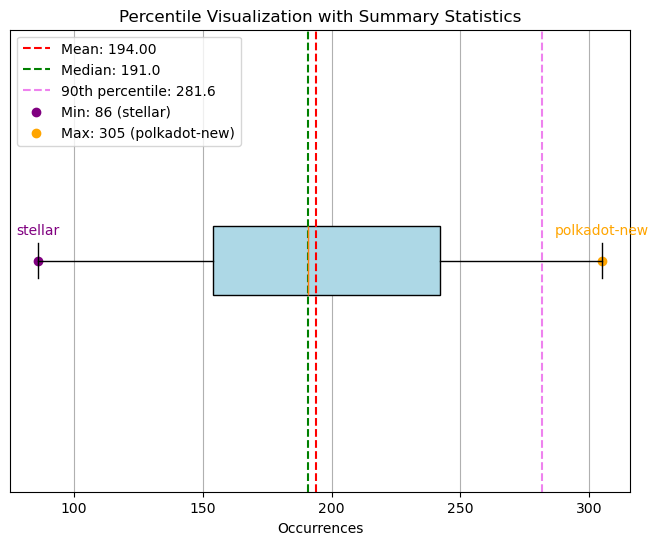

In [108]:
# Plot box plot
plt.figure(figsize=(8, 6))
plt.boxplot(mrl_freq, vert=False, patch_artist=True, boxprops=dict(facecolor="lightblue"))

# Define quantile variables
p10 = mrl_freq.quantile(0.1)
p90 = mrl_freq.quantile(0.9)
p25 = mrl_freq.quantile(0.25)
p75 = mrl_freq.quantile(0.75)

# Add mean, median, quartiles, min, and max
# Add mean, median, min, max annotations
plt.axvline(mrl_freq.mean(), color="red", linestyle="--", label=f"Mean: {mrl_freq.mean():.2f}")
plt.axvline(mrl_freq.median(), color="green", linestyle="--", label=f"Median: {mrl_freq.median()}")
plt.axvline(p90, color = "violet", linestyle = "--", label = f"90th percentile: {p90}" )
plt.scatter(x = mrl_freq.min(),y=  1, color="purple", label=f"Min: {mrl_freq.min()} ({mrl_freq.idxmin()})")
plt.scatter(mrl_freq.max(), 1, color="orange", label=f"Max: {mrl_freq.max()} ({mrl_freq.idxmax()})")

# Add annotations for min and max
plt.text(x = mrl_freq.min(), y = 1.05, s = f"{mrl_freq.idxmin()}", fontsize = 10, color = "purple", ha = "center", va = "bottom")
plt.text(x = mrl_freq.max(), y = 1.05, s = f"{mrl_freq.idxmax()}", fontsize = 10, color = "orange", ha = "center", va = "bottom")
# Add title and labels
plt.title("Percentile Visualization with Summary Statistics")
plt.xlabel("Occurrences")
plt.yticks([])  # Hide y-axis as it's not needed for a single boxplot
plt.legend()
plt.grid(axis="x")

plt.show()

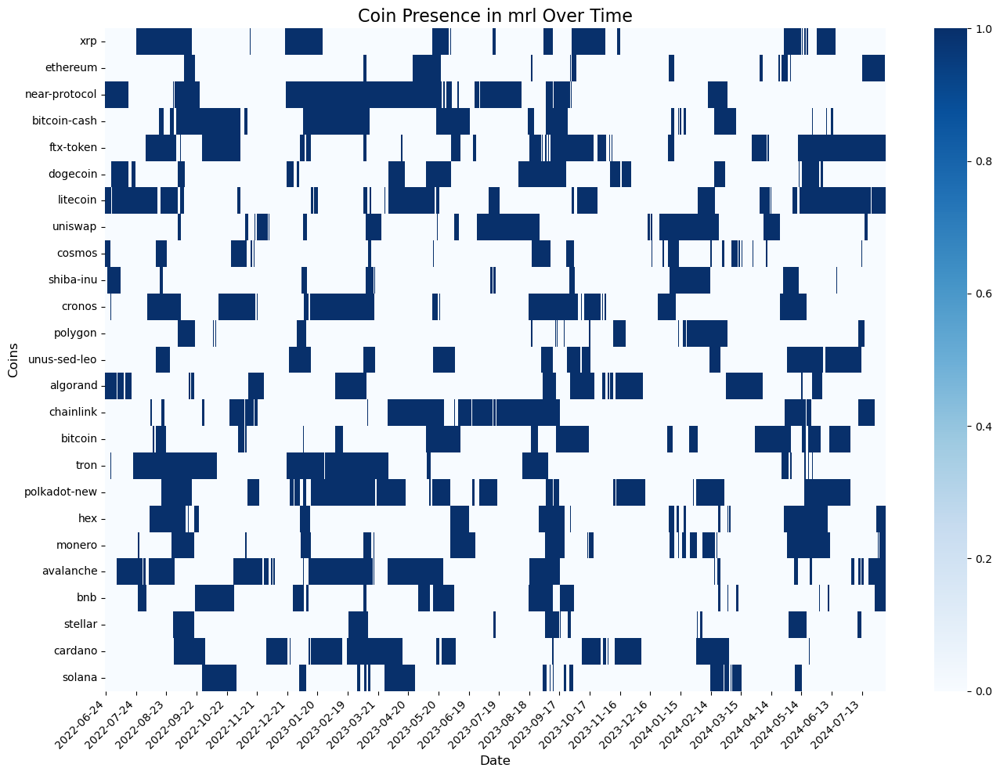

In [109]:
# Visualize occurrence over time for each coin
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 10))
sns.heatmap(mrl_df.T, cmap="Blues", cbar=True, xticklabels=30, yticklabels=True)

# Rotate the x-axis labels to make them readable
plt.xticks(rotation=45, ha="right")

# Add labels and title
plt.title("Coin Presence in mrl Over Time",fontsize = 16)
plt.xlabel("Date",fontsize = 12)
plt.ylabel("Coins",fontsize = 12)

# Display the plot
plt.tight_layout()


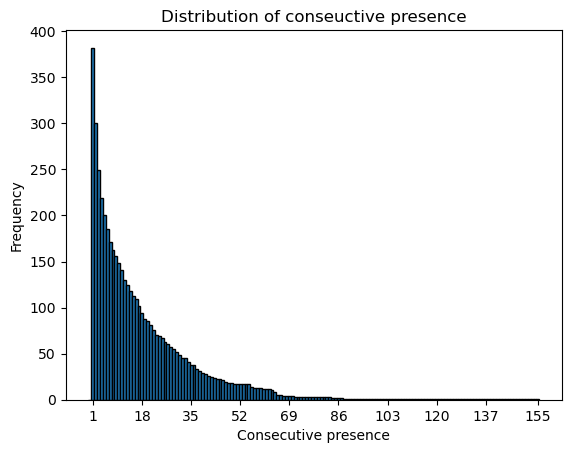

,counts,percentage_chage
0,14500,0.973655
1,382,0.214660
2,300,0.170000
3,249,0.120482
4,219,0.086758
5,200,0.075000
6,185,0.075676
7,171,0.052632
8,162,0.037037
9,156,0.051282


In [110]:
# Construct cumulative sum for consecutive non-zero values only
cumsum_reset_dic = {}
for coin in mrl_df.columns:
  cumulative_sum = 0
  cumsum_reset = []
  for i in mrl_df[coin]:
    if i == 1:
      cumulative_sum += 1
    else:
      cumulative_sum = 0
    cumsum_reset.append(cumulative_sum)
  cumsum_reset_dic[coin] = np.array(cumsum_reset)
cumsum_reset_df = pd.DataFrame(cumsum_reset_dic, index = mrl_df.index)

# Visualize
all_values = cumsum_reset_df.values.flatten()
non_zero_values = all_values[all_values > 0]
plt.hist(non_zero_values, bins=range(0, max(all_values)+2), edgecolor='black', align='left')
plt.title('Distribution of conseuctive presence')
plt.xlabel('Consecutive presence')
plt.ylabel('Frequency')
plt.xticks(np.linspace(min(non_zero_values), max(non_zero_values), 10, dtype=int))
plt.show()

unique_values, counts = np.unique(all_values, return_counts= True)
abs_diff = np.abs(counts[:-1] - counts[1:])
change_percentage = abs_diff / counts[:-1] 
pd.DataFrame({"counts": counts[:-1], "percentage_chage":change_percentage}, index = unique_values[:-1]).iloc[0:15]

##### Remarks
- We see that there is stark difference from setting $q=1$ and $q \gt 1$. For instance, 20% of the time we see a coin being included in $mrl_t$ for the first time, it has been excluded the next day. However, this percentage change decreases rapidly for larger $q$, indicating the rate of false positive decreases as we choose to trade coins that pass the mean-reversion filter for longer days.
  - This test does ignore the case in which a coin fluctuates between the value 0 and 1 consecutively, which may indicate the coin is mean-reverting but not long enough to pass the filter consecutive number of times.

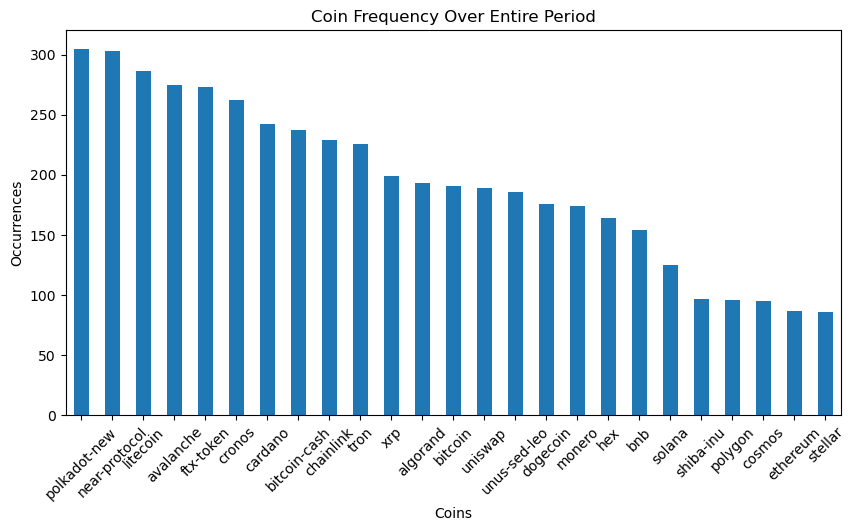

In [111]:
# Visualize number of occurrences over entire period for each coin
mrl_freq.plot(kind="bar", figsize=(10, 5))
plt.title("Coin Frequency Over Entire Period")
plt.xlabel("Coins")
plt.ylabel("Occurrences")
plt.xticks(rotation=45)
plt.show()


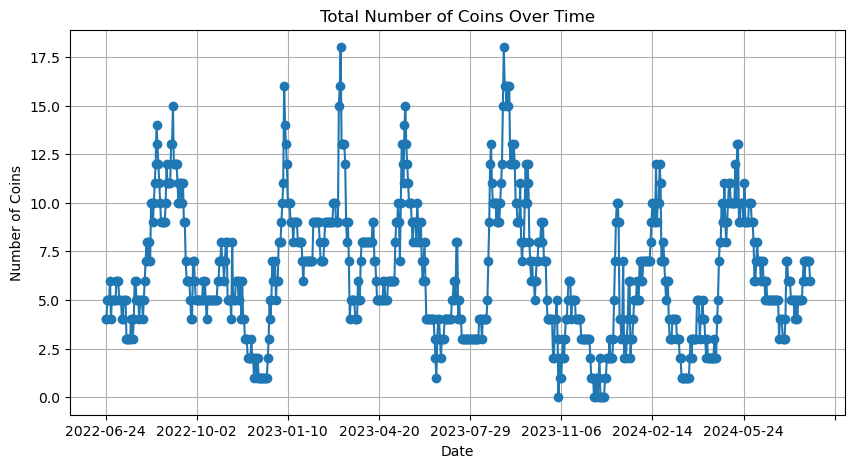

In [112]:
# Total number of mrl constituents over time
total_coins_per_day = mrl_df.sum(axis=1)
total_coins_per_day.plot(kind="line", figsize=(10, 5), marker='o')
plt.title("Total Number of Coins Over Time")
plt.xlabel("Date")
plt.ylabel("Number of Coins")
plt.grid()
plt.show()


##### Remarks

- Near-Protocol seemed to display most mean-reverting behaviour, consistently being mean-reverting between late 2022 and late 2023.
- All coins appear at least 100 times in the $mrl$ over the entire period. 
- Bitcoin and Ethereum, the leading two coins, don't seem to display much mean-reverting behaviour. This is somewhat surprising, since one would expect Bitcoin and Ethereum to be *the* market for cryptocurrencies, so hedging them with eigenportfolios should leave us with minimal idio risk...? An immediate thought was that maybe the eigenportfolios themselves don't have much exposure to bitcoin and ethereum, at least not as much as we would have thought they would. This question derserves more thinking.
- On average, $E[mrl_t] \approx 6.47$.
- A key observation is that **occurences seem to be sticky**. In other words, a coin that is included in a sequence of $mrl_t$ is more likely to be included in the next future sequence of $mrl_t$ compared to a coin that is excluded or a coin that has been included for one or two days. Not only are occurrences sticky, also **non-occurrences seem to be sticky as well.**

We will work with the last observation a bit more.



In [ ]:
def mrl_cond_prob(df, 
                                         past_lag=2, 
                                         future_lag=2,
                                         past_value=1,
                                         future_value=1):
    """
    Compute:
      1) The empirical probability (conditional_probability) that the next `future_lag` days 
         are all == `future_value`, GIVEN that the past `past_lag` days are all == `past_value`.
      2) The unconditional probability (unconditional_probability) that ANY `future_lag` days 
         in the series are all == `future_value` (with no condition on the past window).

    In notation:
        P( O_{t+1}=fv, ..., O_{t+future_lag}=fv 
          | O_{t}=pv, O_{t-1}=pv, ..., O_{t-(past_lag-1)}=pv )

    for each column (coin) in df, which has 0/1 entries.

    Parameters
    ----------
    df : pd.DataFrame
        Rows = dates (or time steps), columns = coins, values in {0,1}.
    past_lag : int
        Number of consecutive days in the past that must be == `past_value`.
    future_lag : int
        Number of consecutive days in the future that must be == `future_value`.
    past_value : int
        Either 0 or 1; the value for the past condition.
    future_value : int
        Either 0 or 1; the value for the future condition.

    Returns
    -------
    result_df : pd.DataFrame
        Index = coin names
        Columns:
          "conditional_probability": 
              (count_both_satisfied / count_past_satisfied) 
               if count_past_satisfied > 0, else NaN
          "count_past_satisfied": 
              How many time points t had the past-lag condition satisfied
          "count_both_satisfied": 
              Among those t, how many also satisfy the future-lag condition
          "unconditional_probability":
              Probability that any consecutive `future_lag` window in the entire 
              series is all == future_value (no conditioning on the past)
          "predictive_gain":
              = conditional_probability - unconditional_probability 
              (NaN if conditional_probability is NaN)

    """

    results = []

    for coin in df.columns:
        series = df[coin].values  # array of 0/1
        n = len(series)

        # -------------------------
        # 1) Compute conditional probability
        # -------------------------
        count_past_satisfied = 0
        count_both_satisfied = 0

        # We'll iterate t from (past_lag-1) up to (n - future_lag - 1)
        start_t = past_lag - 1
        end_t   = n - future_lag - 1

        if start_t <= end_t:
            for t in range(start_t, end_t + 1):
                # Past condition: series[t-(past_lag-1) ... t] all = past_value
                past_vals = series[t - (past_lag - 1) : t+1]  # length = past_lag
                if np.all(past_vals == past_value):
                    count_past_satisfied += 1

                    # Future condition: series[t+1 ... t+future_lag] all = future_value
                    future_vals = series[t+1 : t+1+future_lag]  # length = future_lag
                    if np.all(future_vals == future_value):
                        count_both_satisfied += 1

        if count_past_satisfied > 0:
            cond_prob = count_both_satisfied / count_past_satisfied
        else:
            cond_prob = np.nan

        # -------------------------
        # 2) Compute unconditional probability
        #    of having ANY 'future_lag' consecutive days == future_value
        # -------------------------
        if n >= future_lag:
            uncond_count = 0
            # We can have a start index i from [0 .. n-future_lag]
            # Check if series[i : i+future_lag] are all 'future_value'
            for i in range(n - future_lag + 1):
                window_vals = series[i : i + future_lag]
                if np.all(window_vals == future_value):
                    uncond_count += 1
            
            uncond_possible_starts = (n - future_lag + 1)
            if uncond_possible_starts > 0:
                uncond_prob = uncond_count / uncond_possible_starts
            else:
                uncond_prob = np.nan
        else:
            # not enough data for 'future_lag'
            uncond_prob = np.nan

        # "Predictive gain" or difference: how much bigger (or smaller)
        # the conditional probability is compared to the unconditional?
        if pd.isna(cond_prob):
            pred_gain = np.nan
        else:
            pred_gain = cond_prob - uncond_prob if not pd.isna(uncond_prob) else np.nan

        results.append({
            "coin": coin,
            "conditional_probability": cond_prob,
            "count_past_satisfied": count_past_satisfied,
            "count_both_satisfied": count_both_satisfied,
            "unconditional_probability": uncond_prob,
            "predictive_gain": pred_gain
        })

    result_df = pd.DataFrame(results).set_index("coin")
    return result_df

In [114]:
mrl_cond_prob(mrl_df, past_lag = 1, future_lag = 1, past_value = 1, future_value = 1).head()

,conditional_probability,count_past_satisfied,count_both_satisfied,unconditional_probability,predictive_gain
coin,,,,,
xrp,0.929648,199,185,0.257106,0.672542
ethereum,0.862069,87,75,0.112403,0.749666
near-protocol,0.957096,303,290,0.391473,0.565623
bitcoin-cash,0.932489,237,221,0.306202,0.626288
ftx-token,0.926471,272,252,0.352713,0.573757


In [116]:
from mpl_toolkits.mplot3d import Axes3D  # needed for 3D plotting

def _compute_conditional_probability(series, past_lag, future_lag, value=1):
    """
    Compute P( next `future_lag` days = `value` | last `past_lag` days = `value` )
    for a single array 'series' of 0/1.
    Returns np.nan if we cannot compute (e.g., no valid times).
    """
    arr = series.values if isinstance(series, pd.Series) else series
    n = len(arr)
    if n < past_lag + future_lag:
        return np.nan  # not enough data

    count_past = 0
    count_both = 0

    # valid t from [past_lag-1 .. n-future_lag-1]
    start_t = past_lag - 1
    end_t   = n - future_lag - 1

    if start_t > end_t:
        return np.nan

    for t in range(start_t, end_t + 1):
        past_window = arr[t - (past_lag - 1) : t + 1]  # length = past_lag
        if np.all(past_window == value):
            count_past += 1
            future_window = arr[t+1 : t+1+future_lag]  # length = future_lag
            if np.all(future_window == value):
                count_both += 1
    
    if count_past == 0:
        return np.nan
    else:
        return count_both / count_past

def _compute_unconditional_probability(series, future_lag, value=1):
    """
    Compute the unconditional probability that any h-day block is all == `value`.
    i.e., number of h-day blocks fully `value` / total possible h-day blocks.
    """
    arr = series.values if isinstance(series, pd.Series) else series
    n = len(arr)
    if n < future_lag:
        return np.nan
    
    count_val = 0
    total_blocks = n - future_lag + 1

    for i in range(total_blocks):
        window = arr[i : i + future_lag]
        if np.all(window == value):
            count_val += 1

    return count_val / total_blocks

def probability_surface_for_coin(
    df, 
    coin,
    value=1, 
    conditional=True,
    k_grid=range(1,6), 
    h_grid=range(1,6),
    plot=True,
    plot_view="2d"
):
    """
    Generate a 2D matrix of probabilities for a single coin's 0/1 series, 
    across a grid of (past_lag = k, future_lag = h).

    Parameters
    ----------
    df : pd.DataFrame
        A DataFrame of 0/1 time series. Rows = time, columns = coin names.
    coin : str
        Column name in df for which we compute the surface.
    value : int (0 or 1)
        The value of interest (e.g., 0 => 'conditional on 0 => future=0').
    conditional : bool
        If True, compute P(future_lag days= value | past_lag days= value).
        If False, compute unconditional probability:
          P(any h-day block = value).
        In unconditional mode, 'k_grid' is effectively ignored (the same
        value is repeated across all k in that row).
    k_grid : iterable
        Range or list of k (past_lag) values for the 'rows' of the surface.
    h_grid : iterable
        Range or list of h (future_lag) values for the 'columns' of the surface.
    plot : bool
        Whether to display a matplotlib figure of the resulting surface.
    plot_view : {'2d', '3d'}
        - "2d": Show a 2D heatmap of the probability surface
        - "3d": Show a 3D surface plot

    Returns
    -------
    (K, H, surface) :
        K, H = sorted lists from k_grid, h_grid
        surface = 2D numpy array of shape [len(K), len(H)] containing
                  the probabilities for each (k,h).
    """
    if coin not in df.columns:
        raise ValueError(f"Coin '{coin}' not found in DataFrame columns.")

    series = df[coin]
    K = sorted(k_grid)
    H = sorted(h_grid)

    # Prepare result matrix
    surface = np.zeros((len(K), len(H))) * np.nan

    for i, k in enumerate(K):
        for j, h in enumerate(H):
            if conditional:
                p_val = _compute_conditional_probability(
                    series, 
                    past_lag=k, 
                    future_lag=h, 
                    value=value
                )
            else:
                p_val = _compute_unconditional_probability(
                    series, 
                    future_lag=h, 
                    value=value
                )
            surface[i, j] = p_val

    if plot:
        title_str = (f"{'Conditional' if conditional else 'Unconditional'} Probability of "
                     f"{'Occurrence' if value == 1 else 'Non-occurrence'} for {coin}")
        
        if plot_view == "2d":
            # 2D heatmap
            fig, ax = plt.subplots(figsize=(7,5))
            c = ax.imshow(
                surface,
                origin="lower",
                aspect="auto",
                extent=[min(H)-0.5, max(H)+0.5, min(K)-0.5, max(K)+0.5],
                cmap="viridis",
                vmin=0, vmax=1
            )
            ax.set_title(title_str)
            ax.set_xlabel("future_lag (h)")
            ax.set_ylabel("past_lag (k)")
            fig.colorbar(c, ax=ax, label="Probability")
            plt.show()
        
        elif plot_view == "3d":
            # 3D surface
            # Create coordinate matrices from H, K
            X, Y = np.meshgrid(H, K)  # shape = (len(K), len(H)) for both X, Y
            fig = plt.figure(figsize=(8,6))
            ax = fig.add_subplot(111, projection='3d')
            
            # surface is same shape => (len(K), len(H))
            surf = ax.plot_surface(
                X, Y, surface, 
                cmap="viridis", 
                edgecolor="none",
                rcount=50, ccount=50  # resolution
            )
            ax.set_title(title_str)
            ax.set_xlabel("future_lag (h)")
            ax.set_ylabel("past_lag (k)")
            ax.set_zlabel("Probability")
            fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)
            plt.show()

        else:
            raise ValueError("plot_view must be either '2d' or '3d'.")

    return K, H, surface

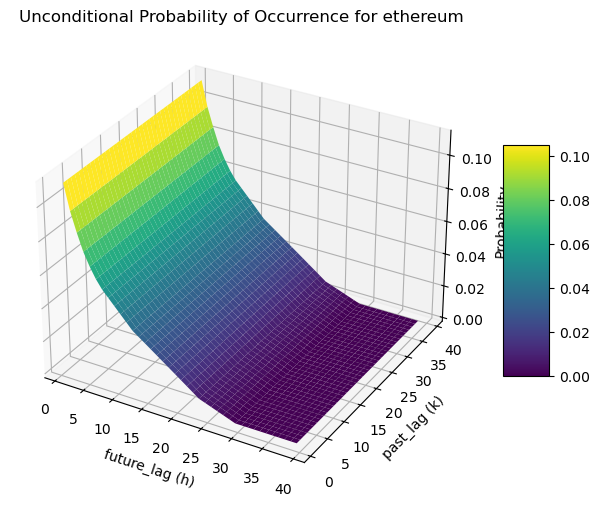

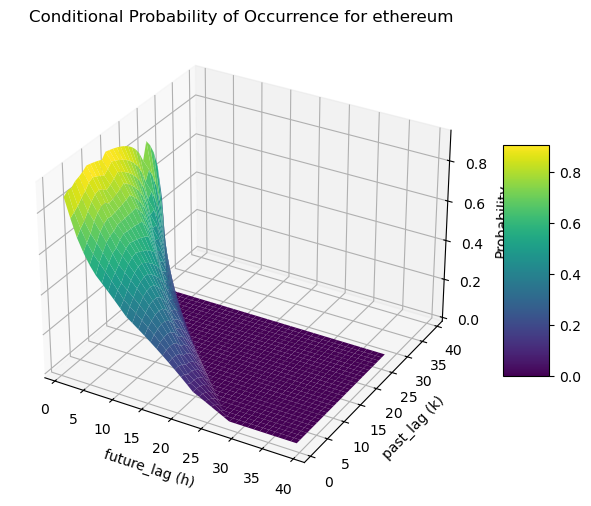

In [117]:

K, H, surf = probability_surface_for_coin(
  mrl_df,
  coin='ethereum',
  value=1,
  conditional=False,
  k_grid=range(1,40),
  h_grid=range(1,40),
  plot=True,
  plot_view="3d"   # try "2d" or "3d"
  )

_, _, _ = probability_surface_for_coin(
  mrl_df,
  coin='ethereum',
  value=1,
  conditional=True,
  k_grid=range(1,40),
  h_grid=range(1,40),
  plot=True,
  plot_view="3d"   # try "2d" or "3d"
  )



##### Remarks
- Notice how the the surface is smooth and downward sloping with respect to future lag. Moreover, it seems that we can use a small number of past lag parameter to conclude on the behaviour of future occurrence of coins within $mrl_t$. 
- Conditional probabilities, as we have postulated, seem to be much larger than their unconditional counterparts; this is more true in the case of positive occurrences, as we can see for the case of Ethereum. Unconditional probability of occurrence maxes out at 0.12 while conditioning on past lags result in maximum value of around 0.9.
- Using past_lag value of 7 seems reasonable; we can even set it to a smaller parameter according to the surface.
- We can perform some sort of resampling test like the permutation test to see how our estimate of conditional probabilities lie on the empirical distribution generated by resampling method. When taking this path, we should think more about the resampling methodology since we don't want to change any major temporal structure our intial sample has.

Now back to answering the main question we posed in the beginning of this section.

  "what should be the appropriate level of $q$ that doesn't incur too much trading costs while at the same time limiting the probability of maintaining a mean-reversion trade that lost its mean-reversion property?"

$q$ is basically the *optimal past lag parameter resulting in highest conditional probability of future exclusion given past exclusion (from mrl) while minimizing rebalancing costs*.

From our rough analysis, we see that stickyness was a feature prevalent regardless of the length of past_lag parameter. Therefore, our initial hypothesis of setting 7 days as our waiting time is reasonable according to the results.

# 4. Generate Signal Lines
Assume we will be trading the coins that passed the threshold set above (mean reversion time is around 1 week). 

The next important question we ask ourselves is, *how do we generate trading signals*? 

We can actually take several appraoches from here, and a detailed comparison analysis is required to decide the most appropriate one. In this paper, we will be adopting the methodology proposed by Avellaneda (2008); generate dimensionless s-scores, look for upper and lower thresholds, generate trading signal for the first out of sample date, and then roll forward to repeat the previous steps, thus generating a sequence of OOS trading signals.

First, we generate s-scores and visualize them to see how they differ from the auxiliary series.

In [118]:
# Construct function to compute s-score df

def compute_s_scores(aux_df, ou_params_df, coef_df, date, mean_reverting_coins, modified = False):
    """
    Compute s-scores of auxiliary series for each coin i using:
      s_i(t) = [X_i(t) - m_i] / sigma_eq_i

    If modified = True, we compute modified s-score using:
      s_mod,i = s_i(t) - [alpha_i /kappa_i*sigma_eq,i]

    Dependencies
    ------------
    numpy, pandas
    
    Parameters
    ----------
    aux_df : pd.DataFrame
        Auxiliary series (rows=dates, columns=coins).
    ou_params_df : pd.DataFrame
        OU parameter DataFrame indexed by coin, with columns=["kappa", "m", "sigma", "sigma_eq", "tau"].

    coef_df : dictionary of pd.DataFrame
        key is coin. values are dataframes, where columns are predictor variables (includign cosntant), indexed by date
        The dataframe stores regression coefficient estimates
    
    date : date in string format
        date for which we extract the factor regression coefficients from the rolling regression dictionary
        
    mean_reverting_coins : List
        List containing the coin names that pass the threshold tau < T1 
        
    Returns
    -------
    sscore_df : pd.DataFrame
        s-score series with same shape as aux_df.
    """
    if modified:
        # Construct Extract regression coefficients for specific date
        hedge_ratio = {coin: coef_df[coin].loc[date].values for coin in coef_df.keys()}
        hedge_ratio_df = pd.DataFrame(hedge_ratio, index = coef_df["bitcoin"].loc[date].index).T

        # Extract drift values
        drift_vec = hedge_ratio_df["constant"]
        modified_sscore_dict = {}

    sscore_dict = {}
    for coin in mean_reverting_coins:
        
        m_i = ou_params_df.loc[coin, "m"]
        sigma_eq_i = ou_params_df.loc[coin, "sigma_eq"]
        
        # s(t) = [X_i(t) - m_i] / sigma_eq_i
        # handle if sigma_eq_i is zero or NaN
        if (not pd.isna(sigma_eq_i)) and (sigma_eq_i != 0):
            sscore_dict[coin] = np.insert(((aux_df[coin].iloc[1:] - m_i) / sigma_eq_i) , 0, 0) # Set s-score to zero initially, since 0 in auxiliary series was set arbitrarily
        else:
            # degenerate => s-score is NaN
            sscore_dict[coin] = np.nan
        
        if modified:
            alpha_i = hedge_ratio_df.loc[coin]["constant"]
            modified_sscore_dict[coin] = np.insert(sscore_dict[coin][1:] - alpha_i / (ou_params_df.loc[coin]["kappa"] - ou_params_df.loc[coin]["sigma_eq"]),0,0)   
    
    mod_sscore_df = pd.DataFrame(modified_sscore_dict, index = aux_df.index)
    sscore_df = pd.DataFrame(sscore_dict, index=aux_df.index)
    if modified:
        return sscore_df, mod_sscore_df
    else:
        return sscore_df

            algorand  avalanche       bnb   cardano  chainlink  dogecoin  \
2022-05-02  0.000000   0.000000  0.000000  0.000000   0.000000  0.000000   
2022-05-03 -0.171866   1.903175 -0.328533 -2.903934  -3.109567  3.098338   
2022-05-04 -0.676288   2.634376 -0.864146 -2.061587  -2.890557  1.763660   
2022-05-05 -1.336110   2.287650 -0.485920 -2.220657  -2.864265  2.153160   
2022-05-06  0.952073   2.407221 -0.575556 -2.264587  -2.700092  1.558263   
...              ...        ...       ...       ...        ...       ...   
2022-06-27 -0.712933   0.311629 -0.539071 -0.451440  -0.725269  1.292032   
2022-06-28 -0.589732   0.556577 -0.296826 -0.198790  -0.484641  0.662893   
2022-06-29 -1.081258   0.496266 -0.791715 -0.118127  -0.492471  2.051668   
2022-06-30  0.026427  -0.119595 -0.568085 -0.223939  -0.384504  0.959574   
2022-07-01 -0.160738  -0.727944 -0.548811 -0.075760  -0.329271  1.553172   

                 hex  litecoin    monero  near-protocol  polkadot-new  \
2022-05-02  0.

C:\Users\idkup\AppData\Local\Temp\ipykernel_40564\3583541690.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (10,6))


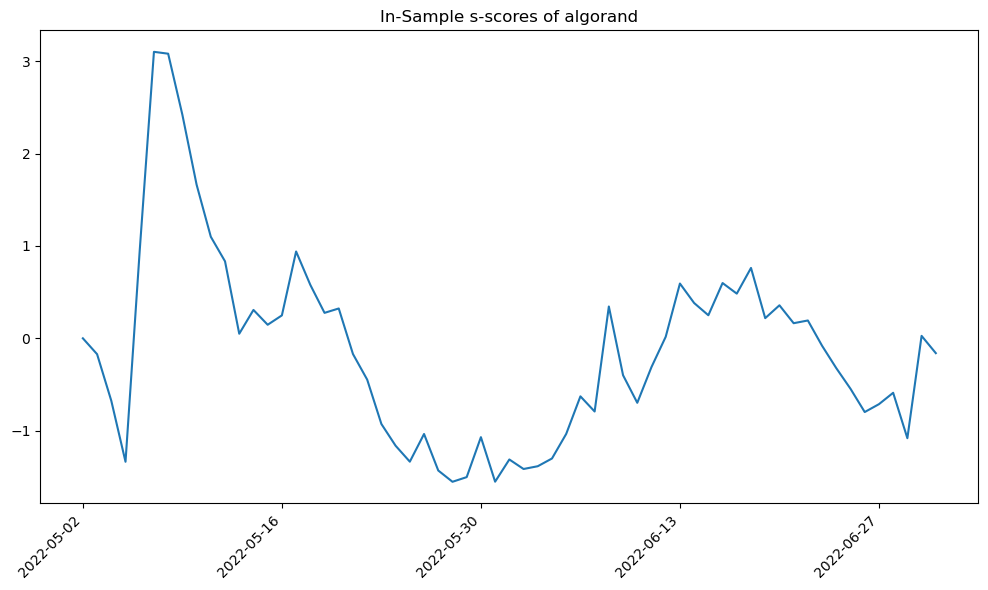

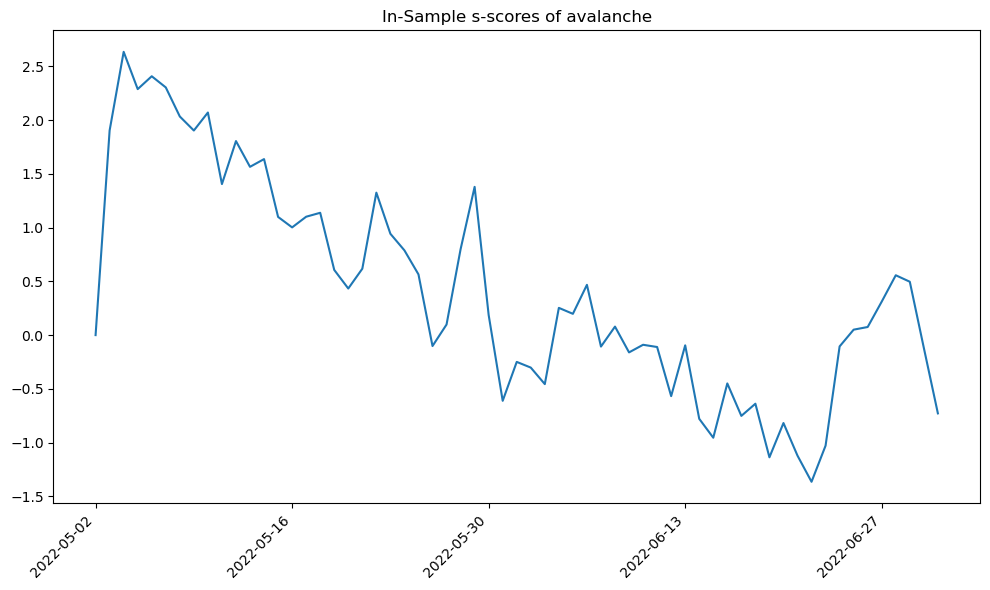

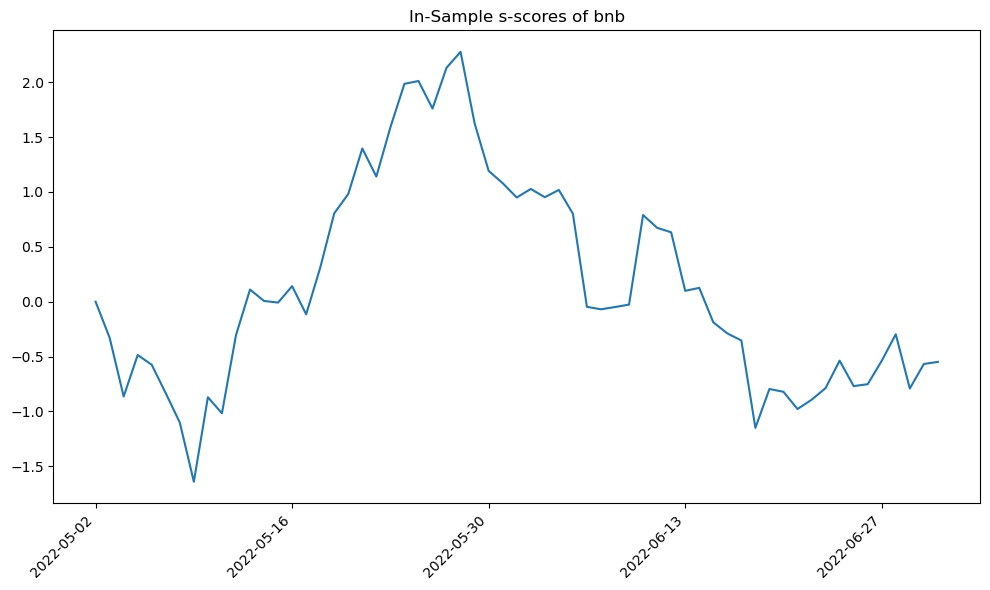

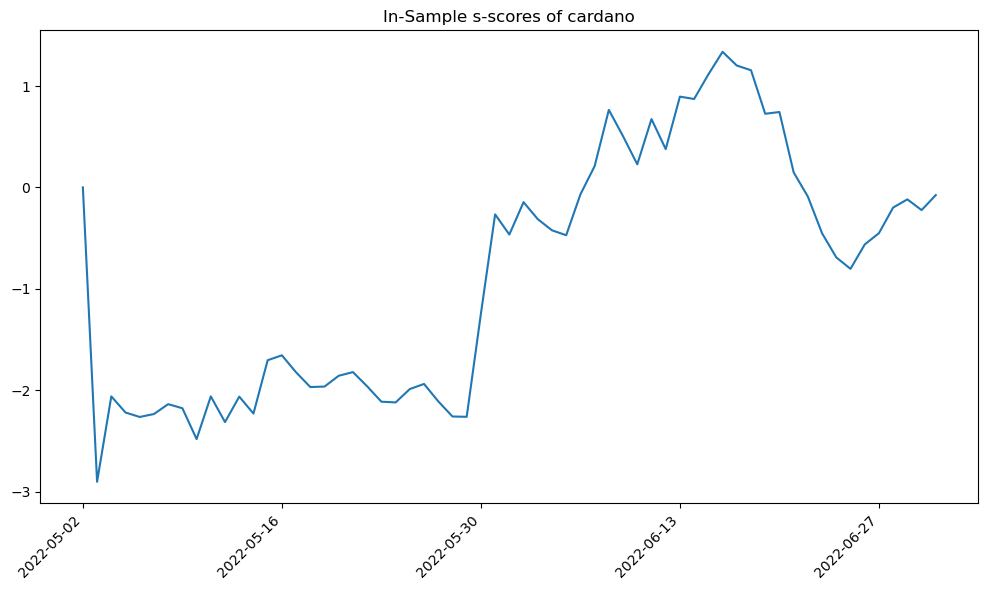

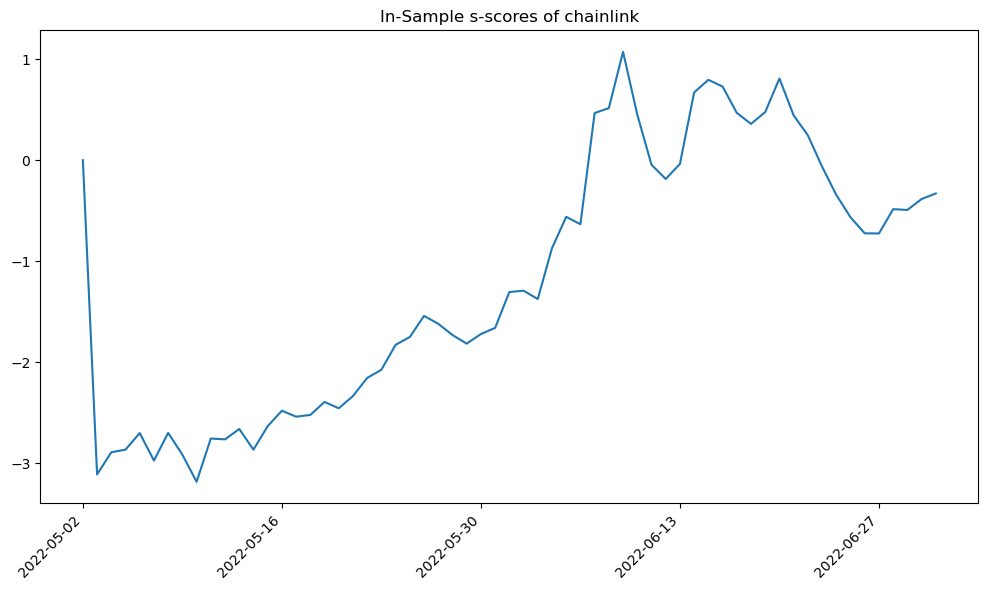

...

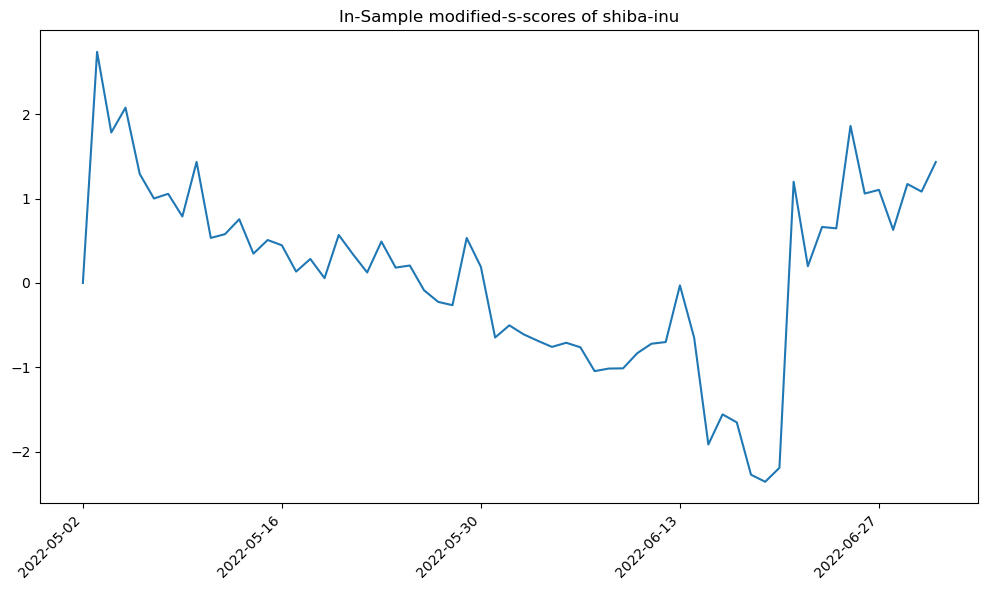

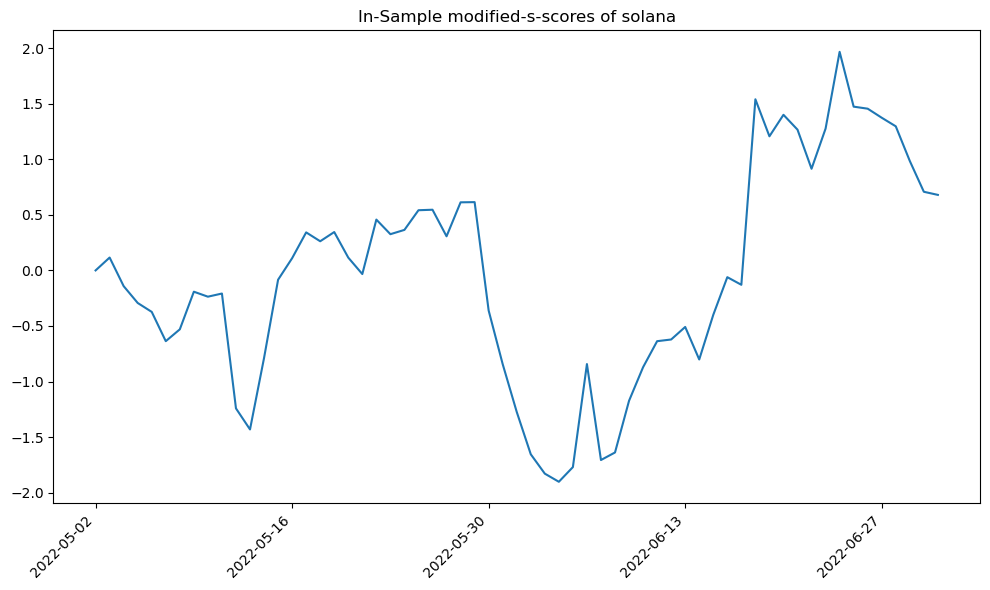

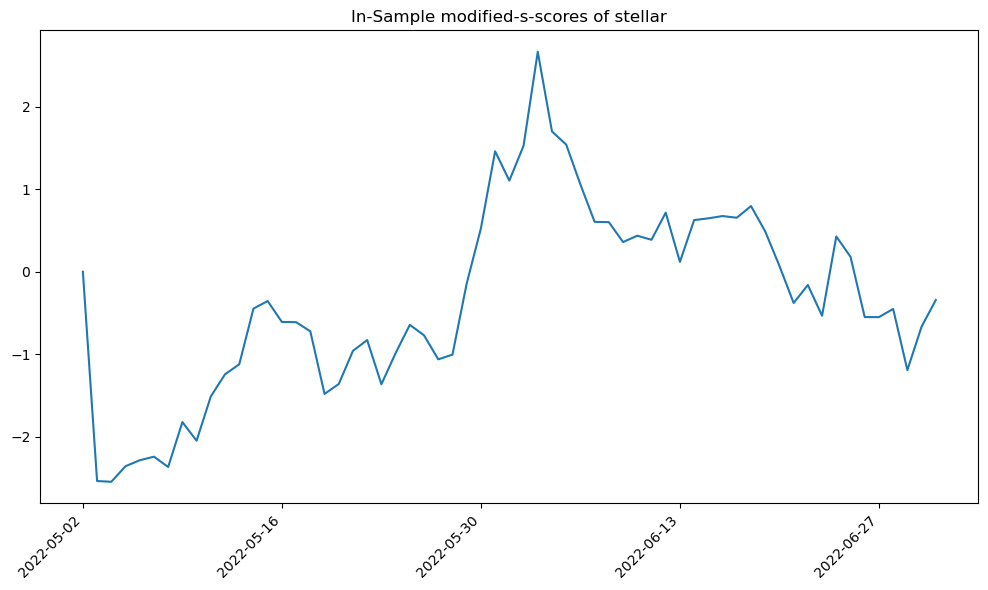

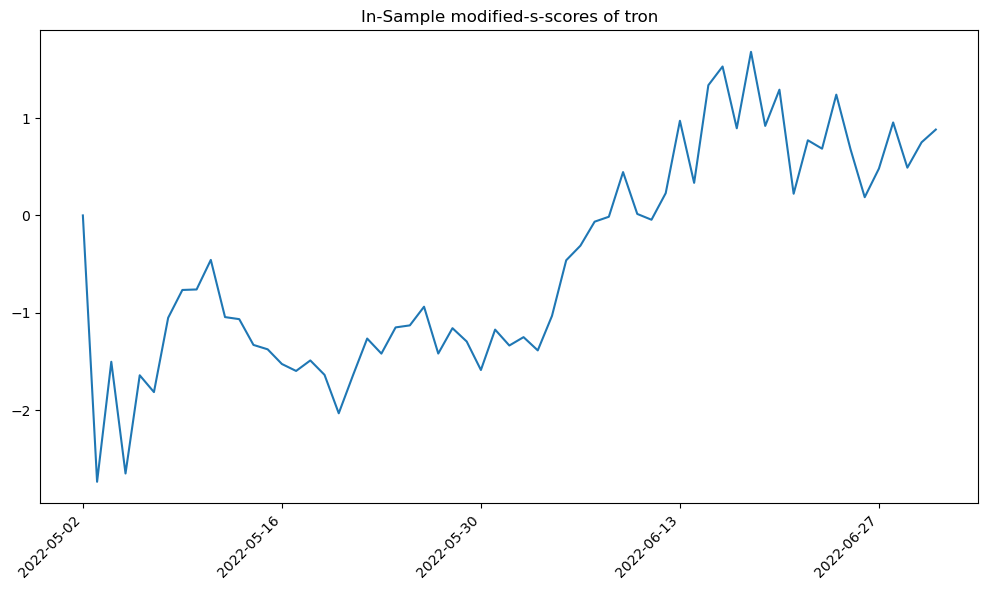

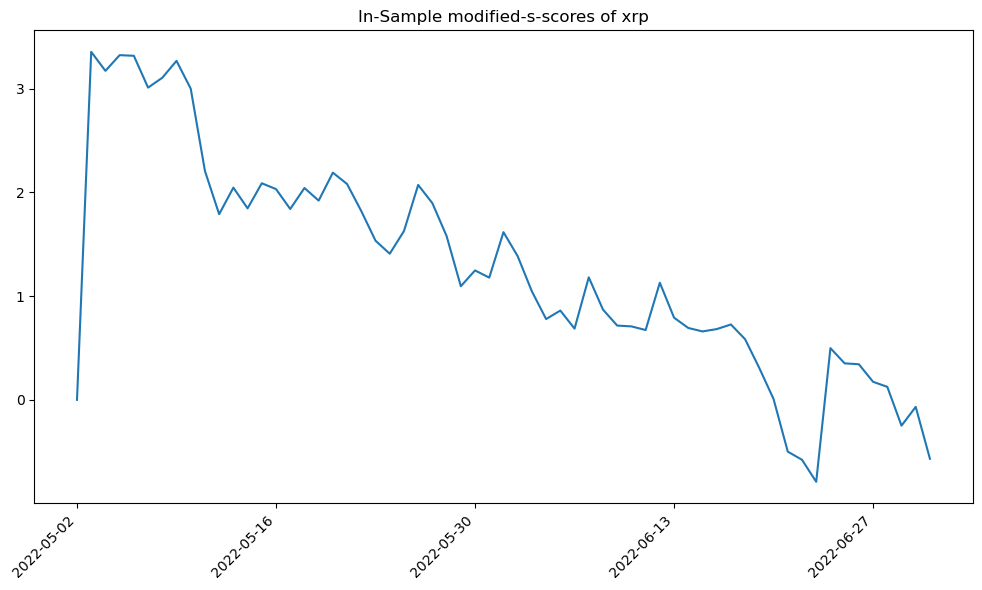

In [120]:
# Test function
test_sscore_df, test_mod_sscore_df = compute_s_scores(test_aux_df, test_ou_params_df, coef_df=coef_df, date = "2022-07-01", mean_reverting_coins = test_tradable_coins, modified = True)

print(test_sscore_df.head())
print(test_mod_sscore_df.head())

# Plot s-scores
tick_interval = 14  # 14 days = 2 weeks


for column in test_sscore_df:
  plt.figure(figsize = (10,6))
  plt.plot(test_sscore_df.index, test_sscore_df[column], label = f"{column}")
  plt.title(f"In-Sample s-scores of {column}")
    # Step 1: Display date ticks every 2 weeks
  plt.xticks(test_sscore_df.index[::tick_interval])  # Show every 14th date
  # Step 2: Rotate for clarity
  plt.xticks(rotation=45, ha='right')
  plt.tight_layout()

for column in test_mod_sscore_df:
  plt.figure(figsize = (10,6))
  plt.plot(test_mod_sscore_df.index, test_mod_sscore_df[column], label = f"{column}")
  plt.title(f"In-Sample modified-s-scores of {column}")
  plt.xticks(test_mod_sscore_df.index[::tick_interval])  # Show every 14th date
  # Step 2: Rotate for clarity
  plt.xticks(rotation=45, ha='right')
  plt.tight_layout()
